# Riassunto dei codici finali per eventi SEP del Solar cycle 23



## Evento JAN 2005 

1. EPS 

2. HEPAD 




Colonne trovate: ['P2', 'P3', 'P4', 'P5', 'P6', 'P7']


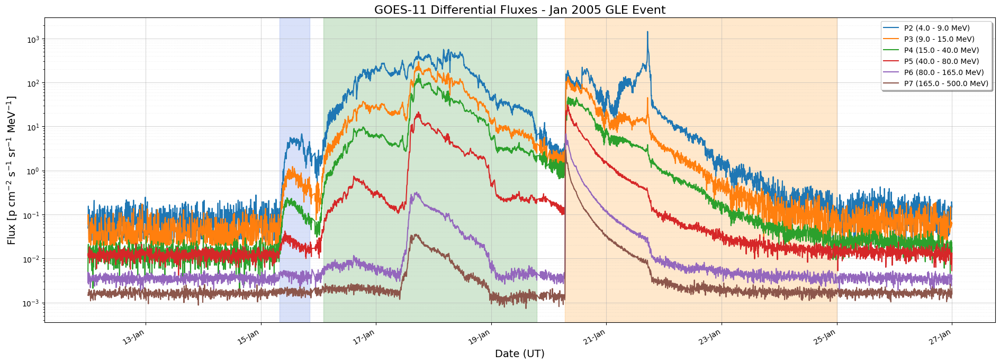

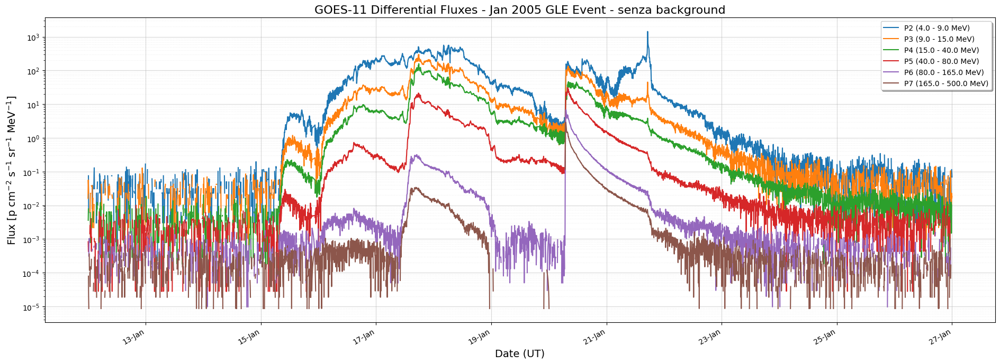

In [ ]:
import pandas as pd
import matplotlib.pyplot as plt
import matplotlib.dates as mdates
import numpy as np

# ==========================================
# 1. CARICAMENTO DATI
# ==========================================

file_path = "SEPEM_RDS_v3/SEPEM_RDS_v3-0/RDS3.0_H_EPS_GOES11.txt"

# Leggiamo il file. 
# skipinitialspace=True è il TRUCCO FONDAMENTALE:
# Dice a Pandas di ignorare lo spazio dopo la virgola (", P2" diventa "P2")
df = pd.read_csv(file_path, 
                 sep=',',                # Il file usa le virgole
                 skipinitialspace=True,  # Rimuove spazi extra nell'header (FIX KEYERROR)
                 index_col='epoch',      # La colonna 'epoch' è l'indice
                 parse_dates=['epoch'])  # Converte 'epoch' in date

df.columns = df.columns.str.strip()  # Rimuove spazi bianchi dai nomi delle colonne

print("Colonne trovate:", df.columns.tolist()) # Verifica: Ora dovresti vedere ['P2', 'P3'...] puliti

# ==========================================
# 2. SELEZIONE EVENTO JAN 2005
# ==========================================

t_start = '2005-01-05 00:00:00'
t_end   = '2005-01-27 00:00:00'

# Tagliamo il dataframe sull'evento
df_event = df.loc[t_start:t_end]

#background removal 
bg_start = '2005-01-12 00:00:00'
bg_end   = '2005-01-14 00:00:00'
bg_flux = df.loc[bg_start:bg_end].mean()
df_corrected = (df_event - bg_flux)
df_corrected[df_corrected < 0] = np.nan 





# ==========================================
# 3. PLOT FLUSSI DIFFERENZIALI
# ==========================================

# Mappa energie per la legenda (da documentazione SEPEM GOES-11)
energy_labels = {
    'P2': '4.0 - 9.0 MeV',
    'P3': '9.0 - 15.0 MeV',
    'P4': '15.0 - 40.0 MeV',
    'P5': '40.0 - 80.0 MeV',
    'P6': '80.0 - 165.0 MeV',
    'P7': '165.0 - 500.0 MeV'
}
events_dict_for_visualization = {
    "1° SEP  15/01 07:55 - 15/01 20:25": {
        "start": "2005-01-15 07:55", "end": "2005-01-15 20:25", "color": "royalblue"
    },
    "2° SEP  16/01 02:10 - 19/01 19:00": {
        "start": "2005-01-16 02:10", "end": "2005-01-19 19:00", "color": "forestgreen"
    },
    "3° SEP 20/01 06:40 - 25/01 00:00":{
        "start": "2005-01-20 06:40", "end": "2005-01-25 00:00", "color": "darkorange"
    }
}



plt.figure(figsize=(19, 7))

# Plot di ogni canale presente
for col in ['P2', 'P3', 'P4', 'P5', 'P6', 'P7']:
    if col in df_event.columns:
        plt.plot(df_event.index, df_event[col], label=f"{col} ({energy_labels[col]})", linewidth=1.5)

# Styling
plt.yscale('log')
plt.title('GOES-11 Differential Fluxes - Jan 2005 GLE Event', fontsize=16)
plt.ylabel(r'Flux [p cm$^{-2}$ s$^{-1}$ sr$^{-1}$ MeV$^{-1}$]', fontsize=14)
plt.xlabel('Date (UT)', fontsize=14)
plt.grid(True, which="major", alpha=0.5)
plt.grid(True, which="minor", alpha=0.2, linestyle=':')
plt.legend(loc='upper right', shadow=True, fontsize=10)

#events shading from events_dict_for_visualization
# Shade events
for event_name, event_info in events_dict_for_visualization.items():
    plt.axvspan(pd.to_datetime(event_info["start"]), 
                pd.to_datetime(event_info["end"]), 
                color=event_info["color"], alpha=0.2, label=event_name)






# Formattazione date asse X
plt.gca().xaxis.set_major_formatter(mdates.DateFormatter('%d-%b'))
plt.gcf().autofmt_xdate()

plt.tight_layout()
plt.show()



plt.figure(figsize=(19, 7))

# Plot di ogni canale presente
for col in ['P2', 'P3', 'P4', 'P5', 'P6', 'P7']:
    if col in df_corrected.columns:
        plt.plot(df_corrected.index, df_corrected[col], label=f"{col} ({energy_labels[col]})", linewidth=1.5)

# Styling
plt.yscale('log')
plt.title('GOES-11 Differential Fluxes - Jan 2005 GLE Event - senza background', fontsize=16)
plt.ylabel(r'Flux [p cm$^{-2}$ s$^{-1}$ sr$^{-1}$ MeV$^{-1}$]', fontsize=14)
plt.xlabel('Date (UT)', fontsize=14)
plt.grid(True, which="major", alpha=0.5)
plt.grid(True, which="minor", alpha=0.2, linestyle=':')
plt.legend(loc='upper right', shadow=True, fontsize=10)


# Formattazione date asse X
plt.gca().xaxis.set_major_formatter(mdates.DateFormatter('%d-%b'))
plt.gcf().autofmt_xdate()

plt.tight_layout()
plt.show()



In [13]:
plt.close('all')  # Chiude tutte le figure aperte

Colonne HEPAD trovate: ['P8', 'P9', 'P10']


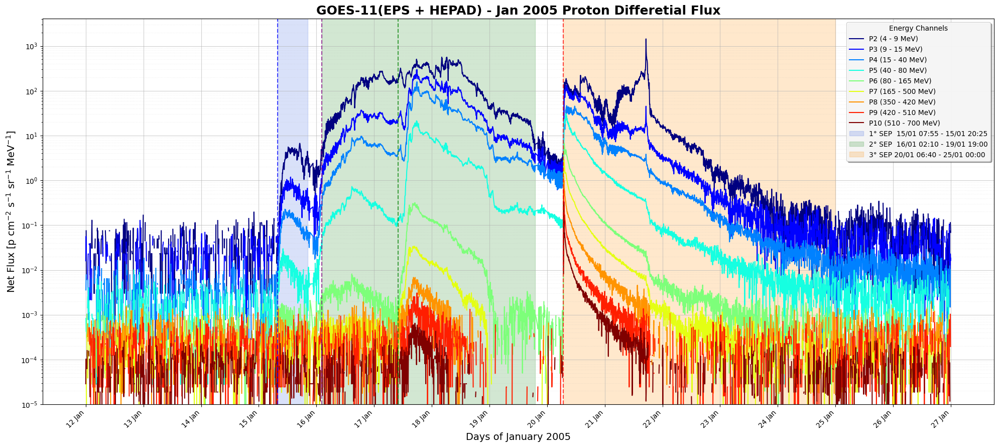

In [2]:
# Adding HEPAD data from file RDS3.0_H_HEPAD_GOES11.txt

file_path_hepad = "SEPEM_RDS_v3/SEPEM_RDS_v3-0/RDS3.0_H_HEPAD_GOES11.txt"
df_hepad = pd.read_csv(file_path_hepad, 
                 sep=',',                # Il file usa le virgole
                 skipinitialspace=True,  # Rimuove spazi extra nell'header (FIX KEYERROR)
                 index_col='epoch',      # La colonna 'epoch' è l'indice
                 parse_dates=['epoch'])  # Converte 'epoch' in date
print("Colonne HEPAD trovate:", df_hepad.columns.tolist())
# --- IGNORE ---

# Taglio temporale
df_hepad_event = df_hepad.loc[t_start:t_end]

# Background
bg_flux_hepad = df_hepad.loc[bg_start:bg_end].mean()

# Sottrazione background
df_hepad_corrected = df_hepad_event - bg_flux_hepad
df_hepad_corrected[df_hepad_corrected < 0] = np.nan





#concat dataframes
df_total = pd.concat([df_corrected, df_hepad_corrected], axis=1).sort_index()

# ==========================================

# plot completo 
# ==========================================
# 4. PLOT COMPLETO
# ==========================================

# Mappa completa (EPS + HEPAD)
energy_labels = {
    'P2': '4 - 9 MeV',
    'P3': '9 - 15 MeV',
    'P4': '15 - 40 MeV',
    'P5': '40 - 80 MeV',
    'P6': '80 - 165 MeV',
    'P7': '165 - 500 MeV',
    'P8': '350 - 420 MeV',  # HEPAD GOES-11
    'P9': '420 - 510 MeV',
    'P10': '510 - 700 MeV'
}

plt.figure(figsize=(20, 9))

# Colori: usiamo una colormap per distinguere bene le energie
colors = plt.cm.jet(np.linspace(0, 1, len(energy_labels)))

for i, col in enumerate(energy_labels.keys()):
    if col in df_total.columns:
        # Se HEPAD è vuoto (perché ho usato i dati dummy del 2003 nel codice sopra), 
        # non lo vedrai nel plot 2005. Assicurati di caricare il file HEPAD giusto!
        plt.plot(df_total.index, df_total[col], 
                 label=f"{col} ({energy_labels[col]})", 
                 color=colors[i], linewidth=1.5)
        


        
# vertical dotted line for ontime set 06:36 20/09
plt.axvline(pd.to_datetime("2005-01-15 07:55"), color='blue', linestyle='--', alpha=0.7)
plt.axvline(pd.to_datetime("2005-01-16 02:10"), color='purple', linestyle='--', alpha=0.7)
plt.axvline(pd.to_datetime("2005-01-17 09:54"), color='green', linestyle='--', alpha=0.7)
plt.axvline(pd.to_datetime("2005-01-20 06:40"), color='red', linestyle='--', alpha=0.7)

#events shading from events_dict_for_visualization
# Shade events
for event_name, event_info in events_dict_for_visualization.items():
    plt.axvspan(pd.to_datetime(event_info["start"]), 
                pd.to_datetime(event_info["end"]), 
                color=event_info["color"], alpha=0.2, label=event_name)




# Styling Professionale
plt.yscale('log')
plt.ylim(bottom=1e-5) # Limite basso per vedere anche i flussi deboli HEPAD
plt.ylabel(r'Net Flux [p cm$^{-2}$ s$^{-1}$ sr$^{-1}$ MeV$^{-1}$]', fontsize=14)
plt.xlabel('Days of January 2005', fontsize=14)
plt.title('GOES-11(EPS + HEPAD) - Jan 2005 Proton Differetial Flux', fontsize=18, fontweight='bold')

plt.grid(True, which="major", alpha=0.6)
plt.grid(True, which="minor", alpha=0.2, linestyle=':')

# Assi temporali giornalieri
plt.gca().xaxis.set_major_locator(mdates.DayLocator(interval=1))
plt.gca().xaxis.set_major_formatter(mdates.DateFormatter('%d %b'))
plt.gcf().autofmt_xdate(rotation=45)

# Legenda esterna o interna
plt.legend(loc='upper right', shadow=True, fontsize=10, framealpha=0.9, title="Energy Channels")

plt.tight_layout()
plt.show()


## Calcolo fluenza 

In [3]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from scipy.optimize import curve_fit

# ==========================================
# 1. SETUP: CANALI & EVENTI
# ==========================================

# Bordi dei canali (Min, Max) [MeV]
channel_bins = {
    'P2': (4.0, 9.0),   'P3': (9.0, 15.0),  'P4': (15.0, 40.0),
    'P5': (40.0, 80.0), 'P6': (80.0, 165.0), 'P7': (165.0, 500.0),
    'P8': (350.0, 420.0), 'P9': (420.0, 510.0), 'P10': (510.0, 700.0)
}



# Energie Efficaci (SEPEM Calib) [MeV]
e_eff_map = {
    'P2': 6.643, 'P3': 12.61, 'P4': 20.55, 
    'P5': 46.62, 'P6': 103.7, 'P7': 154.6,
    'P8': 406.0, 'P9': 457.0, 'P10': 583.0
}


# Definizione Temporale Eventi (Non sovrapposti)
#events_dict = {
 #   "1° SEP (X2.6) 15/01 23:00 - 17/01 09:30": {
  #      "start": "2005-01-15 23:00", "end": "2005-01-17 09:30", "color": "royalblue"
   # },
    #"2° SEP (X3.8) 17/01 09:30 - 20/01 06:30": {
     #   "start": "2005-01-17 09:30", "end": "2005-01-20 06:30", "color": "forestgreen"
    #},
    #"3° SEP (X7.1) 20/01 06:50 - 25/01 00:00": {
     #   "start": "2005-01-20 06:50", "end": "2005-01-25 00:00", "color": "firebrick"
    #}
#}


events_dict = {
    "1° SEP  15/01 07:55 - 15/01 20:25": {
        "start": "2005-01-15 07:55", "end": "2005-01-15 20:25", "color": "royalblue"
    },
    "2° SEP  16/01 02:10 - 19/01 19:00": {
        "start": "2005-01-16 02:10", "end": "2005-01-19 19:00", "color": "forestgreen"
    },
    "3° SEP 20/01 06:40 - 25/01 00:00":{
        "start": "2005-01-20 06:40", "end": "2005-01-25 00:00", "color": "darkorange"
    }
}



# Calcolo Fluenza 

# ==========================================
# 2. CALCOLO DELLA FLUENZA (INTEGRAZIONE)
# ==========================================
results = {}

print("--- Calcolo Fluenze Integrate ---")

for name, params in events_dict.items():
    # A. Slice Temporale
    # Assumo che df_total sia il dataframe completo (EPS+HEPAD) già background-subtracted
    df_slice = df_total.loc[params['start']:params['end']]
    
    # B. Calcolo Passo Temporale (dt in secondi)
    # Fondamentale per l'integrale: Fluenza = Sum(Flux * dt)
    # Usiamo la media delle differenze temporali per robustezza
    dt_seconds = df_slice.index.to_series().diff().dt.total_seconds().fillna(300)
    
    fluences = []
    energies = []
    x_err_low = []
    x_err_high = []
    
    for col, (E_min, E_max) in channel_bins.items():
        if col in df_slice.columns:
        # 1. Pulizia: NaN -> 0, Negativi -> 0 (per l'integrazione)
            flux_clean = df_slice[col].fillna(0).clip(lower=0)

            # 2. Fluence dell'evento
            fluence_val = (flux_clean * dt_seconds).sum()

            # 3. Rumore del background (std reale del canale)
            bg_std = df_total.loc[bg_start:bg_end][col].std()

            # Numero di misure nell'evento
            N = flux_clean.count()

            # Errore sulla fluence (propagazione del rumore)
            sigma_fluence = bg_std * np.sqrt(N) * np.nanmedian(dt_seconds)

            # 4. SNR-fluence
            SNR = fluence_val / sigma_fluence if sigma_fluence > 0 else 0

            # 5. Accetto SOLO punti con SNR >= 3
            if SNR < 3: 
                continue

            # Se arriva qui → punto valido
            fluences.append(fluence_val)
            energies.append(e_eff_map[col])
            x_err_low.append(e_eff_map[col] - E_min)
            x_err_high.append(E_max - e_eff_map[col])

    
    # Salvataggio dati pronti per il fit
    results[name] = {
        'x': np.array(energies),
        'y': np.array(fluences),
        'x_err': [np.array(x_err_low), np.array(x_err_high)],
        'color': params['color']
    }
    print(f"{name}: {len(fluences)} punti validi estratti.")


--- Calcolo Fluenze Integrate ---
1° SEP  15/01 07:55 - 15/01 20:25: 9 punti validi estratti.
2° SEP  16/01 02:10 - 19/01 19:00: 9 punti validi estratti.
3° SEP 20/01 06:40 - 25/01 00:00: 9 punti validi estratti.


## FIT 


In [4]:
def ellison_ramaty(E, A,gamma,Er):
    return  A * (E**(-gamma)) * np.exp(-E/Er)

def band_function(E, A, ga, gb, E0):
    # Protezione fisica: gb deve essere maggiore di ga (lo spettro deve scendere)
    # Aggiungiamo un epsilon per evitare divisioni per zero
    if gb <= ga:
        return np.ones_like(E) * 1e-30 # Ritorna quasi zero per scartare questo fit
        
    E_break = (gb - ga) * E0
    
    # Protezione matematica extra
    if E_break <= 0:
        return np.ones_like(E) * 1e-30

    res = np.zeros_like(E)
    mask_low = E < E_break
    
    # Parte bassa
    # Aggiungiamo np.abs per sicurezza matematica, anche se mask_low protegge
    res[mask_low] = A * (E[mask_low] ** -ga) * np.exp(-E[mask_low] / E0)
    
    # Parte alta
    norm_factor = (E_break ** (gb - ga)) * np.exp(ga - gb)
    res[~mask_low] = A * (E[~mask_low] ** -gb) * norm_factor
    
    return res
def combined_function(E,A,ga,gb,E0,Er):
    return band_function(E,A,ga,gb,E0) * np.exp(-E/Er)


# Fit logaritmico 

def fit_log_space (func, x, y, y_err, p0, bounds=(-np.inf, np.inf)):
    def log_func(x_in, *params):
        return np.log10(np.maximum(func(x_in, *params), 1e-30))  # Evita log(0)
    
    sigma_log = y_err / (y * np.log(10))
    sigma_log = np.nan_to_num(sigma_log, nan=1.0, posinf=1.0, neginf=1.0)
    
    try: 
        return curve_fit(log_func,x , np.log10(y), p0=p0, sigma=sigma_log, absolute_sigma=True, bounds=bounds, maxfev=15000)
    except: return None,None 

# Helper: Statistiche Formattate
def get_stats_text(model_name, func, x, y, y_err, popt, pcov):
    if popt is None: return f"{model_name}: Fit Failed"
    
    # Chi-Quadro Ridotto
    residuals = (y - func(x, *popt)) / y_err
    chi_sq = np.sum(residuals**2)
    dof = len(y) - len(popt)
    chi_red = chi_sq / dof if dof > 0 else 0.0
    
    perr = np.sqrt(np.diag(pcov))
    
    # Testo Legenda
    txt = rf"$\bf{{{model_name}}}$ ($\chi^2_\nu={chi_red:.1f}$)" + "\n"
    if model_name == "Ellison-Ramaty":
        txt += rf" $\gamma$: {popt[1]:.2f} $\pm$ {perr[1]:.2f}" + "\n"
        txt += rf" $E_r$: {popt[2]:.0f} $\pm$ {perr[2]:.0f} MeV"
    elif model_name == "Band":
        txt += rf" $\gamma_a$: {popt[1]:.2f} $\pm$ {perr[1]:.2f}" + "\n"
        txt += rf" $\gamma_b$: {popt[2]:.2f} $\pm$ {perr[2]:.2f}" + "\n"
        txt += rf" $E_0$: {popt[3]:.1f} $\pm$ {perr[3]:.1f} MeV"
    elif model_name == "Combined":
        if popt[4] > 4000: txt += " Cutoff: Power Law Limit"
        else: txt += rf" $E_{{cut}}$: {popt[4]:.0f} $\pm$ {perr[4]:.0f} MeV"
    return txt

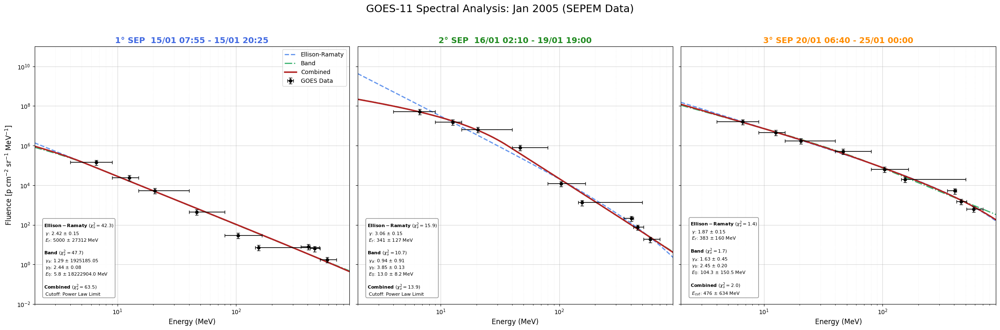

In [5]:
# Plotting risultati FIT finale 
# ==========================================
# 4. PLOTTING FINALE (3 SUBPLOTS)
# ==========================================

fig, axes = plt.subplots(1, 3, figsize=(24, 8), sharey=True)
axes = axes.flatten()
x_plot = np.logspace(np.log10(2), np.log10(1000), 500)

for i, (evt_name, data) in enumerate(results.items()):
    ax = axes[i]
    x, y, x_err, color = data['x'], data['y'], data['x_err'], data['color']
    
    # 1. Errore Verticale (Sistematico 20%)
    y_err = y * 0.30


#------------------------
     # --- FIX CRUCIALE PER 'ValueError' ---
    # Recuperiamo gli errori raw
    x_errs_raw = data['x_err'] 
    # Forziamo il valore assoluto su entrambi i lati (sx e dx)
    x_errs_clean = [np.abs(x_errs_raw[0]), np.abs(x_errs_raw[1])]
#----------------------------------
    # 2. Plot Dati (Croci Nere)
    ax.errorbar(x, y, yerr=y_err, xerr=x_errs_clean, fmt='o', color='black', ecolor='black', 
                capsize=3, elinewidth=1.2, markersize=5, label='GOES Data', zorder=10)
    
    stats_box = ""
    
    # --- FIT ELLISON-RAMATY ---
    p0 = [1e7, 2.0, 100.0]
    popt, pcov = fit_log_space(ellison_ramaty, x, y, y_err, p0, bounds=([0,0,0], [np.inf, 10, 5000]))
    if popt is not None:
        ax.plot(x_plot, ellison_ramaty(x_plot, *popt), '--', color='cornflowerblue', linewidth=2, label='Ellison-Ramaty')
        stats_box += get_stats_text("Ellison-Ramaty", ellison_ramaty, x, y, y_err, popt, pcov) + "\n\n"

    # --- FIT BAND FUNCTION ---
    bounds_band = ([0,0.1,0.1,0.5], [np.inf, 10.0, 10.0, 1000.0])
    p0 = [1e6, 1.5, 3.5, 15.0]
    popt_b, pcov_b = fit_log_space(band_function, x, y, y_err, p0, bounds=bounds_band)
    if popt_b is not None:
        ax.plot(x_plot, band_function(x_plot, *popt_b), '-.', color='mediumseagreen', linewidth=2, label='Band')
        stats_box += get_stats_text("Band", band_function, x, y, y_err, popt_b, pcov_b) + "\n\n"

    # --- FIT COMBINED ---
    if popt_b is not None:
        p0_c = [*popt_b, 500.0]
        popt_c, pcov_c = fit_log_space(combined_function, x, y, y_err, p0_c, bounds=([0,0,0,0,10], [np.inf, 10, 10, 500, 5000]))
        if popt_c is not None:
            ax.plot(x_plot, combined_function(x_plot, *popt_c), '-', color='firebrick', linewidth=2.5, label='Combined')
            stats_box += get_stats_text("Combined", combined_function, x, y, y_err, popt_c, pcov_c)

    # Styling
    ax.set_title(evt_name, fontsize=14, color=color, fontweight='bold')
    ax.set_xscale('log'); ax.set_yscale('log')
    ax.set_ylim(1e-2, 1e11); ax.set_xlim(2, 900)
    ax.grid(True, which="major", alpha=0.5); ax.grid(True, which="minor", alpha=0.2, linestyle=':')
    ax.set_xlabel("Energy (MeV)", fontsize=12)
    
    if i == 0: 
        ax.set_ylabel(r"Fluence [p cm$^{-2}$ sr$^{-1}$ MeV$^{-1}$]", fontsize=12)
        ax.legend(loc='upper right')
        
    ax.text(0.03, 0.03, stats_box, transform=ax.transAxes, fontsize=8, 
            verticalalignment='bottom', bbox=dict(boxstyle="round", facecolor='white', alpha=0.92, edgecolor='gray'))

plt.suptitle("GOES-11 Spectral Analysis: Jan 2005 (SEPEM Data)", fontsize=18, y=0.98)
plt.tight_layout(rect=[0, 0.0, 1, 0.95])
plt.show()


EPS columns:   ['P2', 'P3', 'P4', 'P5', 'P6', 'P7']
HEPAD columns: ['P8', 'P9', 'P10']

--- Calcolo Fluenze integrate (SNR ≥ 2) ---
1° SEP  15/01 07:55 - 15/01 20:25: 9 canali usati
2° SEP  16/01 02:10 - 19/01 19:00: 9 canali usati
3° SEP 20/01 06:40 - 25/01 00:00: 9 canali usati


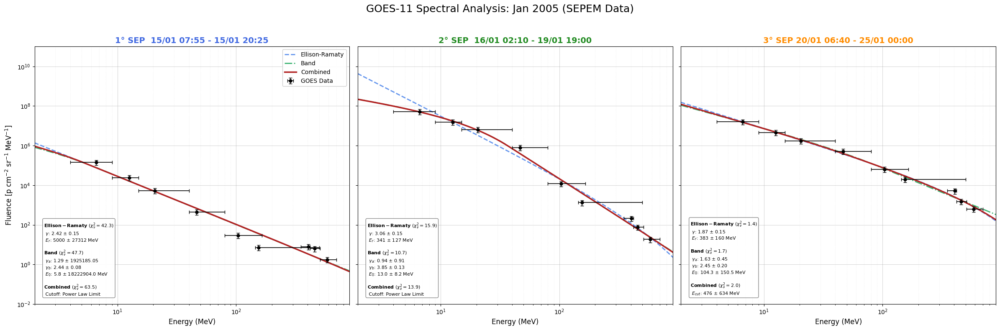

In [6]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import matplotlib.dates as mdates
from scipy.optimize import curve_fit

# ============================================================
# 1) CARICAMENTO DATI EPS + HEPAD
# ============================================================

file_eps   = "SEPEM_RDS_v3/SEPEM_RDS_v3-0/RDS3.0_H_EPS_GOES11.txt"
file_hepad = "SEPEM_RDS_v3/SEPEM_RDS_v3-0/RDS3.0_H_HEPAD_GOES11.txt"

df_eps = pd.read_csv(file_eps, sep=',', skipinitialspace=True,
                     index_col='epoch', parse_dates=['epoch'])
df_hepad = pd.read_csv(file_hepad, sep=',', skipinitialspace=True,
                       index_col='epoch', parse_dates=['epoch'])

df_eps.columns   = df_eps.columns.str.strip()
df_hepad.columns = df_hepad.columns.str.strip()

print("EPS columns:  ", df_eps.columns.tolist())
print("HEPAD columns:", df_hepad.columns.tolist())

# Intervallo di interesse e background
t_start  = "2005-01-12 00:00:00"
t_end    = "2005-01-27 00:00:00"
bg_start = "2005-01-12 00:00:00"
bg_end   = "2005-01-14 00:00:00"

# Selezione temporale
df_eps_evt   = df_eps.loc[t_start:t_end]
df_hepad_evt = df_hepad.loc[t_start:t_end]

# Background (mean) per canale
bg_eps   = df_eps.loc[bg_start:bg_end].mean()
bg_hepad = df_hepad.loc[bg_start:bg_end].mean()

# Sottrazione background
df_eps_corr   = df_eps_evt   - bg_eps
df_hepad_corr = df_hepad_evt - bg_hepad

df_eps_corr[df_eps_corr < 0]     = np.nan
df_hepad_corr[df_hepad_corr < 0] = np.nan

# DataFrame totale (flux corretti)
df_total = pd.concat([df_eps_corr, df_hepad_corr], axis=1).sort_index()

# DF "raw" per stimare la sigma del background nei singoli canali
df_all_raw = pd.concat([df_eps, df_hepad], axis=1).sort_index()


# ============================================================
# 2) DEFINIZIONE CANALI, ENERGIE, EVENTI
# ============================================================

channel_bins = {
    'P2': (4.0, 9.0),   'P3': (9.0, 15.0),   'P4': (15.0, 40.0),
    'P5': (40.0, 80.0), 'P6': (80.0, 165.0), 'P7': (165.0, 500.0),
    'P8': (350.0, 420.0), 'P9': (420.0, 510.0), 'P10': (510.0, 700.0)
}

e_eff = {
    'P2': 6.643, 'P3': 12.61, 'P4': 20.55,
    'P5': 46.62, 'P6': 103.7, 'P7': 154.6,
    'P8': 406.0, 'P9': 457.0, 'P10': 583.0
}

events = {
    "1° SEP  15/01 07:55 - 15/01 20:25": {
        "start": "2005-01-15 07:55", "end": "2005-01-15 20:25", "color": "royalblue"
    },
    "2° SEP  16/01 02:10 - 19/01 19:00": {
        "start": "2005-01-16 02:10", "end": "2005-01-19 19:00", "color": "forestgreen"
    },
    "3° SEP 20/01 06:40 - 25/01 00:00":{
        "start": "2005-01-20 06:40", "end": "2005-01-25 00:00", "color": "darkorange"
    }
}

# ============================================================
# 3) CALCOLO FLUENZA CON SNR ≥ 2
# ============================================================

results = {}
print("\n--- Calcolo Fluenze integrate (SNR ≥ 2) ---")

for name, p in events.items():
    df_slice = df_total.loc[p["start"]:p["end"]]
    dt_seconds = df_slice.index.to_series().diff().dt.total_seconds().fillna(300)

    fluences = []
    energies = []
    x_err_low = []
    x_err_high = []

    for ch, (Emin, Emax) in channel_bins.items():
        if ch not in df_slice.columns:
            continue

        # flusso corretto per il canale (senza background)
        flux_clean = df_slice[ch].fillna(0).clip(lower=0)

        # fluence = ∑ flux * dt
        flu = (flux_clean * dt_seconds).sum()

        # sigma background dal dataset RAW (non sottratto)
        if ch in df_all_raw.columns:
            bg_std = df_all_raw.loc[bg_start:bg_end][ch].std()
        else:
            bg_std = 0.0

        N = flux_clean.count()
        sigma_flu = bg_std * np.sqrt(max(N, 1)) * np.nanmedian(dt_seconds)

        SNR = flu / sigma_flu if sigma_flu > 0 else 0.0

        if (flu > 0) and (SNR >= 3.0):
            fluences.append(flu)
            energies.append(e_eff[ch])
            x_err_low.append(abs(e_eff[ch] - Emin))
            x_err_high.append(abs(Emax - e_eff[ch]))

    results[name] = {
        "x": np.array(energies),
        "y": np.array(fluences),
        "x_err": [np.array(x_err_low), np.array(x_err_high)],
        "color": p["color"]
    }
    print(f"{name}: {len(fluences)} canali usati")


# ============================================================
# 4) MODELLI SPETTRALI E FUNZIONI DI FIT
# ============================================================

def ellison_ramaty(E, A, gamma, Er):
    return A * (E ** (-gamma)) * np.exp(-E / Er)

def band_function(E, A, ga, gb, E0):
    E_break = (gb - ga) * E0
    res = np.zeros_like(E)

    # parte bassa
    mask_low = E < E_break
    res[mask_low] = A * (E[mask_low] ** -ga) * np.exp(-E[mask_low] / E0)

    # parte alta (continuità in E_break)
    norm_factor = (E_break ** (gb - ga)) * np.exp(ga - gb)
    res[~mask_low] = A * (E[~mask_low] ** -gb) * norm_factor
    return res

def combined_function(E, A, ga, gb, E0, Er):
    return band_function(E, A, ga, gb, E0) * np.exp(-E / Er)


def fit_log_space(func, x, y, y_err, p0, bounds):
    """
    Fit in log10-space con pesi sigma_log ricavati da y_err.
    """
    def log_func(x_in, *params):
        return np.log10(np.maximum(func(x_in, *params), 1e-30))

    sigma_log = y_err / (y * np.log(10))
    sigma_log = np.nan_to_num(sigma_log, nan=1.0, posinf=1.0, neginf=1.0)

    try:
        popt, pcov = curve_fit(log_func, x, np.log10(y),
                               p0=p0, sigma=sigma_log,
                               absolute_sigma=True,
                               bounds=bounds, maxfev=20000)
        return popt, pcov
    except Exception:
        return None, None


def get_stats_text(model_name, func, x, y, y_err, popt, pcov):
    if popt is None:
        return f"{model_name}: Fit failed"

    residuals = (y - func(x, *popt)) / y_err
    chi_sq = np.sum(residuals**2)
    dof = len(y) - len(popt)
    chi_red = chi_sq / dof if dof > 0 else 0.0

    if pcov is not None:
        perr = np.sqrt(np.diag(pcov))
    else:
        perr = np.full_like(popt, np.nan, dtype=float)

    txt = rf"$\bf{{{model_name}}}$ ($\chi^2_\nu={chi_red:.1f}$)" + "\n"

    if model_name == "Ellison-Ramaty":
        txt += rf" $\gamma$: {popt[1]:.2f} $\pm$ {perr[1]:.2f}" + "\n"
        txt += rf" $E_r$: {popt[2]:.0f} $\pm$ {perr[2]:.0f} MeV"

    elif model_name == "Band":
        txt += rf" $\gamma_a$: {popt[1]:.2f} $\pm$ {perr[1]:.2f}" + "\n"
        txt += rf" $\gamma_b$: {popt[2]:.2f} $\pm$ {perr[2]:.2f}" + "\n"
        txt += rf" $E_0$: {popt[3]:.1f} $\pm$ {perr[3]:.1f} MeV"

    elif model_name == "Combined":
        if popt[4] > 4000:
            txt += " Cutoff: Power Law Limit"
        else:
            txt += rf" $E_{{cut}}$: {popt[4]:.0f} $\pm$ {perr[4]:.0f} MeV"

    return txt


# ============================================================
# 5) PLOT SPETTRALE FINALE (STILE A)
# ============================================================

fig, axes = plt.subplots(1, 3, figsize=(24, 8), sharey=True)
axes = axes.flatten()
x_plot = np.logspace(np.log10(2), np.log10(1000), 500)

for i, (evt_name, data) in enumerate(results.items()):
    ax = axes[i]
    x, y, x_err, color = data['x'], data['y'], data['x_err'], data['color']

    # Errori
    y_err = y * 0.30
    x_errs_clean = [np.abs(x_err[0]), np.abs(x_err[1])]

    # Dati osservati
    ax.errorbar(x, y, yerr=y_err, xerr=x_errs_clean,
                fmt='o', color='black', ecolor='black',
                capsize=3, elinewidth=1.2, markersize=5,
                label='GOES Data', zorder=10)

    stats_box = ""

    # --- FIT ELLISON-RAMATY ---
    p0_er = [1e7, 2.0, 100.0]
    bounds_er = ([0, 0, 0], [np.inf, 10, 5000])
    popt_er, pcov_er = fit_log_space(ellison_ramaty, x, y, y_err, p0_er, bounds_er)
    if popt_er is not None:
        ax.plot(x_plot, ellison_ramaty(x_plot, *popt_er),
                '--', color='cornflowerblue', linewidth=2,
                label='Ellison-Ramaty')
        stats_box += get_stats_text("Ellison-Ramaty", ellison_ramaty,
                                    x, y, y_err, popt_er, pcov_er) + "\n\n"

    # --- FIT BAND ---
    p0_b = [1e6, 1.5, 3.5, 15.0]
    bounds_b = ([0, 0.1, 0.1, 0.5], [np.inf, 10.0, 10.0, 1000.0])
    popt_b, pcov_b = fit_log_space(band_function, x, y, y_err, p0_b, bounds_b)
    if popt_b is not None:
        ax.plot(x_plot, band_function(x_plot, *popt_b),
                '-.', color='mediumseagreen', linewidth=2,
                label='Band')
        stats_box += get_stats_text("Band", band_function,
                                    x, y, y_err, popt_b, pcov_b) + "\n\n"

    # --- FIT COMBINED ---
    if popt_b is not None:
        p0_c = [*popt_b, 500.0]
        bounds_c = ([0, 0, 0, 0, 10], [np.inf, 10, 10, 500, 5000])
        popt_c, pcov_c = fit_log_space(combined_function, x, y, y_err,
                                       p0_c, bounds_c)
        if popt_c is not None:
            ax.plot(x_plot, combined_function(x_plot, *popt_c),
                    '-', color='firebrick', linewidth=2.5,
                    label='Combined')
            stats_box += get_stats_text("Combined", combined_function,
                                        x, y, y_err, popt_c, pcov_c)

    # Styling pannello
    ax.set_title(evt_name, fontsize=14, color=color, fontweight='bold')
    ax.set_xscale('log')
    ax.set_yscale('log')
    ax.set_xlim(2, 900)
    ax.set_ylim(1e-2, 1e11)
    ax.grid(True, which="major", alpha=0.5)
    ax.grid(True, which="minor", alpha=0.2, linestyle=':')

    ax.set_xlabel("Energy (MeV)", fontsize=12)

    # Box parametri in basso a sinistra
    ax.text(0.03, 0.03, stats_box,
            transform=ax.transAxes, fontsize=8,
            verticalalignment='bottom',
            bbox=dict(boxstyle="round",
                      facecolor='white', alpha=0.92,
                      edgecolor='gray'))

    # Legenda solo nel primo pannello
    if i == 0:
        ax.set_ylabel(r"Fluence [p cm$^{-2}$ sr$^{-1}$ MeV$^{-1}$]", fontsize=12)
        ax.legend(loc='upper right', fontsize=10, framealpha=0.95)

plt.suptitle("GOES-11 Spectral Analysis: Jan 2005 (SEPEM Data)",
             fontsize=18, y=0.98)
plt.tight_layout(rect=[0, 0.0, 1, 0.95])
plt.show()


## Adding ACE data  


The File Description is


 EPAM, the Electron, Proton, and Alpha Monitor, includes five telescopes of 
three different types. There are two Low Energy Foil Spectrometers (LEFS), 
which  measure flux and direction of electrons above 30 keV, and two Low
Energy Magnetic Spectrometers (LEMS), which measure the flux and direction of 
ions greater than 50 keV. And the Composition Aperture (CA) which measures the
composition of the ions.

The sector average fluxes are given in particles/(cm^2*Sr*sec*MeV) along with
their statistical uncertainty, which are given as fractional errors i.e. 
1/sqrt(N) where N is the number of particles.


https://izw1.caltech.edu/cgi-bin/lvl2_data_select.pl?command=epam_data_5min_year2005.hdf


<>:39: SyntaxWarning: invalid escape sequence '\s'
<>:39: SyntaxWarning: invalid escape sequence '\s'
C:\Users\stefa\AppData\Local\Temp\ipykernel_9840\583225885.py:39: SyntaxWarning: invalid escape sequence '\s'
  sep='\s+',           # Separatore spazi multipli (Fix Warning)
C:\Users\stefa\AppData\Local\Temp\ipykernel_9840\583225885.py:67: FutureWarning: DataFrame.applymap has been deprecated. Use DataFrame.map instead.
  df[cols_to_clean] = df[cols_to_clean].applymap(lambda x: np.nan if x < 0 else x)


Header trovato: ['year', 'day', 'hr', 'min', 'sec', 'P1p', 'P2p', 'P3p', 'P4p', 'P5p', 'P6p', 'P7p', 'P8p', 'unc_P1p', 'unc_P2p', 'unc_P3p', 'unc_P4p', 'unc_P5p', 'unc_P6p', 'unc_P7p', 'unc_P8p']
Dati iniziano alla riga: 68
Dati ACE caricati!


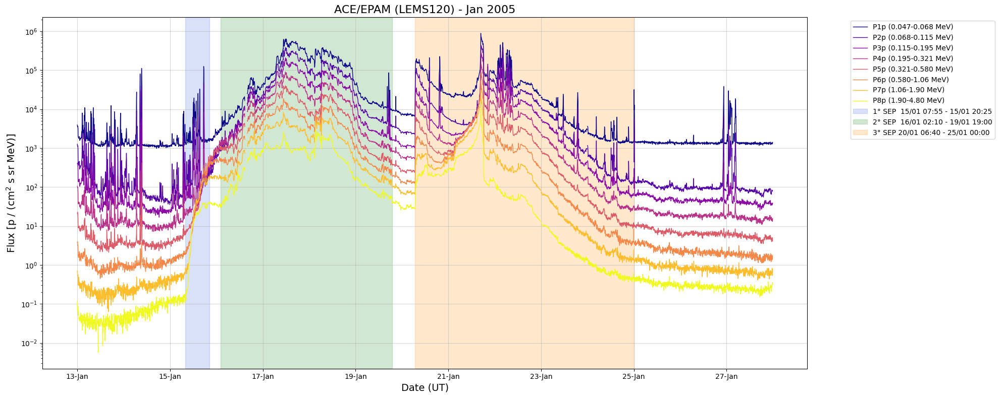

In [7]:




import pandas as pd
import matplotlib.pyplot as plt
import matplotlib.dates as mdates
import numpy as np

# ==========================================
# 1. FUNZIONE CARICAMENTO DATI ACE (Corretta)
# ==========================================

def load_ace_epam_fixed(file_path):
    # 1. Scansione preliminare per trovare header e inizio dati
    header_cols = []
    start_row = 0
    
    with open(file_path, 'r') as f:
        lines = f.readlines()
        
    for i, line in enumerate(lines):
        # Troviamo la riga che contiene i nomi delle colonne
        if line.strip().startswith("year") and "P1p" in line:
            header_cols = line.strip().split() # Divide per spazi
        
        # Troviamo dove iniziano i dati
        if "BEGIN DATA" in line:
            start_row = i + 1 # I dati iniziano alla riga successiva
            break
    
    if not header_cols:
        print("Errore: Non ho trovato la riga dell'header (year day hr...)")
        return None

    print(f"Header trovato: {header_cols}")
    print(f"Dati iniziano alla riga: {start_row}")

    # 2. Caricamento con Pandas usando i nomi trovati
    try:
        df = pd.read_csv(
            file_path, 
            sep='\s+',           # Separatore spazi multipli (Fix Warning)
            names=header_cols,   # Assegniamo i nomi manualmente
            skiprows=start_row,  # Saltiamo tutto fino ai dati veri
            index_col=False      # Non usare la prima colonna come indice subito
        )
    except Exception as e:
        print(f"Errore lettura CSV: {e}")
        return None

    # 3. Creazione della colonna Data (Epoch)
    # ACE usa Anno e Giorno dell'Anno (DOY). Convertiamo in datetime.
    # Creiamo una stringa: "2005 1 12 30 00" (Anno Giorno Ora Min Sec)
    try:
        # Convertiamo tutto in stringa e concateniamo con spazi
        time_str = df['year'].astype(str) + ' ' + \
                   df['day'].astype(str) + ' ' + \
                   df['hr'].astype(str) + ' ' + \
                   df['min'].astype(str) + ' ' + \
                   df['sec'].astype(int).astype(str)
        
        # Parsiamo la data. %j è il codice per "Day of Year"
        df['epoch'] = pd.to_datetime(time_str, format='%Y %j %H %M %S')
        
        # Impostiamo come indice
        df.set_index('epoch', inplace=True)
        
        # Pulizia valori negativi (errori strumento)
        cols_to_clean = [c for c in df.columns if 'P' in c or 'E' in c]
        df[cols_to_clean] = df[cols_to_clean].applymap(lambda x: np.nan if x < 0 else x)
        
        return df
        
    except Exception as e:
        print(f"Errore conversione date: {e}")
        return None

# ==========================================
# 2. ESECUZIONE
# ==========================================

file_path_ace = "JAN 2005 File/ACE_EPAM_Data (2).txt"  # Assicurati che il nome file sia giusto
df_ace = load_ace_epam_fixed(file_path_ace)

if df_ace is not None:
    print("Dati ACE caricati!")
    
    # --- PLOT LEMS120 (Canali P') ---
    ace_labels = {
        'P1p': '0.047-0.068 MeV',
        'P2p': '0.068-0.115 MeV',
        'P3p': '0.115-0.195 MeV',
        'P4p': '0.195-0.321 MeV',
        'P5p': '0.321-0.580 MeV',
        'P6p': '0.580-1.06 MeV',
        'P7p': '1.06-1.90 MeV',
        'P8p': '1.90-4.80 MeV'
    }
    
    t_start = '2005-01-13 00:00'
    t_end   = '2005-01-28 00:00'
    
    df_plot = df_ace.loc[t_start:t_end]


    
    plt.figure(figsize=(20, 8))
    colors = plt.cm.plasma(np.linspace(0, 1, len(ace_labels)))
    
    for i, (col, label) in enumerate(ace_labels.items()):
        if col in df_plot.columns:
            plt.plot(df_plot.index, df_plot[col], label=f"{col} ({label})", 
                     color=colors[i], linewidth=1)
            
    #events shading from events_dict_for_visualization
# Shade events
    for event_name, event_info in events_dict_for_visualization.items():
        plt.axvspan(pd.to_datetime(event_info["start"]), 
                    pd.to_datetime(event_info["end"]), 
                    color=event_info["color"], alpha=0.2, label=event_name)

            
    plt.yscale('log')
    plt.title('ACE/EPAM (LEMS120) - Jan 2005', fontsize=16)
    plt.ylabel(r'Flux [p / (cm$^2$ s sr MeV)]', fontsize=14)
    plt.xlabel('Date (UT)', fontsize=14)
    plt.grid(True, which="major", alpha=0.5)
    plt.legend(loc='upper right', bbox_to_anchor=(1.25, 1))
    
    plt.gca().xaxis.set_major_formatter(mdates.DateFormatter('%d-%b'))
    plt.tight_layout()
    plt.show()

--- Livelli di Background ACE (p / cm2 s sr MeV) ---
P1p    3387.907783
P8p       0.058232
dtype: float64


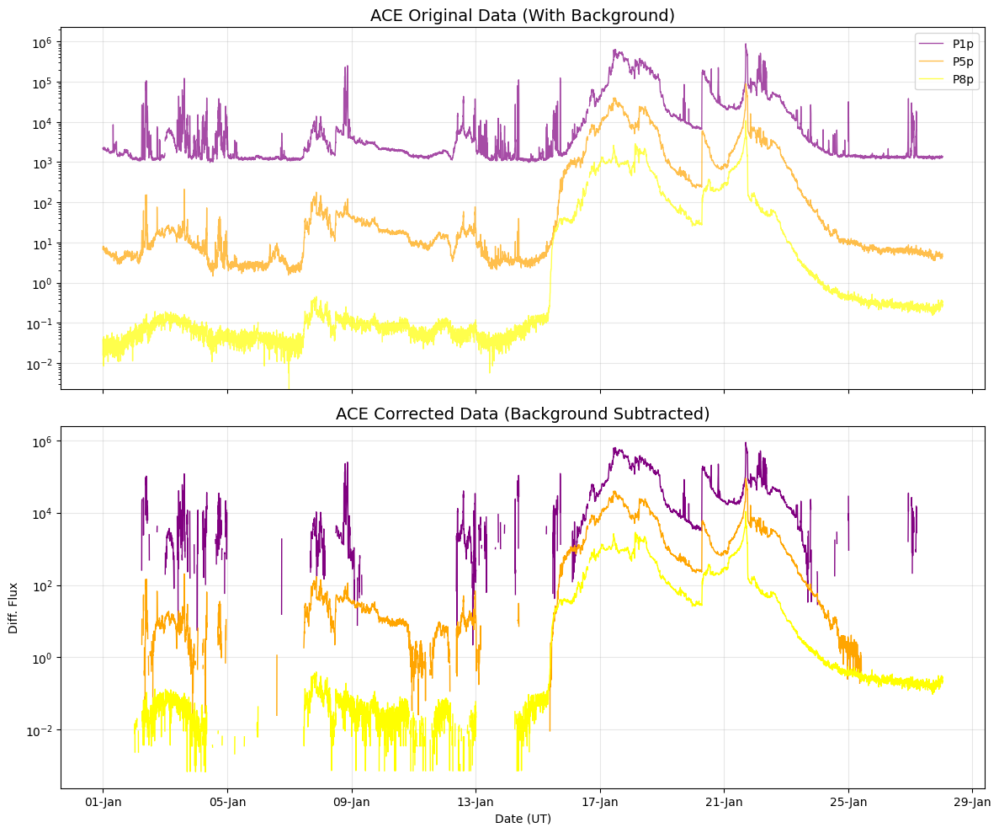

In [8]:
# Rimozione background ACE 

import numpy as np
import matplotlib.pyplot as plt

# ==========================================
# 1. DEFINIZIONE FINESTRA BACKGROUND (24h)
# ==========================================
# Usiamo un periodo tranquillo prima dell'inizio della tempesta del 15/01.
# Il 12-13 Gennaio è ideale (come fatto per GOES).
bg_start = '2005-01-12 00:00:00'
bg_end   = '2005-01-15 00:00:00'

# ==========================================
# 2. CALCOLO E SOTTRAZIONE
# ==========================================

# 1. Calcola la media del flusso in quelle 24h
ace_bg_mean = df_ace.loc[bg_start:bg_end].mean()

print("--- Livelli di Background ACE (p / cm2 s sr MeV) ---")
print(ace_bg_mean[['P1p', 'P8p']]) # Stampa solo primo e ultimo per brevità

# 2. Sottrazione
# Creiamo un nuovo dataframe per i dati corretti
df_ace_corr = df_ace - ace_bg_mean

# 3. Pulizia (NaN sui valori <= 0)
# Questo rimuove il "rumore" e le righe verticali nel plot logaritmico
df_ace_corr[df_ace_corr <= 0] = np.nan

# ==========================================
# 3. PLOT DI VERIFICA (PRIMA VS DOPO)
# ==========================================

fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(12, 10), sharex=True)

# Canali da plottare (Low energy e High energy)
ch_demo = ['P1p', 'P5p', 'P8p'] 
colors = ['purple', 'orange', 'yellow']

# Plot RAW
for i, col in enumerate(ch_demo):
    if col in df_ace.columns:
        ax1.plot(df_ace.index, df_ace[col], label=col, color=colors[i], lw=1, alpha=0.7)
ax1.set_title("ACE Original Data (With Background)", fontsize=14)
ax1.set_yscale('log')
ax1.legend(loc='upper right')
ax1.grid(True, alpha=0.3)

# Plot CORRECTED
for i, col in enumerate(ch_demo):
    if col in df_ace_corr.columns:
        ax2.plot(df_ace_corr.index, df_ace_corr[col], label=f"{col} (Net)", color=colors[i], lw=1)
ax2.set_title("ACE Corrected Data (Background Subtracted)", fontsize=14)
ax2.set_yscale('log')
ax2.set_ylabel('Diff. Flux')
ax2.set_xlabel('Date (UT)')
ax2.grid(True, alpha=0.3)

# Formattazione date
import matplotlib.dates as mdates
ax2.xaxis.set_major_formatter(mdates.DateFormatter('%d-%b'))

plt.tight_layout()
plt.show()

In [9]:
# ==========================================
# 4. SETUP CANALI ACE (LEMS120)
# ==========================================

# Bordi dei canali ACE LEMS120 (da Header file)
ace_bins = {
    'P1p': (0.047, 0.068),
    'P2p': (0.068, 0.115),
    'P3p': (0.115, 0.195),
    'P4p': (0.195, 0.321),
    'P5p': (0.321, 0.580),
    'P6p': (0.580, 1.060),
    'P7p': (1.060, 1.900),
    'P8p': (1.900, 4.800)
}

# Calcolo Energie Efficaci (Media Geometrica per ACE)
# E_eff = sqrt(E_min * E_max)
ace_eff_map = {ch: np.sqrt(b[0]*b[1]) for ch, b in ace_bins.items()}

# ==========================================
# 5. INTEGRAZIONE ACE E UNIONE CON GOES
# ==========================================

print("--- Aggiunta Dati ACE al Dataset GOES ---")

# Iteriamo sugli stessi eventi definiti per GOES
for name, params in events_dict.items():
    
    # 1. Slice Temporale su ACE
    df_slice = df_ace_corr.loc[params['start']:params['end']]
    
    # 2. Calcolo dt (ACE è a 5 min = 300s)
    dt_seconds = df_slice.index.to_series().diff().dt.total_seconds().fillna(300)
    
    fluences_ace = []
    energies_ace = []
    x_err_low_ace = []
    x_err_high_ace = []
    
    # 3. Integrazione per ogni canale ACE
    for col, (E_min, E_max) in ace_bins.items():
        if col in df_slice.columns:
            # Pulizia: NaN -> 0
            flux_clean = df_slice[col].fillna(0).clip(lower=0)

            
            
            # Integrale
            fluence_val = (flux_clean * dt_seconds).sum()
            
            
            if fluence_val > 0:
                fluences_ace.append(fluence_val)
                energies_ace.append(ace_eff_map[col])
                x_err_low_ace.append(ace_eff_map[col] - E_min)
                x_err_high_ace.append(E_max - ace_eff_map[col])
                
                
    print(f"{name}: Trovati {len(fluences_ace)} punti ACE.")

    # 4. UNIONE (MERGE) CON I DATI GOES ESISTENTI
    # Recuperiamo i dati GOES già calcolati
    goes_data = results[name]
    
    # Concateniamo gli array (ACE prima, poi GOES per ordine di energia)
    # ACE è < 4 MeV, GOES è > 4 MeV
    new_x = np.concatenate([np.array(energies_ace), goes_data['x']])
    new_y = np.concatenate([np.array(fluences_ace), goes_data['y']])
    
    # Unione errori orizzontali
    new_xerr_low = np.concatenate([np.array(x_err_low_ace), goes_data['x_err'][0]])
    new_xerr_high = np.concatenate([np.array(x_err_high_ace), goes_data['x_err'][1]])
    
    # Aggiorniamo il dizionario results
    results[name]['x'] = new_x
    results[name]['y'] = new_y
    results[name]['x_err'] = [new_xerr_low, new_xerr_high]

print("--- Unione Completata. Pronto per il Fit Finale! ---")

--- Aggiunta Dati ACE al Dataset GOES ---
1° SEP  15/01 07:55 - 15/01 20:25: Trovati 8 punti ACE.
2° SEP  16/01 02:10 - 19/01 19:00: Trovati 8 punti ACE.
3° SEP 20/01 06:40 - 25/01 00:00: Trovati 8 punti ACE.
--- Unione Completata. Pronto per il Fit Finale! ---


--- ESECUZIONE FIT SU SPETTRO COMPLETO (0.04 - 700 MeV) ---


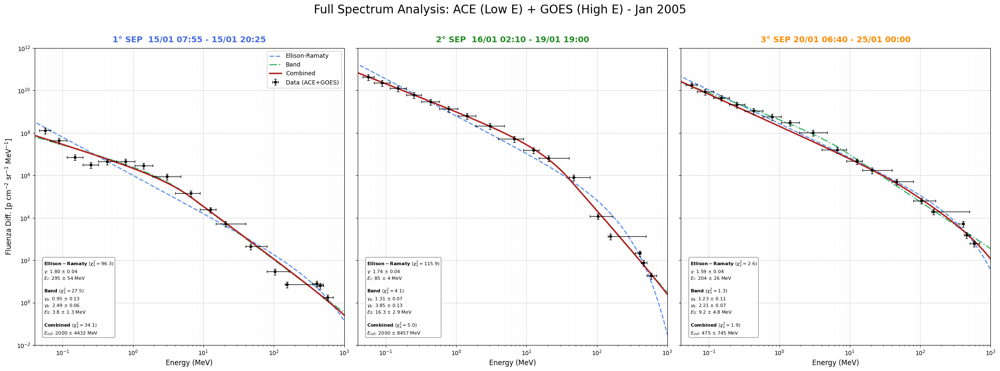

In [15]:
# Plot finale 


import matplotlib.pyplot as plt
import numpy as np
from scipy.optimize import curve_fit

# ==========================================
# 6. SUPER-PLOT: ACE + GOES (EPS/HEPAD)
# ==========================================

# Estendiamo l'asse X del modello per coprire ACE (da 0.03 MeV a 1000 MeV)
x_plot = np.logspace(np.log10(0.03), np.log10(1000), 1000)

fig, axes = plt.subplots(1, 3, figsize=(24, 9), sharey=True)
axes = axes.flatten()

print("--- ESECUZIONE FIT SU SPETTRO COMPLETO (0.04 - 700 MeV) ---")

for i, (evt_name, data) in enumerate(results.items()):
    ax = axes[i]
    
    # Dati uniti (ACE + GOES)
    x = data['x']
    y = data['y']
    #x_errs = data['x_err'] # Lista [low, high] già unita
    x_errs = [np.abs(data['x_err'][0]), np.abs(data['x_err'][1])]
    color_evt = data['color']
    
    # 1. Errore Verticale (20% Sistematico)
    # Per ACE l'errore potrebbe essere diverso, ma il 20% è una stima conservativa standard
    y_err = y * 0.30
    
    # 2. PLOT DATI (Croci)
    # Noterai i punti ACE a sinistra e GOES a destra
    ax.errorbar(x, y, yerr=y_err, xerr=x_errs, 
                fmt='o', color='black', ecolor='black', 
                capsize=2, elinewidth=1, markersize=4, 
                label='Data (ACE+GOES)', zorder=10)
    
    stats_box = ""

    # --- A. FIT ELLISON-RAMATY ---
    # Bounds: Gamma può essere ripido a bassa energia, diamo libertà
    p0 = [1e8, 1.5, 100.0]
    popt, pcov = fit_log_space(ellison_ramaty, x, y, y_err, p0, bounds=([0, 0, 0], [np.inf, 10, 10000]))
    
    if popt is not None:
        ax.plot(x_plot, ellison_ramaty(x_plot, *popt), '--', color='cornflowerblue', linewidth=2, label='Ellison-Ramaty')
        stats_box += get_stats_text("Ellison-Ramaty", ellison_ramaty, x, y, y_err, popt, pcov) + "\n\n"

    # --- B. FIT BAND FUNCTION ---
    # Band è perfetta qui perché ACE fissa la pendenza bassa (gamma_a) 
    # e GOES fissa quella alta (gamma_b)
    p0_b = [1e7, 1.0, 3.0, 10.0]
    popt_b, pcov_b = fit_log_space(band_function, x, y, y_err, p0_b, bounds=([0, 0.1, 0.1, 0.5], [np.inf, 10, 10, 500]))
    
    if popt_b is not None:
        ax.plot(x_plot, band_function(x_plot, *popt_b), '-.', color='mediumseagreen', linewidth=2, label='Band')
        stats_box += get_stats_text("Band", band_function, x, y, y_err, popt_b, pcov_b) + "\n\n"

    # --- C. FIT COMBINED ---
    if popt_b is not None:
        # Combined: utile per super-MeV cutoff netto
        p0_c = [1e9, 1.0, 4.0, 20.0, 600.0]
        bounds_c = ([0, 0.1, 1.5, 5, 50], [np.inf, 6, 12, 200, 2000])
        popt_c, pcov_c = fit_log_space(combined_function, x, y, y_err, p0_c, bounds=bounds_c)
        
        if popt_c is not None:
            ax.plot(x_plot, combined_function(x_plot, *popt_c), '-', color='firebrick', linewidth=2.5, label='Combined')
            stats_box += get_stats_text("Combined", combined_function, x, y, y_err, popt_c, pcov_c)

    # --- STYLING ---
    ax.set_title(evt_name, fontsize=14, color=color_evt, fontweight='bold', pad=10)
    ax.set_xscale('log'); ax.set_yscale('log')
    
    # LIMITI AGGIORNATI PER VEDERE ACE
    ax.set_xlim(0.04, 1000) # Da 40 keV a 1 GeV
    ax.set_ylim(1e-2, 1e12) # Esteso in alto per i flussi ACE
    
    # Griglia Fine
    ax.grid(True, which="major", alpha=0.5)
    ax.grid(True, which="minor", alpha=0.2, linestyle=':')
    
    ax.set_xlabel("Energy (MeV)", fontsize=12)
    if i == 0:
        ax.set_ylabel(r"Fluenza Diff. [p cm$^{-2}$ sr$^{-1}$ MeV$^{-1}$]", fontsize=12)
        ax.legend(loc='upper right', fontsize=10, framealpha=0.95)
    
    # Box Statistiche
    ax.text(0.03, 0.03, stats_box, transform=ax.transAxes, fontsize=8,
            verticalalignment='bottom', bbox=dict(boxstyle="round", facecolor='white', alpha=0.9, edgecolor='gray'))

plt.suptitle("Full Spectrum Analysis: ACE (Low E) + GOES (High E) - Jan 2005", fontsize=20, y=0.98)
plt.tight_layout(rect=[0, 0.0, 1, 0.96])
plt.show()







### LATEST TENTATIVO COMPLESSIVO 

--- Calcolo fluenze (ACE + GOES) ---
1° SEP  15/01 07:55 - 15/01 20:25: 17 punti (ACE+GOES)
2° SEP  16/01 02:10 - 19/01 19:00: 17 punti (ACE+GOES)
3° SEP 20/01 06:40 - 25/01 00:00: 17 punti (ACE+GOES)


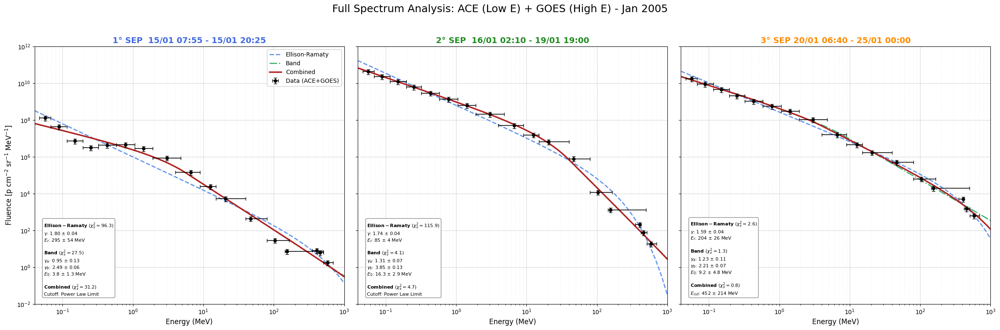

In [1]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import matplotlib.dates as mdates
from scipy.optimize import curve_fit

# ============================================================
# 0. PARAMETRI GENERALI
# ============================================================

# File SEPEM GOES
file_goes_eps   = "SEPEM_RDS_v3/SEPEM_RDS_v3-0/RDS3.0_H_EPS_GOES11.txt"
file_goes_hepad = "SEPEM_RDS_v3/SEPEM_RDS_v3-0/RDS3.0_H_HEPAD_GOES11.txt"

# File ACE EPAM (ASCII)
file_ace_epam = "JAN 2005 File/ACE_EPAM_Data (2).txt"

# Intervallo temporale globale
t_start = "2005-01-12 00:00:00"
t_end   = "2005-01-27 00:00:00"

# Intervallo background (tranquillo, comune ACE+GOES)
bg_start = "2005-01-12 00:00:00"
bg_end   = "2005-01-14 00:00:00"

# Eventi definitivi (come da tua scelta)
events = {
    "1° SEP  15/01 07:55 - 15/01 20:25": {
        "start": "2005-01-15 07:55", "end": "2005-01-15 20:25", "color": "royalblue"
    },
    "2° SEP  16/01 02:10 - 19/01 19:00": {
        "start": "2005-01-16 02:10", "end": "2005-01-19 19:00", "color": "forestgreen"
    },
    "3° SEP 20/01 06:40 - 25/01 00:00": {
        "start": "2005-01-20 06:40", "end": "2005-01-25 00:00", "color": "darkorange"
    }
}

# ============================================================
# 1. CARICAMENTO GOES-11 EPS (P2–P7) + HEPAD (P8–P10)
# ============================================================

# EPS
df_eps = pd.read_csv(
    file_goes_eps,
    sep=",",
    skipinitialspace=True,
    index_col="epoch",
    parse_dates=["epoch"]
)
df_eps.columns = df_eps.columns.str.strip()

# HEPAD
df_hepad = pd.read_csv(
    file_goes_hepad,
    sep=",",
    skipinitialspace=True,
    index_col="epoch",
    parse_dates=["epoch"]
)
df_hepad.columns = df_hepad.columns.str.strip()

# Slice sull'intervallo di interesse
df_eps_event   = df_eps.loc[t_start:t_end]
df_hepad_event = df_hepad.loc[t_start:t_end]

# Background (media) su intervallo quieto
bg_eps   = df_eps.loc[bg_start:bg_end].mean()
bg_hepad = df_hepad.loc[bg_start:bg_end].mean()

# Sottrazione background
df_eps_corr   = df_eps_event   - bg_eps
df_hepad_corr = df_hepad_event - bg_hepad

# Valori negativi → NaN
df_eps_corr[df_eps_corr < 0]     = np.nan
df_hepad_corr[df_hepad_corr < 0] = np.nan

# Dataframe totale GOES (EPS + HEPAD)
df_goes = pd.concat([df_eps_corr, df_hepad_corr], axis=1).sort_index()

# ============================================================
# 2. CARICAMENTO ACE EPAM (LEMS120) DAL FILE ASCII
# ============================================================

def load_ace_epam_lems120(path):
    """
    Carica il file ACE/EPAM LEMS120 con header 'year day hr min sec ... P1p ... P8p'
    e restituisce un DataFrame indicizzato da 'epoch'.
    """
    header_cols = []
    start_row = 0

    with open(path, "r") as f:
        lines = f.readlines()

    for i, line in enumerate(lines):
        # riga con i nomi delle colonne
        if line.strip().startswith("year") and "P1p" in line:
            header_cols = line.strip().split()
        if "BEGIN DATA" in line:
            start_row = i + 1
            break

    if not header_cols:
        raise RuntimeError("Header ACE non trovato (riga con 'year day hr min sec ... P1p').")

    # Lettura effettiva
    df = pd.read_csv(
        path,
        sep=r"\s+",
        names=header_cols,
        skiprows=start_row,
        index_col=False
    )

    # Costruzione colonna epoch da year, day-of-year, hr, min, sec
    time_str = (
        df["year"].astype(int).astype(str) + " " +
        df["day"].astype(int).astype(str)  + " " +
        df["hr"].astype(int).astype(str)   + " " +
        df["min"].astype(int).astype(str)  + " " +
        df["sec"].astype(int).astype(str)
    )
    df["epoch"] = pd.to_datetime(time_str, format="%Y %j %H %M %S")
    df.set_index("epoch", inplace=True)

    # Pulizia valori negativi → NaN
    cols_flux = [c for c in df.columns if c.endswith("p")]
    df[cols_flux] = df[cols_flux].where(df[cols_flux] >= 0, np.nan)

    return df

df_ace_raw = load_ace_epam_lems120(file_ace_epam)

# Slice temporale e background
df_ace_event = df_ace_raw.loc[t_start:t_end]
bg_ace = df_ace_raw.loc[bg_start:bg_end].mean()

# Sottrazione background
df_ace_corr = df_ace_event - bg_ace
df_ace_corr[df_ace_corr <= 0] = np.nan

# ============================================================
# 3. DEFINIZIONE CANALI & ENERGIE
# ============================================================

# GOES SEPEM: bordi canali (MeV) e energie efficaci (SEPCALIB)
goes_bins = {
    "P2":  (4.0, 9.0),
    "P3":  (9.0, 15.0),
    "P4":  (15.0, 40.0),
    "P5":  (40.0, 80.0),
    "P6":  (80.0, 165.0),
    "P7":  (165.0, 500.0),
    "P8":  (350.0, 420.0),
    "P9":  (420.0, 510.0),
    "P10": (510.0, 700.0),
}

goes_eff = {
    "P2":  6.643,
    "P3":  12.61,
    "P4":  20.55,
    "P5":  46.62,
    "P6":  103.7,
    "P7":  154.6,
    "P8":  406.0,
    "P9":  457.0,
    "P10": 583.0,
}

# ACE LEMS120: bordi canali (MeV) e energie efficaci (geom. mean)
ace_bins = {
    "P1p": (0.047, 0.068),
    "P2p": (0.068, 0.115),
    "P3p": (0.115, 0.195),
    "P4p": (0.195, 0.321),
    "P5p": (0.321, 0.580),
    "P6p": (0.580, 1.060),
    "P7p": (1.060, 1.900),
    "P8p": (1.900, 4.800),
}
ace_eff = {ch: np.sqrt(lo * hi) for ch, (lo, hi) in ace_bins.items()}

# ============================================================
# 4. FUNZIONI SPETTRALI E FIT IN LOG-SPACE
# ============================================================

def ellison_ramaty(E, A, gamma, Er):
    return A * E**(-gamma) * np.exp(-E / Er)

def band_function(E, A, ga, gb, E0):
    # break energy
    if gb <= ga:
        return np.zeros_like(E) + 1e-40
    E_break = (gb - ga) * E0
    if E_break <= 0:
        return np.zeros_like(E) + 1e-40

    res = np.zeros_like(E)
    mask = E < E_break

    res[mask] = A * (E[mask] ** -ga) * np.exp(-E[mask] / E0)
    norm = (E_break ** (gb - ga)) * np.exp(ga - gb)
    res[~mask] = A * (E[~mask] ** -gb) * norm

    return res

def combined_function(E, A, ga, gb, E0, Er):
    return band_function(E, A, ga, gb, E0) * np.exp(-E / Er)

def fit_log_space(func, x, y, y_err, p0, bounds):
    # fittiamo log10(fluenza) per pesare bene l'intervallo dinamico
    def log_func(E, *params):
        val = func(E, *params)
        val = np.where(val > 0, val, 1e-40)
        return np.log10(val)

    y_pos = np.where(y > 0, y, 1e-40)
    sigma_log = (y_err / y_pos) / np.log(10)
    sigma_log = np.where(np.isfinite(sigma_log) & (sigma_log > 0), sigma_log, 1.0)

    try:
        popt, pcov = curve_fit(
            log_func,
            x,
            np.log10(y_pos),
            p0=p0,
            bounds=bounds,
            sigma=sigma_log,
            absolute_sigma=True,
            maxfev=20000,
        )
        return popt, pcov
    except Exception:
        return None, None

def get_stats_text(model_name, func, x, y, y_err, popt, pcov):
    if popt is None:
        return f"{model_name}: fit failed"

    y_model = func(x, *popt)
    y_model = np.where(y_model > 0, y_model, 1e-40)
    res = (y - y_model) / y_err
    res = np.where(np.isfinite(res), res, 0.0)
    chi2 = np.sum(res**2)
    dof = max(len(y) - len(popt), 1)
    chi2_red = chi2 / dof

    if pcov is None or np.ndim(pcov) != 2:
        perr = [0.0] * len(popt)
    else:
        perr = np.sqrt(np.diag(pcov))

    txt = rf"$\bf{{{model_name}}}$ ($\chi^2_\nu={chi2_red:.1f}$)" + "\n"

    if model_name == "Ellison-Ramaty":
        txt += rf"$\gamma$: {popt[1]:.2f} $\pm$ {perr[1]:.2f}" + "\n"
        txt += rf"$E_r$: {popt[2]:.0f} $\pm$ {perr[2]:.0f} MeV"
    elif model_name == "Band":
        txt += rf"$\gamma_a$: {popt[1]:.2f} $\pm$ {perr[1]:.2f}" + "\n"
        txt += rf"$\gamma_b$: {popt[2]:.2f} $\pm$ {perr[2]:.2f}" + "\n"
        txt += rf"$E_0$: {popt[3]:.1f} $\pm$ {perr[3]:.1f} MeV"
    elif model_name == "Combined":
        if popt[4] > 4000:
            txt += "Cutoff: Power Law Limit"
        else:
            txt += rf"$E_{{cut}}$: {popt[4]:.0f} $\pm$ {perr[4]:.0f} MeV"

    return txt

# ============================================================
# 5. CALCOLO FLUENZE: ACE + GOES, EVENTO PER EVENTO
# ============================================================

results = {}

print("--- Calcolo fluenze (ACE + GOES) ---")

for name, pars in events.items():
    t0 = pars["start"]
    t1 = pars["end"]

    # Slice temporale
    df_g = df_goes.loc[t0:t1]
    df_a = df_ace_corr.loc[t0:t1]

    # dt (5 min nominali) calcolato dai time-step reali
    dt_g = df_g.index.to_series().diff().dt.total_seconds().fillna(300.0)
    dt_a = df_a.index.to_series().diff().dt.total_seconds().fillna(300.0)

    fluences = []
    energies = []
    xerr_low = []
    xerr_high = []

    # ---- ACE (low energy) ----
    for ch, (Emin, Emax) in ace_bins.items():
        if ch not in df_a.columns:
            continue
        flux = df_a[ch].fillna(0).clip(lower=0)
        flu = (flux * dt_a).sum()
        if flu <= 0:
            continue
        Eeff = ace_eff[ch]
        fluences.append(flu)
        energies.append(Eeff)
        xerr_low.append(Eeff - Emin)
        xerr_high.append(Emax - Eeff)

    # ---- GOES (mid + high energy) ----
    for ch, (Emin, Emax) in goes_bins.items():
        if ch not in df_g.columns:
            continue
        flux = df_g[ch].fillna(0).clip(lower=0)
        flu = (flux * dt_g).sum()
        if flu <= 0:
            continue
        Eeff = goes_eff[ch]
        fluences.append(flu)
        energies.append(Eeff)
        xerr_low.append(Eeff - Emin)
        xerr_high.append(Emax - Eeff)

    # Convertiamo in array e ordiniamo per energia (ACE→GOES continui)  ===> OPZIONE B
    energies = np.array(energies)
    fluences = np.array(fluences)
    xerr_low = np.array(xerr_low)
    xerr_high = np.array(xerr_high)

    sort_idx = np.argsort(energies)
    energies = energies[sort_idx]
    fluences = fluences[sort_idx]
    xerr_low = xerr_low[sort_idx]
    xerr_high = xerr_high[sort_idx]

    results[name] = {
        "x": energies,
        "y": fluences,
        "x_err": [xerr_low, xerr_high],
        "color": pars["color"],
    }

    print(f"{name}: {len(energies)} punti (ACE+GOES)")

# ============================================================
# 6. FIT E PLOT FINALE (3 PANNELLI, COME NELLA TUA FIGURA)
# ============================================================

combined_fit_params = {}
band_fit_params = {}


x_plot = np.logspace(np.log10(0.04), np.log10(1000.0), 800)

fig, axes = plt.subplots(1, 3, figsize=(24, 8), sharey=True)
axes = axes.flatten()

for i, (name, data) in enumerate(results.items()):
    ax = axes[i]
    x = data["x"]
    y = data["y"]
    dx_low, dx_high = data["x_err"]
    color_evt = data["color"]

    # errore verticale ~30% sistematico
    y_err = y * 0.30

    # xerr positivo
    xerr = [np.abs(dx_low), np.abs(dx_high)]

    # Dati (ACE+GOES)
    ax.errorbar(
        x,
        y,
        yerr=y_err,
        xerr=xerr,
        fmt="o",
        color="black",
        ecolor="black",
        capsize=3,
        elinewidth=1.2,
        markersize=5,
        label="Data (ACE+GOES)",
        zorder=10,
    )

    stats_box = ""

    # ---------- Ellison-Ramaty ----------
    p0_er = [1e8, 2.0, 150.0]
    bounds_er = ([0, 0.1, 10.0], [np.inf, 10.0, 5000.0])
    popt_er, pcov_er = fit_log_space(ellison_ramaty, x, y, y_err, p0_er, bounds_er)
    if popt_er is not None:
        ax.plot(
            x_plot,
            ellison_ramaty(x_plot, *popt_er),
            "--",
            color="cornflowerblue",
            linewidth=2,
            label="Ellison-Ramaty",
        )
        stats_box += get_stats_text(
            "Ellison-Ramaty", ellison_ramaty, x, y, y_err, popt_er, pcov_er
        ) + "\n\n"

    # ---------- Band ----------
    p0_b = [1e7, 1.0, 3.0, 15.0]
    bounds_b = ([0, 0.1, 0.5, 1.0], [np.inf, 6.0, 10.0, 500.0])
    popt_b, pcov_b = fit_log_space(band_function, x, y, y_err, p0_b, bounds_b)
    if popt_b is not None:
        ax.plot(
            x_plot,
            band_function(x_plot, *popt_b),
            "-.",
            color="mediumseagreen",
            linewidth=2,
            label="Band",
        )
            # >>> SALVATAGGIO PARAMETRI BAND <<<
        band_fit_params[name] = popt_b

        stats_box += get_stats_text(
            "Band", band_function, x, y, y_err, popt_b, pcov_b
        ) + "\n\n"

    # ---------- Combined ----------
    popt_c, pcov_c = (None, None)
    if popt_b is not None:
        p0_c = [popt_b[0], popt_b[1], popt_b[2], popt_b[3], 500.0]
        bounds_c = ([0, 0.1, 0.5, 1.0, 50.0], [np.inf, 6.0, 10.0, 500.0, 5000.0])
        popt_c, pcov_c = fit_log_space(combined_function, x, y, y_err, p0_c, bounds_c)

        if popt_c is not None:
            ax.plot(
                x_plot,
                combined_function(x_plot, *popt_c),
                "-",
                color="firebrick",
                linewidth=2.5,
                label="Combined",
            )

                # >>> SALVATAGGIO PARAMETRI COMBINED <<<
            combined_fit_params[name] = popt_c

            stats_box += get_stats_text(
                "Combined", combined_function, x, y, y_err, popt_c, pcov_c
            )

    # ---------- STYLING ----------
    ax.set_title(name, fontsize=14, color=color_evt, fontweight="bold")
    ax.set_xscale("log")
    ax.set_yscale("log")
    ax.set_xlim(0.04, 1000)
    ax.set_ylim(1e-2, 1e12)

    ax.grid(True, which="major", alpha=0.5)
    ax.grid(True, which="minor", alpha=0.2, linestyle=":")

    ax.set_xlabel("Energy (MeV)", fontsize=12)
    if i == 0:
        ax.set_ylabel(r"Fluence [p cm$^{-2}$ sr$^{-1}$ MeV$^{-1}$]", fontsize=12)
        ax.legend(loc="upper right", fontsize=10, framealpha=0.95)

    ax.text(
        0.03,
        0.03,
        stats_box,
        transform=ax.transAxes,
        fontsize=8,
        verticalalignment="bottom",
        bbox=dict(boxstyle="round", facecolor="white", alpha=0.92, edgecolor="gray"),
    )

plt.suptitle(
    "Full Spectrum Analysis: ACE (Low E) + GOES (High E) - Jan 2005", 
    fontsize=18,
    y=0.98,
)
plt.tight_layout(rect=[0, 0.0, 1, 0.95])
plt.show()


# CELLA DI EXPORT SRNIEL - SPHERICAL SHIELDING 

- Integro su tutto intervallo 15-25 gennaio 
- Somma bin per bin 
- Modello Combined 
- incertezze sistematica 30%
- Fluenza totale nessuna moltipicazione per angolo solido SRNIEL lo interpreta internamente 


--- FIT TOTALE SEP Jan 2005 (somma bin-per-bin) ---
Punti (canali unici) ACE+GOES nel totale: 17

Parametri fit Combined (TOT):
A       = 1.424e+09
ga      = 1.31 ± 0.08
gb      = 2.69 ± 0.29
E0      = 16.71 ± 6.34 MeV
Ecut    = 5000.0 ± 39545.9 MeV
chi2red = 1.05  (ndof=12)


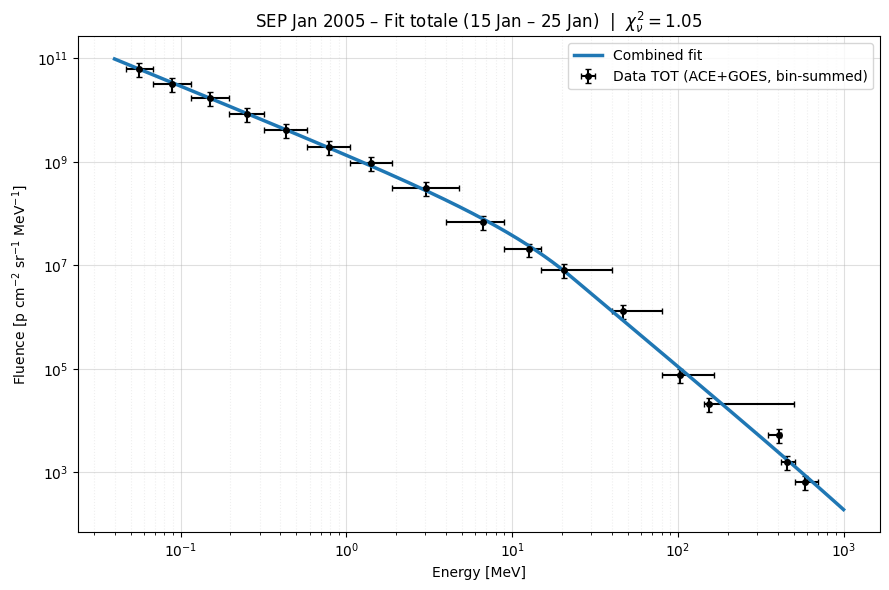

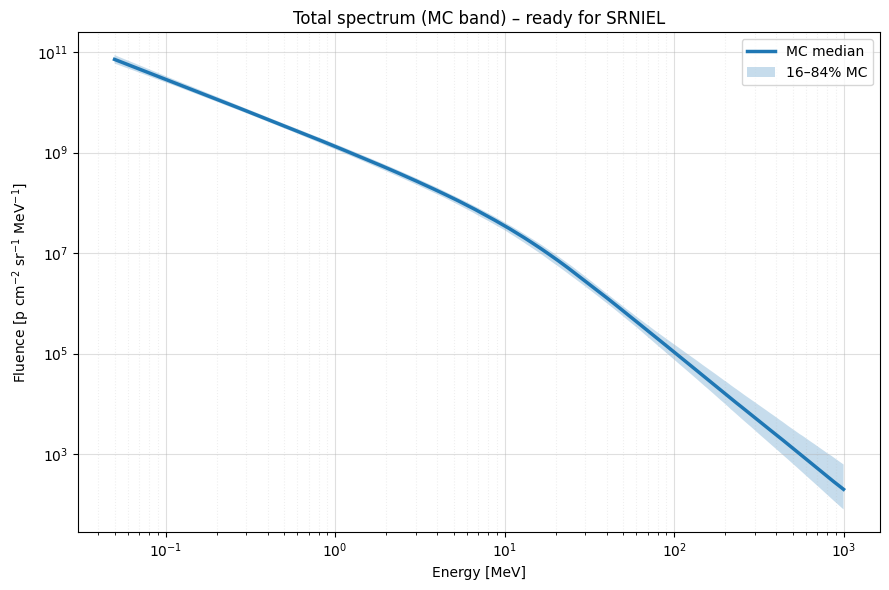


--- EXPORT COMPLETATO ---
SRNIEL input (median): SRNIEL_input_Jan2005_TOTAL_SPHERICAL_noPi_MCmedian1.txt
SRNIEL input (16/84):  SRNIEL_input_Jan2005_TOTAL_SPHERICAL_noPi_MC16_84.txt

Preview (copy&paste in SRNIEL textbox):
5.000000e-02 7.155727e+10
5.168383e-02 6.850734e+10
5.342437e-02 6.559342e+10
5.522353e-02 6.275446e+10
5.708327e-02 6.002538e+10
5.900565e-02 5.744045e+10
6.099276e-02 5.506107e+10
6.304680e-02 5.268032e+10
6.517000e-02 5.045247e+10
6.736471e-02 4.832077e+10
6.963333e-02 4.622234e+10
7.197835e-02 4.426328e+10
...


In [2]:
# ============================================================
# FIT TOTALE SEP (Jan 2005) + MONTE CARLO + EXPORT SRNIEL
# INPUT:  results_combined  (3 finestre non sovrapposte)
#         combined_function, fit_log_space  (già definite sopra)
# OUTPUT: SRNIEL_input_Jan2005_TOTAL_SPHERICAL_noPi_MCmedian.txt
#         (+ file con bande 16/84% opzionale)
# ============================================================

import numpy as np
import matplotlib.pyplot as plt

print("\n--- FIT TOTALE SEP Jan 2005 (somma bin-per-bin) ---")

# ------------------------------
# 1) SOMMA FLUENCE PER CANALE
#    (stesse energie -> sommo, perché finestre temporali non-overlap)
# ------------------------------
# chiave robusta per matchare energie uguali (float): arrotondo
ROUND_E = 6

acc = {}  # key -> dict(E, y_sum, xl, xh)
for evt_name, evt in results.items():
    x = np.asarray(evt["x"])
    y = np.asarray(evt["y"])
    xl = np.asarray(evt["x_err"][0])
    xh = np.asarray(evt["x_err"][1])

    for Ei, yi, xli, xhi in zip(x, y, xl, xh):
        key = np.round(Ei, ROUND_E)
        if key not in acc:
            acc[key] = {"E": Ei, "y": yi, "xl": abs(xli), "xh": abs(xhi)}
        else:
            acc[key]["y"] += yi
            # (xl/xh lasciati invariati: è lo stesso canale energetico)

# array finali ordinati
E_tot  = np.zeros(len(acc))
Y_tot  = np.zeros(len(acc))
XL_tot = np.zeros(len(acc))
XH_tot = np.zeros(len(acc))

for i, key in enumerate(sorted(acc.keys())):
    E_tot[i]  = acc[key]["E"]
    Y_tot[i]  = acc[key]["y"]
    XL_tot[i] = acc[key]["xl"]
    XH_tot[i] = acc[key]["xh"]

print(f"Punti (canali unici) ACE+GOES nel totale: {len(E_tot)}")

# errore verticale: come tuo "codice buono" -> 30% sistematico
Yerr_tot = 0.30 * Y_tot

# ------------------------------
# 2) FIT COMBINED (Band × cutoff)
# ------------------------------
p0 = [1e9, 1.2, 3.5, 20.0, 500.0]
bounds = (
    [0,     0.1, 0.5,  1.0,   50.0],
    [np.inf, 6.0, 10.0, 500.0, 5000.0]
)

popt, pcov = fit_log_space(combined_function, E_tot, Y_tot, Yerr_tot, p0, bounds)
if popt is None:
    raise RuntimeError("FIT FALLITO (Combined) sul totale.")

perr = np.sqrt(np.diag(pcov))

# chi^2 ridotto (in spazio lineare, con Yerr_tot)
res = (Y_tot - combined_function(E_tot, *popt)) / Yerr_tot
chi2 = np.sum(res**2)
ndof = len(Y_tot) - len(popt)
chi2red = chi2/ndof if ndof > 0 else np.nan

print("\nParametri fit Combined (TOT):")
print(f"A       = {popt[0]:.3e}")
print(f"ga      = {popt[1]:.2f} ± {perr[1]:.2f}")
print(f"gb      = {popt[2]:.2f} ± {perr[2]:.2f}")
print(f"E0      = {popt[3]:.2f} ± {perr[3]:.2f} MeV")
print(f"Ecut    = {popt[4]:.1f} ± {perr[4]:.1f} MeV")
print(f"chi2red = {chi2red:.2f}  (ndof={ndof})")

# ------------------------------
# 3) PLOT CONTROLLO
# ------------------------------
E_plot = np.logspace(np.log10(0.04), np.log10(1000.0), 1200)
Phi_plot = combined_function(E_plot, *popt)

plt.figure(figsize=(9,6))
plt.errorbar(
    E_tot, Y_tot,
    yerr=Yerr_tot,
    xerr=[XL_tot, XH_tot],
    fmt="o", color="black", ecolor="black", capsize=2, ms=4,
    label="Data TOT (ACE+GOES, bin-summed)"
)
plt.plot(E_plot, Phi_plot, "-", lw=2.5, label="Combined fit")
plt.xscale("log"); plt.yscale("log")
plt.xlabel("Energy [MeV]")
plt.ylabel(r"Fluence [p cm$^{-2}$ sr$^{-1}$ MeV$^{-1}$]")
plt.title(f"SEP Jan 2005 – Fit totale (15 Jan – 25 Jan)  |  $\\chi^2_\\nu={chi2red:.2f}$")
plt.grid(True, which="major", alpha=0.4)
plt.grid(True, which="minor", alpha=0.2, linestyle=":")
plt.legend()
plt.tight_layout()
plt.show()

# ------------------------------
# 4) MONTE CARLO sui parametri (da pcov)
# ------------------------------
E_grid = np.logspace(np.log10(0.05), np.log10(1000.0), 300)

N_MC = 1000
rng = np.random.default_rng(42)

Phi_MC = np.empty((N_MC, E_grid.size), dtype=float)

for k in range(N_MC):
    p_mc = rng.multivariate_normal(popt, pcov)
    phi = combined_function(E_grid, *p_mc)
    Phi_MC[k] = np.where(phi > 0, phi, 1e-40)

Phi_med = np.median(Phi_MC, axis=0)
Phi_lo  = np.percentile(Phi_MC, 16, axis=0)
Phi_hi  = np.percentile(Phi_MC, 84, axis=0)

# plot banda MC
plt.figure(figsize=(9,6))
plt.plot(E_grid, Phi_med, lw=2.5, label="MC median")
plt.fill_between(E_grid, Phi_lo, Phi_hi, alpha=0.25, label="16–84% MC")
plt.xscale("log"); plt.yscale("log")
plt.xlabel("Energy [MeV]")
plt.ylabel(r"Fluence [p cm$^{-2}$ sr$^{-1}$ MeV$^{-1}$]")
plt.title("Total spectrum (MC band) – ready for SRNIEL")
plt.grid(True, which="major", alpha=0.4)
plt.grid(True, which="minor", alpha=0.2, linestyle=":")
plt.legend()
plt.tight_layout()
plt.show()

# ------------------------------
# 5) EXPORT SRNIEL — SFERICO (NO π)
# ------------------------------
# NOTA: qui NON moltiplico per π (come richiesto).
# Se un giorno ti serve includere un fattore di solid angle,
# metti ad esempio SOLID_ANGLE = np.pi (planare isotropa),
# oppure 4*np.pi (isotropo completo), ecc.
SOLID_ANGLE = 1.0

out_main = "SRNIEL_input_Jan2005_TOTAL_SPHERICAL_noPi_MCmedian1.txt"
np.savetxt(
    out_main,
    np.column_stack([E_grid, SOLID_ANGLE * Phi_med]),
    fmt="%.6e",
    header="Energy(MeV)   SpectralFluence(cm^-2 MeV^-1)",
    comments=""
)

# opzionale: salva anche le bande (utile per propagare incertezza a dose)
out_band = "SRNIEL_input_Jan2005_TOTAL_SPHERICAL_noPi_MC16_84.txt"
np.savetxt(
    out_band,
    np.column_stack([E_grid, SOLID_ANGLE * Phi_lo, SOLID_ANGLE * Phi_hi]),
    fmt="%.6e",
    header="Energy(MeV)   Phi_16(cm^-2 MeV^-1)   Phi_84(cm^-2 MeV^-1)",
    comments=""
)

print("\n--- EXPORT COMPLETATO ---")
print(f"SRNIEL input (median): {out_main}")
print(f"SRNIEL input (16/84):  {out_band}")

# preview copy&paste (prime 12 righe)
print("\nPreview (copy&paste in SRNIEL textbox):")
for i in range(12):
    print(f"{E_grid[i]:.6e} {SOLID_ANGLE * Phi_med[i]:.6e}")
print("...")


# CELLA DI EXPORT 

In [10]:
# ============================================================
# 7. SPETTRO TOTALE (15–25 GEN 2005) + FIT + EXPORT SR-NIEL
# ============================================================

print("\n--- COSTRUZIONE SPETTRO TOTALE 15/01–25/01 ---")

# Intervallo TOTALE per la dose
t0_tot = "2005-01-15 07:55"
t1_tot = "2005-01-25 00:00"

# Slice temporale
df_g_tot = df_goes.loc[t0_tot:t1_tot]
df_a_tot = df_ace_corr.loc[t0_tot:t1_tot]

# dt reali
dt_g_tot = df_g_tot.index.to_series().diff().dt.total_seconds().fillna(300.0)
dt_a_tot = df_a_tot.index.to_series().diff().dt.total_seconds().fillna(300.0)

flu_tot = []
ene_tot = []
xerr_l_tot = []
xerr_h_tot = []

# ---- ACE (low energy) ----
for ch, (Emin, Emax) in ace_bins.items():
    if ch not in df_a_tot.columns:
        continue
    flux = df_a_tot[ch].fillna(0).clip(lower=0)
    flu = (flux * dt_a_tot).sum()
    if flu <= 0:
        continue
    Eeff = ace_eff[ch]
    flu_tot.append(flu)
    ene_tot.append(Eeff)
    xerr_l_tot.append(Eeff - Emin)
    xerr_h_tot.append(Emax - Eeff)

# ---- GOES (mid + high energy) ----
for ch, (Emin, Emax) in goes_bins.items():
    if ch not in df_g_tot.columns:
        continue
    flux = df_g_tot[ch].fillna(0).clip(lower=0)
    flu = (flux * dt_g_tot).sum()
    if flu <= 0:
        continue
    Eeff = goes_eff[ch]
    flu_tot.append(flu)
    ene_tot.append(Eeff)
    xerr_l_tot.append(Eeff - Emin)
    xerr_h_tot.append(Emax - Eeff)

# Array + ordinamento energetico
ene_tot = np.array(ene_tot)
flu_tot = np.array(flu_tot)
xerr_l_tot = np.array(xerr_l_tot)
xerr_h_tot = np.array(xerr_h_tot)

idx = np.argsort(ene_tot)
ene_tot = ene_tot[idx]
flu_tot = flu_tot[idx]
xerr_l_tot = xerr_l_tot[idx]
xerr_h_tot = xerr_h_tot[idx]

print(f"Spettro totale: {len(ene_tot)} punti (ACE + GOES)")

# ============================================================
# FIT COMBINED SULLO SPETTRO TOTALE
# ============================================================

print("\n--- FIT COMBINED SU SPETTRO TOTALE ---")

y_err_tot = flu_tot * 0.30  # errore sistematico 30%

p0_tot = [1e8, 1.5, 3.5, 20.0, 500.0]
bounds_tot = ([0, 0.1, 0.5, 1.0, 50.0],
              [np.inf, 6.0, 10.0, 500.0, 5000.0])

popt_tot, pcov_tot = fit_log_space(
    combined_function,
    ene_tot,
    flu_tot,
    y_err_tot,
    p0_tot,
    bounds_tot
)

if popt_tot is None:
    raise RuntimeError("FIT COMBINED FALLITO sullo spettro totale.")

print("Parametri fit Combined (spettro totale):")
print(f"A     = {popt_tot[0]:.3e}")
print(f"gamma_a = {popt_tot[1]:.2f}")
print(f"gamma_b = {popt_tot[2]:.2f}")
print(f"E0    = {popt_tot[3]:.2f} MeV")
print(f"Ecut  = {popt_tot[4]:.1f} MeV")

# ============================================================
# EXPORT FILE PER SR-NIEL
# ============================================================

print("\n--- EXPORT FILE PER SR-NIEL ---")

E_export = np.logspace(np.log10(0.05), np.log10(1000.0), 300)  # MeV

# Moltiplico per Pi
Phi_export = np.pi * combined_function(E_export, *popt_tot)

# Sicurezza numerica
Phi_export = np.where(Phi_export > 0, Phi_export, 1e-40)

out_file = "SRNIEL_input_SEP_Jan2005_TOTAL_15_25_pi.txt"

np.savetxt(
    out_file,
    np.column_stack([E_export, Phi_export]),
    fmt="%.6e",
    header="Energy(MeV)   SpectralFluence(cm^-2 MeV^-1)",
    comments=""
)

print(f"File SR-NIEL pronto: {out_file}")



--- COSTRUZIONE SPETTRO TOTALE 15/01–25/01 ---
Spettro totale: 17 punti (ACE + GOES)

--- FIT COMBINED SU SPETTRO TOTALE ---
Parametri fit Combined (spettro totale):
A     = 1.433e+09
gamma_a = 1.31
gamma_b = 2.69
E0    = 16.66 MeV
Ecut  = 5000.0 MeV

--- EXPORT FILE PER SR-NIEL ---
File SR-NIEL pronto: SRNIEL_input_SEP_Jan2005_TOTAL_15_25_pi.txt


<>:66: SyntaxWarning: invalid escape sequence '\c'
<>:66: SyntaxWarning: invalid escape sequence '\c'
C:\Users\stefa\AppData\Local\Temp\ipykernel_19788\4013625.py:66: SyntaxWarning: invalid escape sequence '\c'
  + f"\nCombined fit, $\chi^2_\nu = {chi2_red:.2f}$",



--- CONTROLLO FIT SPETTRO TOTALE ---
Chi^2 = 12.69
Ndof  = 12
Chi^2 ridotto = 1.06


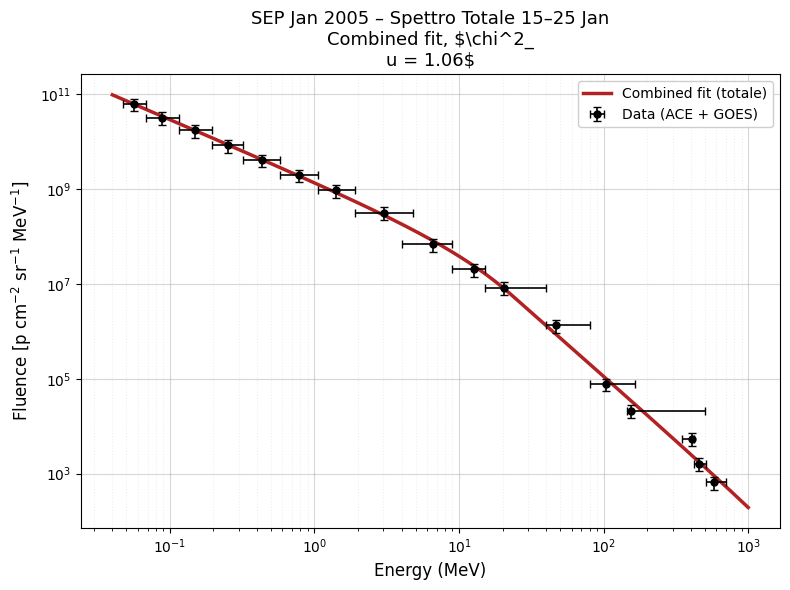

In [8]:
# ============================================================
# 8. PLOT DI CONTROLLO FIT TOTALE + CHI^2 RIDOTTO (FIX xerr)
# ============================================================

print("\n--- CONTROLLO FIT SPETTRO TOTALE ---")

# Asse energetico per il modello
E_model = np.logspace(np.log10(0.04), np.log10(1000.0), 1000)

# Valori modello
Phi_model = combined_function(E_model, *popt_tot)

# Errore sui dati (stesso usato nel fit)
y_err_tot = flu_tot * 0.30

# =========================
# Calcolo CHI^2 ridotto
# =========================
Phi_fit_at_data = combined_function(ene_tot, *popt_tot)
Phi_fit_at_data = np.where(Phi_fit_at_data > 0, Phi_fit_at_data, 1e-40)

residuals = (flu_tot - Phi_fit_at_data) / y_err_tot
chi2 = np.sum(residuals**2)
ndof = len(flu_tot) - len(popt_tot)
chi2_red = chi2 / ndof

print(f"Chi^2 = {chi2:.2f}")
print(f"Ndof  = {ndof}")
print(f"Chi^2 ridotto = {chi2_red:.2f}")

# =========================
# PLOT
# =========================
plt.figure(figsize=(8, 6))

plt.errorbar(
    ene_tot,
    flu_tot,
    yerr=y_err_tot,
    xerr=[np.abs(xerr_l_tot), np.abs(xerr_h_tot)],  # <<< FIX QUI
    fmt="o",
    color="black",
    ecolor="black",
    capsize=3,
    elinewidth=1.2,
    markersize=5,
    label="Data (ACE + GOES)",
    zorder=10
)

plt.plot(
    E_model,
    Phi_model,
    "-",
    color="firebrick",
    linewidth=2.5,
    label="Combined fit (totale)"
)

plt.xscale("log")
plt.yscale("log")
plt.xlabel("Energy (MeV)", fontsize=12)
plt.ylabel(r"Fluence [p cm$^{-2}$ sr$^{-1}$ MeV$^{-1}$]", fontsize=12)
plt.title(
    r"SEP Jan 2005 – Spettro Totale 15–25 Jan"
    + f"\nCombined fit, $\chi^2_\nu = {chi2_red:.2f}$",
    fontsize=13
)

plt.grid(True, which="major", alpha=0.5)
plt.grid(True, which="minor", alpha=0.2, linestyle=":")

plt.legend(framealpha=0.95)
plt.tight_layout()
plt.show()


# RISULTATI PER INPUT SRNIEL modello Combined

In [19]:
# ============================================================
# SR-NIEL INPUT FILE
# Residual Spectral Fluence - JAN 2005 SEP
# Model: Combined (Band × exponential cutoff)
# Data: ACE (low E) + GOES (high E)
# Geometry: planar slab, hemispherical incidence (2π)
# ============================================================

import numpy as np

# ============================================================
# 1) PARAMETRI GENERALI
# ============================================================

E_MIN = 0.04        # MeV  (ACE lower reliable limit)
E_MAX = 1000.0      # MeV  (HEPAD upper conservative limit)
N_E   = 500         # punti energetici (log-spaced)
SOLID_ANGLE = 2 * np.pi   # slab planare → 2π

# ============================================================
# 2) FUNZIONE COMBINED (come nel fit)
# ============================================================

def band_function(E, A, ga, gb, E0):
    E = np.array(E)
    E_break = (gb - ga) * E0
    res = np.zeros_like(E)

    mask = E < E_break
    res[mask] = A * (E[mask] ** -ga) * np.exp(-E[mask] / E0)

    norm = (E_break ** (gb - ga)) * np.exp(ga - gb)
    res[~mask] = A * (E[~mask] ** -gb) * norm

    return res


def combined_function(E, A, ga, gb, E0, Ecut):
    return band_function(E, A, ga, gb, E0) * np.exp(-E / Ecut)


# ============================================================
# 3) GRIGLIA ENERGETICA
# ============================================================

E_grid = np.logspace(np.log10(E_MIN), np.log10(E_MAX), N_E)

# ============================================================
# 4) PARAMETRI DI FIT (DAI TUOI RISULTATI)
# ============================================================
# >>> INSERISCI QUI I popt_combined <<<

params_combined_list = list(combined_fit_params.values())

# ============================================================
# 5) SOMMA CONTRIBUTI EVENTI (in sr⁻¹)
# ============================================================

Phi_total_sr = np.zeros_like(E_grid)

for popt in params_combined_list:
    A, ga, gb, E0, Ecut = popt

    Phi_evt = combined_function(E_grid, A, ga, gb, E0, Ecut)
    Phi_evt = np.maximum(Phi_evt, 1e-40)   # stabilità numerica

    Phi_total_sr += Phi_evt

# ============================================================
# 6) CONVERSIONE sr → slab planare (2π)
# ============================================================

Phi_total = SOLID_ANGLE * Phi_total_sr    # [cm^-2 MeV^-1]

# ============================================================
# 7) SCRITTURA FILE SR-NIEL
# ============================================================

output_file = "SRNIEL_JAN2005_Combined_2pi.txt"

with open(output_file, "w") as f:
    f.write("# Energy [MeV]    Spectral Fluence [cm^-2 MeV^-1]\n")
    for E, Phi in zip(E_grid, Phi_total):
        f.write(f"{E:.6e}\t{Phi:.6e}\n")

print("==============================================")
print("File SR-NIEL pronto:", output_file)
print("Modello: Combined (Band × exp cutoff)")
print("Geometria: slab planare (2π)")
print(f"Range energetico: {E_MIN:.2f} – {E_MAX:.0f} MeV")
print(f"Punti energetici: {N_E}")
print("==============================================")


File SR-NIEL pronto: SRNIEL_JAN2005_Combined_2pi.txt
Modello: Combined (Band × exp cutoff)
Geometria: slab planare (2π)
Range energetico: 0.04 – 1000 MeV
Punti energetici: 500


# Modello BAND

In [22]:
# ============================================================
# SR-NIEL INPUT FILE
# Residual Spectral Fluence - JAN 2005 SEP
# Model: Band function
# Data: ACE (low E) + GOES (high E)
# Geometry: planar slab, hemispherical incidence (2π)
# ============================================================

import numpy as np

# ============================================================
# 1) PARAMETRI GENERALI
# ============================================================

E_MIN = 0.04        # MeV  (ACE lower reliable limit)
E_MAX = 1000.0      # MeV  (HEPAD upper conservative limit)
N_E   = 500         # punti energetici (log-spaced)
SOLID_ANGLE = 2 * np.pi   # slab planare → 2π

# ============================================================
# 2) FUNZIONE BAND (come nel fit)
# ============================================================

def band_function(E, A, ga, gb, E0):
    E = np.array(E)
    E_break = (gb - ga) * E0

    res = np.zeros_like(E)

    mask = E < E_break
    res[mask] = A * (E[mask] ** -ga) * np.exp(-E[mask] / E0)

    norm = (E_break ** (gb - ga)) * np.exp(ga - gb)
    res[~mask] = A * (E[~mask] ** -gb) * norm

    return res


# ============================================================
# 3) GRIGLIA ENERGETICA
# ============================================================

E_grid = np.logspace(np.log10(E_MIN), np.log10(E_MAX), N_E)

# ============================================================
# 4) PARAMETRI DI FIT (BAND) — DAI TUOI RISULTATI
# ============================================================
# band_fit_params deve essere un dict:
# {evento: popt_band = [A, ga, gb, E0]}

# >>> INSERISCI QUI I popt_combined <<<

params_band_list = list(band_fit_params.values())

# ============================================================
# 5) SOMMA CONTRIBUTI EVENTI (in sr⁻¹)
# ============================================================

Phi_total_sr = np.zeros_like(E_grid)

for popt in params_band_list:
    A, ga, gb, E0 = popt

    Phi_evt = band_function(E_grid, A, ga, gb, E0)
    Phi_evt = np.maximum(Phi_evt, 1e-40)   # stabilità numerica

    Phi_total_sr += Phi_evt

# ============================================================
# 6) CONVERSIONE sr → slab planare (2π)
# ============================================================

Phi_total = SOLID_ANGLE * Phi_total_sr    # [cm^-2 MeV^-1]

# ============================================================
# 7) SCRITTURA FILE SR-NIEL
# ============================================================

output_file = "SRNIEL_JAN2005_Band_2pi.txt"

with open(output_file, "w") as f:
    f.write("# Energy [MeV]    Spectral Fluence [cm^-2 MeV^-1]\n")
    for E, Phi in zip(E_grid, Phi_total):
        f.write(f"{E:.6e}\t{Phi:.6e}\n")

print("==============================================")
print("File SR-NIEL pronto:", output_file)
print("Modello: Band function")
print("Geometria: slab planare (2π)")
print(f"Range energetico: {E_MIN:.2f} – {E_MAX:.0f} MeV")
print(f"Punti energetici: {N_E}")
print("==============================================")


File SR-NIEL pronto: SRNIEL_JAN2005_Band_2pi.txt
Modello: Band function
Geometria: slab planare (2π)
Range energetico: 0.04 – 1000 MeV
Punti energetici: 500


## LATEST FILE FINALI PER SPENVIS E TABELLA RIASSUNTIVA ( AGGIORNAMENTO results)

In [4]:
import numpy as np
import pandas as pd
import scipy.integrate as integrate
from scipy.optimize import curve_fit
import re

# ==============================================================================
# 1. FUNZIONI SPETTRALI E FIT IN LOG-SPACE (VERSIONE STABILE)
# ==============================================================================

def ellison_ramaty(E, A, gamma, Er):
    """
    Ellison–Ramaty: A * E^(-gamma) * exp(-E/Er)
    con clipping per evitare overflow / underflow numerici.
    """
    E = np.maximum(np.asarray(E, dtype=float), 1e-10)
    res = A * (E**(-gamma)) * np.exp(-E/Er)
    return np.clip(res, 1e-40, 1e30)


def band_function(E, A, ga, gb, E0):
    """
    Band function spezzata con parte bassa ~E^-ga * exp(-E/E0),
    parte alta ~E^-gb con normalizzazione continua.
    Include:
      - controllo gb > ga
      - break > 0
      - clipping finale
      - gestione input scalare.
    """
    E = np.asarray(E, dtype=float)
    scalar_input = False
    if E.ndim == 0:
        E = E[None]
        scalar_input = True

    E_break = (gb - ga) * E0
    if (gb <= ga) or (E_break <= 0):
        res = np.ones_like(E) * 1e-30
        return res[0] if scalar_input else res

    E = np.maximum(E, 1e-10)

    mask_low = E < E_break
    mask_high = ~mask_low
    res = np.zeros_like(E)

    if np.any(mask_low):
        res[mask_low] = A * (E[mask_low] ** -ga) * np.exp(-E[mask_low] / E0)

    if np.any(mask_high):
        norm = (E_break ** (gb - ga)) * np.exp(ga - gb)
        res[mask_high] = A * (E[mask_high] ** -gb) * norm

    res = np.clip(res, 1e-40, 1e30)
    return res[0] if scalar_input else res


def combined_function(E, A, ga, gb, E0, Er):
    """
    Band * exp(-E/Er) con clipping numerico finale.
    """
    E = np.maximum(np.asarray(E, dtype=float), 1e-10)
    res = band_function(E, A, ga, gb, E0) * np.exp(-E/Er)
    return np.clip(res, 1e-40, 1e30)


def fit_log_space(func, x, y, y_err, p0, bounds):
    """Fit in log10-space per evitare che le basse energie dominino il χ²."""
    def log_model(x_in, *pars):
        val = func(x_in, *pars)
        return np.log10(np.maximum(val, 1e-30))

    sigma_log = y_err / (y * np.log(10))
    sigma_log = np.nan_to_num(sigma_log, nan=1.0, posinf=1.0, neginf=1.0)

    try:
        popt, pcov = curve_fit(
            log_model, x, np.log10(y),
            p0=p0, sigma=sigma_log,
            absolute_sigma=True, bounds=bounds,
            maxfev=20000
        )
        return popt, pcov
    except Exception:
        return None, None


def chi2_red(func, x, y, y_err, popt):
    """χ² ridotto in spazio lineare."""
    if popt is None:
        return np.inf
    model = func(x, *popt)
    mask = (y > 0) & (y_err > 0) & np.isfinite(model)
    if mask.sum() <= len(popt):
        return np.inf
    res = (y[mask] - model[mask]) / y_err[mask]
    chi2 = np.sum(res**2)
    dof = mask.sum() - len(popt)
    return chi2 / dof if dof > 0 else np.inf


def integrate_fluence(func, popt, Emin, Emax=1e4):
    """Fluenza integrata sopra Emin [MeV]."""
    if popt is None:
        return 0.0
    val, _ = integrate.quad(lambda E: func(E, *popt), Emin, Emax, limit=500)
    return val

# ==============================================================================
# 2. META-DATI EVENTI E UTILS
# ==============================================================================

metadata_db = {
    "1° SEP  15/01 07:55 - 15/01 20:25": dict(
        start="2005-01-15 23:00",
        end="2005-01-17 09:30",
        duration="34.5",
        loc="N15W05",
        flare_class="X2.6"
    ),
    "2° SEP  16/01 02:10 - 19/01 19:00": dict(
        start="2005-01-17 09:30",
        end="2005-01-20 06:30",
        duration="69.0",
        loc="N15W25",
        flare_class="X3.8"
    ),
    "3° SEP 20/01 06:40 - 25/01 00:00": dict(
        start="2005-01-20 06:50",
        end="2005-01-22 00:00",
        duration="41.2",
        loc="N14W61",
        flare_class="X7.1"
    )
}

def get_metadata(evt_name):
    if evt_name in metadata_db:
        return metadata_db[evt_name]
    lower = evt_name.lower()
    for key, meta in metadata_db.items():
        if key.split()[0].lower() in lower:  # "1°", "2°", "3°"
            return meta
    return dict(start="MANUAL", end="MANUAL", duration="-", loc="-", flare_class="-")


def clean_filename(name):
    """Nome file safe per Windows / Linux."""
    safe = re.sub(r'[^\w\-\.]', '_', name)
    safe = re.sub(r'_+', '_', safe).strip('_')
    return safe

# ==============================================================================
# 3. LOOP SUGLI EVENTI: FIT, FLUENZE, FILE SPENVIS, TABELLA
#    (usa il dict `results` già calcolato con le fluenze canale-per-canale)
# ==============================================================================

rows = []

print("=== FIT PER CALCOLO FLUENZA E GENERAZIONE FILE SPENVIS – JAN 2005 ===\n")

for evt_name, data in results.items():
    print(f">>> Evento: {evt_name}")

    x = np.array(data["x"], dtype=float)
    y = np.array(data["y"], dtype=float)
    # errore verticale: 30% sistematico
    y_err = 0.30 * y

    # --- Fit Ellison-Ramaty ---
    p0_er     = [1e8, 1.5, 100.0]
    bounds_er = ([0, 0.0, 0.0], [np.inf, 10.0, 1e4])
    popt_er, pcov_er = fit_log_space(ellison_ramaty, x, y, y_err, p0_er, bounds_er)
    chi2_er = chi2_red(ellison_ramaty, x, y, y_err, popt_er)

    # --- Fit Band ---
    p0_b     = [1e7, 1.0, 3.0, 10.0]
    bounds_b = ([0, 0.1, 0.1, 0.5], [np.inf, 10.0, 10.0, 500.0])
    popt_b, pcov_b = fit_log_space(band_function, x, y, y_err, p0_b, bounds_b)
    chi2_b = chi2_red(band_function, x, y, y_err, popt_b)

    # --- Fit Combined ---
    popt_c, pcov_c, chi2_c = None, None, np.inf
    if popt_b is not None:
        p0_c     = [popt_b[0], popt_b[1], popt_b[2], popt_b[3], 500.0]
        bounds_c = ([0, 0.1, 0.1, 0.5, 10.0],
                    [np.inf, 10.0, 10.0, 500.0, 5000.0])
        popt_c, pcov_c = fit_log_space(combined_function, x, y, y_err, p0_c, bounds_c)
        chi2_c = chi2_red(combined_function, x, y, y_err, popt_c)

    # --- Scelta modello migliore (includendo anche la covarianza) ---
    candidates = []
    if popt_er is not None:
        candidates.append(("Ellison-Ramaty", chi2_er, popt_er, ellison_ramaty, pcov_er))
    if popt_b is not None:
        candidates.append(("Band",           chi2_b,  popt_b,  band_function, pcov_b))
    if popt_c is not None:
        candidates.append(("Combined",       chi2_c,  popt_c,  combined_function, pcov_c))

    if not candidates:
        print("   !! Nessun fit riuscito, salto evento.\n")
        continue

    model_name, chi2_best, popt_best, func_best, pcov_best = sorted(
        candidates, key=lambda t: t[1]
    )[0]

    # --- Stabilità numerica: Combined con Er enorme ≈ power-law → forzo Band ---
    # Combined numericamente non fisico → ripiega su Band
    if model_name == "Combined" and popt_best[4] > 1000:
        print("   -> Cutoff non risolto: uso Band")
        model_name = "Band"
        popt_best = popt_b
        func_best = band_function
        pcov_best = pcov_b

    print(f"   Modello scelto: {model_name}  (χ²_red = {chi2_best:.2f})")

    # === Salvataggio del modello scelto per uso futuro (Monte Carlo, dose, ecc.) ===
    results[evt_name]["model"]    = model_name
    results[evt_name]["params"]   = popt_best
    results[evt_name]["function"] = func_best
    results[evt_name]["cov"]      = pcov_best

    # --- Fluenze integrate sopra varie soglie (MeV) ---
    F10  = integrate_fluence(func_best, popt_best, 10)
    F30  = integrate_fluence(func_best, popt_best, 30)
    F60  = integrate_fluence(func_best, popt_best, 60)
    F100 = integrate_fluence(func_best, popt_best, 100)
    F300 = integrate_fluence(func_best, popt_best, 300)

    # --- Spettri per SPENVIS ---
    E_full = np.logspace(np.log10(0.1), np.log10(2000.0), 200)
    J_full = func_best(E_full, *popt_best)

    safe_evt = clean_filename(evt_name)

    df_full = pd.DataFrame({"Energy_MeV": E_full, "Diff_Fluence": J_full})
    full_fname = f"SPENVIS_{safe_evt}_full.txt"
    df_full.to_csv(full_fname, sep="\t", index=False, float_format="%.6e")

    N_spenv = 80
    E_red = np.logspace(np.log10(0.1), np.log10(2000.0), N_spenv)
    logE_full = np.log10(E_full)
    logJ_full = np.log10(np.maximum(J_full, 1e-30))
    J_red = 10.0 ** np.interp(np.log10(E_red), logE_full, logJ_full)

    df_red = pd.DataFrame({"Energy_MeV": E_red, "Diff_Fluence": J_red})
    red_fname = f"SPENVIS_{safe_evt}_reduced.txt"
    df_red.to_csv(red_fname, sep="\t", index=False, float_format="%.6e")

    # --- Riga riassuntiva per tabella CSV ---
    meta = get_metadata(evt_name)

    A_val  = popt_best[0]
    E0_val = ""
    Er_val = ""
    Ga_val = ""
    Gb_val = ""

    if model_name == "Ellison-Ramaty":
        Ga_val = popt_best[1]
        Er_val = popt_best[2]
        E0_val = Er_val  # per compatibilità con colonna E0
    elif model_name == "Band":
        Ga_val = popt_best[1]
        Gb_val = popt_best[2]
        E0_val = popt_best[3]
    elif model_name == "Combined":
        Ga_val = popt_best[1]
        Gb_val = popt_best[2]
        E0_val = popt_best[3]
        Er_val = popt_best[4]

    row = [
        evt_name,                           # Event_ID
        meta["start"],                      # Start_time
        meta["end"],                        # End_time
        meta["duration"],                   # Duration
        meta["loc"],                        # Source_loc
        "1.0",                              # Dist_AU
        meta["flare_class"],                # Class
        f"{F10:.3e}",                       # F>10
        f"{F30:.3e}",                       # F>30
        f"{F60:.3e}",                       # F>60
        f"{F100:.3e}",                      # F>100
        f"{F300:.3e}",                      # F>300
        "N/A",                              # Peak (non calcolato qui)
        model_name,                         # Model
        f"{A_val:.2e}",                     # A
        f"{float(E0_val):.2f}" if E0_val != "" else "",
        f"{float(Er_val):.2f}" if Er_val != "" else "",
        f"{float(Ga_val):.2f}" if Ga_val != "" else "",
        f"{float(Gb_val):.2f}" if Gb_val != "" else "",
        f"{chi2_best:.2f}",                 # Chi2
        red_fname,                          # Filename (SPENVIS ridotto)
        "Generated by Python fit"           # Notes
    ]
    rows.append(row)

    print(f"   -> Spettri salvati: {full_fname}, {red_fname}\n")

# ==============================================================================
# 4. TABELLA FINALE (STILE CSV PER TESI / SPENVIS)
# ==============================================================================

print("\n" + "="*80)
print("TABELLA CSV GENERATA")
print("="*80 + "\n")

header = [
    "Event_ID", "Start_time", "End_time", "Duration", "Source_loc", "Dist_AU",
    "Class", "F>10", "F>30", "F>60", "F>100", "F>300", "Peak",
    "Model", "A", "E0", "Er", "Ga", "Gb", "Chi2", "Filename", "Notes"
]

print(", ".join(header))
for r in rows:
    print(", ".join(str(v) for v in r))


=== FIT PER CALCOLO FLUENZA E GENERAZIONE FILE SPENVIS – JAN 2005 ===

>>> Evento: 1° SEP  15/01 07:55 - 15/01 20:25
   Modello scelto: Band  (χ²_red = 27.55)
   -> Spettri salvati: SPENVIS_1_SEP_15_01_07_55_-_15_01_20_25_full.txt, SPENVIS_1_SEP_15_01_07_55_-_15_01_20_25_reduced.txt

>>> Evento: 2° SEP  16/01 02:10 - 19/01 19:00
   Modello scelto: Band  (χ²_red = 4.15)
   -> Spettri salvati: SPENVIS_2_SEP_16_01_02_10_-_19_01_19_00_full.txt, SPENVIS_2_SEP_16_01_02_10_-_19_01_19_00_reduced.txt

>>> Evento: 3° SEP 20/01 06:40 - 25/01 00:00
   Modello scelto: Combined  (χ²_red = 0.82)
   -> Spettri salvati: SPENVIS_3_SEP_20_01_06_40_-_25_01_00_00_full.txt, SPENVIS_3_SEP_20_01_06_40_-_25_01_00_00_reduced.txt


TABELLA CSV GENERATA

Event_ID, Start_time, End_time, Duration, Source_loc, Dist_AU, Class, F>10, F>30, F>60, F>100, F>300, Peak, Model, A, E0, Er, Ga, Gb, Chi2, Filename, Notes
1° SEP  15/01 07:55 - 15/01 20:25, 2005-01-15 23:00, 2005-01-17 09:30, 34.5, N15W05, 1.0, X2.6, 2.215e+05, 

# SR-NIEL results SETUP


In [9]:
import numpy as np
import pandas as pd
import os
import re

print("=== Preparazione dataset per SR-NIEL — JAN 2005 ===\n")

output_dir = "SRNIEL_input"
os.makedirs(output_dir, exist_ok=True)

def safe_filename(name):
    # rimuove caratteri pericolosi
    name = re.sub(r'[^\w\s-]', '', name)       # elimina ° / : etc
    name = name.replace(" ", "_")              # spazi → underscore
    name = re.sub(r'__+', '_', name)           # no doppi underscore
    return name.strip("_")

summary_rows = []

for evt_name, data in results.items():

    if not all(k in data for k in ["model", "params", "function"]):
        print(f"SKIP: {evt_name}, nessun fit valido.")
        continue

    func  = data["function"]
    pars  = data["params"]
    model = data["model"]

    # Energia log-spaced compatibile con SR-NIEL
    E = np.logspace(np.log10(0.1), np.log10(2000), 250)
    J = func(E, *pars)
    J = np.maximum(J, 1e-40)

    # File output
    fout = os.path.join(output_dir, f"SPE_{safe_filename(evt_name)}_SRNIEL.txt")

    df = pd.DataFrame({"Energy_MeV": E, "Diff_Fluence": J})
    df.to_csv(fout, sep="\t", index=False, float_format="%.6e")
    print(f"File creato → {fout}")

    # Fluenze integrate sopra varie soglie — quick numeric integration
    def F(Emin):
        return np.trapezoid(J[E >= Emin], E[E >= Emin]) if np.any(E >= Emin) else 0


    summary_rows.append([
        evt_name,
        model,
        pars[0],
        F(10), F(30), F(60), F(100), F(300),
        fout
    ])

df_summary = pd.DataFrame(
    summary_rows,
    columns=[
        "Event_ID", "Model", "A",
        "Fluence >10 MeV",
        "Fluence >30 MeV",
        "Fluence >60 MeV",
        "Fluence >100 MeV",
        "Fluence >300 MeV",
        "Filename"
    ]
)

print("\n=== Tabella riassuntiva ===")
display(df_summary)

print("\n=== SR-NIEL Setup COMPLETATO ===")


=== Preparazione dataset per SR-NIEL — JAN 2005 ===

File creato → SRNIEL_input\SPE_1_SEP_1501_0755_-_1501_2025_SRNIEL.txt
File creato → SRNIEL_input\SPE_2_SEP_1601_0210_-_1901_1900_SRNIEL.txt
File creato → SRNIEL_input\SPE_3_SEP_2001_0640_-_2501_0000_SRNIEL.txt

=== Tabella riassuntiva ===


,Event_ID,Model,A,Fluence >10 MeV,Fluence >30 MeV,Fluence >60 MeV,Fluence >100 MeV,Fluence >300 MeV,Filename
0,1° SEP 15/01 07:55 - 15/01 20:25,Band,3.167875e+06,2.189198e+05,4.149071e+04,1.507709e+04,6.926621e+03,1248.605591,SRNIEL_input\SPE_1_SEP_1501_0755_-_1501_2025_S...
1,2° SEP 16/01 02:10 - 19/01 19:00,Band,1.032429e+09,1.908636e+08,2.101565e+07,3.135882e+06,7.181754e+05,29895.975611,SRNIEL_input\SPE_2_SEP_1601_0210_-_1901_1900_S...
2,3° SEP 20/01 06:40 - 25/01 00:00,Combined,5.065455e+08,7.845529e+07,2.362197e+07,1.050338e+07,5.258753e+06,803420.004100,SRNIEL_input\SPE_3_SEP_2001_0640_-_2501_0000_S...



=== SR-NIEL Setup COMPLETATO ===


# Propagazione incertezze Monte-Carlo 

In [5]:
# ==============================================================================
# 5. PROPAGAZIONE MONTE CARLO DELLE INCERTEZZE SULLE FLUENZE INTEGRATE
# ==============================================================================

import numpy as np
import pandas as pd

# Soglie di energia (MeV) per cui vuoi le fluenze integrate
E_thresholds = [10, 30, 60, 100, 300]
E_labels     = ["F>10", "F>30", "F>60", "F>100", "F>300"]

# Numero di realizzazioni Monte Carlo
N_mc = 2000  # aumenta se vuoi stime più stabili

rng = np.random.default_rng(12345)  # seed riproducibile

def is_physically_valid(params, model_name):
    """
    Controllo veloce di 'fisicità' dei parametri campionati.
    Evita di integrare cose chiaramente non sensate.
    """
    params = np.asarray(params, dtype=float)
    if not np.all(np.isfinite(params)):
        return False

    A = params[0]
    if A <= 0:
        return False

    if model_name == "Ellison-Ramaty":
        # [A, gamma, Er]
        if len(params) < 3:
            return False
        gamma, Er = params[1], params[2]
        if gamma <= 0 or Er <= 0:
            return False

    elif model_name == "Band":
        # [A, ga, gb, E0]
        if len(params) < 4:
            return False
        ga, gb, E0 = params[1], params[2], params[3]
        if ga <= 0 or gb <= 0 or E0 <= 0:
            return False
        if gb <= ga:
            return False

    elif model_name == "Combined":
        # [A, ga, gb, E0, Er]
        if len(params) < 5:
            return False
        ga, gb, E0, Er = params[1], params[2], params[3], params[4]
        if ga <= 0 or gb <= 0 or E0 <= 0 or Er <= 0:
            return False
        if gb <= ga:
            return False

    return True

mc_rows = []

print("\n=== PROPAGAZIONE MONTE CARLO DELLE INCERTEZZE SULLE FLUENZE ===\n")

for evt_name, data in results.items():
    func_best   = data.get("function", None)
    popt_best   = data.get("params", None)
    pcov_best   = data.get("cov", None)
    model_name  = data.get("model", "UNKNOWN")

    if func_best is None or popt_best is None or pcov_best is None:
        print(f"Evento {evt_name}: mancano funzione/parametri/covarianza, salto.")
        continue

    popt_best = np.asarray(popt_best, dtype=float)
    pcov_best = np.asarray(pcov_best, dtype=float)

    # Check dimensioni / consistenza covarianza
    if pcov_best.shape[0] != pcov_best.shape[1] or pcov_best.shape[0] != popt_best.size:
        print(f"Evento {evt_name}: covarianza di forma inconsistente, salto Monte Carlo.")
        continue

    # Rendo la matrice di covarianza 'usabile' (aggiungo jitter se non è positiva definita)
    try:
        np.linalg.cholesky(pcov_best)
        cov_used = pcov_best
    except np.linalg.LinAlgError:
        diag = np.abs(np.diag(pcov_best))
        jitter = 1e-8 * diag + 1e-12
        cov_used = pcov_best + np.diag(jitter)
        # Se ancora non va, rinuncio
        try:
            np.linalg.cholesky(cov_used)
        except np.linalg.LinAlgError:
            print(f"Evento {evt_name}: covarianza troppo degenerata, salto Monte Carlo.")
            continue

    # Campionamento parametri (con allow_singular per sicurezza)
    params_samples = rng.multivariate_normal(
        mean=popt_best,
        cov=cov_used,
        size=N_mc,
        check_valid="ignore",
        method="eigh"
    )

    # Dizionario che accumula le fluenze per ogni soglia
    flu_mc = {lab: [] for lab in E_labels}

    for pars in params_samples:
        # filtro soluzioni non fisiche
        if not is_physically_valid(pars, model_name):
            continue

        for Emin, lab in zip(E_thresholds, E_labels):
            F_val = integrate_fluence(func_best, pars, Emin)
            if np.isfinite(F_val) and F_val > 0:
                flu_mc[lab].append(F_val)

    # Costruzione riga riassuntiva per l'evento
    row = {"Event_ID": evt_name, "Model": model_name}

    for lab in E_labels:
        arr = np.array(flu_mc[lab], dtype=float)
        if arr.size == 0:
            mean_val = np.nan
            std_val  = np.nan
        else:
            mean_val = np.mean(arr)
            std_val  = np.std(arr, ddof=1)

        row[lab + "_mean"]    = mean_val
        row[lab + "_std"]     = std_val
        row[lab + "_rel_err"] = std_val / mean_val if mean_val > 0 else np.nan

    mc_rows.append(row)

# DataFrame finale con le incertezze Monte Carlo
df_mc = pd.DataFrame(mc_rows)
df_mc = df_mc.set_index("Event_ID")

print("=== Tabella riassuntiva incertezze Monte Carlo sulle fluenze integrate ===\n")
print(df_mc.to_string(float_format=lambda x: f"{x:.3e}"))

# Se vuoi salvarla anche su file per la tesi:
df_mc.to_csv("MC_uncertainties_fluences.csv", float_format="%.6e")
print("\n-> Tabella salvata in 'MC_uncertainties_fluences.csv'")



=== PROPAGAZIONE MONTE CARLO DELLE INCERTEZZE SULLE FLUENZE ===

=== Tabella riassuntiva incertezze Monte Carlo sulle fluenze integrate ===

                                      Model  F>10_mean  F>10_std  F>10_rel_err  F>30_mean  F>30_std  F>30_rel_err  F>60_mean  F>60_std  F>60_rel_err  F>100_mean  F>100_std  F>100_rel_err  F>300_mean  F>300_std  F>300_rel_err
Event_ID                                                                                                                                                                                                                        
1° SEP  15/01 07:55 - 15/01 20:25      Band  1.934e+05 4.828e+04     2.497e-01  3.724e+04 8.742e+03     2.348e-01  1.317e+04 3.100e+03     2.354e-01   6.106e+03  1.470e+03      2.407e-01   1.131e+03  2.978e+02      2.632e-01
2° SEP  16/01 02:10 - 19/01 19:00      Band  1.876e+08 2.712e+07     1.446e-01  2.162e+07 4.523e+06     2.092e-01  3.129e+06 5.669e+05     1.812e-01   7.250e+05  1.072e+05      1.479e

In [6]:
display(df_mc)

,Model,F>10_mean,F>10_std,F>10_rel_err,F>30_mean,F>30_std,F>30_rel_err,F>60_mean,F>60_std,F>60_rel_err,F>100_mean,F>100_std,F>100_rel_err,F>300_mean,F>300_std,F>300_rel_err
Event_ID,,,,,,,,,,,,,,,,
1° SEP 15/01 07:55 - 15/01 20:25,Band,1.933825e+05,4.827829e+04,0.249652,3.723640e+04,8.741608e+03,0.234760,1.316793e+04,3.099584e+03,0.235389,6.105711e+03,1.469687e+03,0.240707,1131.098606,297.761448,0.263250
2° SEP 16/01 02:10 - 19/01 19:00,Band,1.875807e+08,2.712436e+07,0.144601,2.161684e+07,4.523177e+06,0.209243,3.129101e+06,5.668528e+05,0.181155,7.250312e+05,1.072260e+05,0.147892,31571.904484,5338.446213,0.169089
3° SEP 20/01 06:40 - 25/01 00:00,Combined,6.469627e+07,1.893628e+07,0.292695,1.908983e+07,5.819391e+06,0.304842,8.076659e+06,2.600371e+06,0.321961,3.969762e+06,1.349978e+06,0.340065,590796.736556,248742.829289,0.421029


--- ESECUZIONE FIT E GENERAZIONE OUTPUT ---


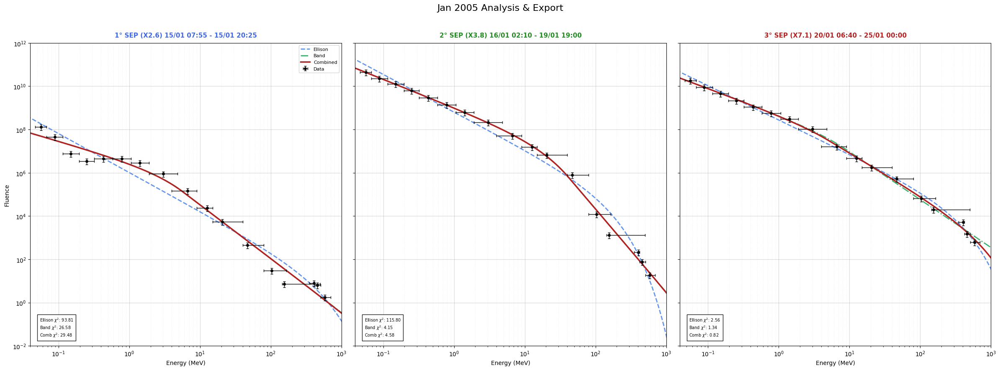


TABELLA CSV GENERATA

Event_ID, Start_time, End_time, Duration, Source_loc, Dist_AU, Class, F>10, F>30, F>60, F>100, F>300, Peak, Model, A, E0, Er, Ga, Gb, Chi2, Filename, Notes
1° SEP (X2.6) 15/01 07:55 - 15/01 20:25, 2005-01-15 23:00, 2005-01-17 09:30, 34.5, N15W05, 1.0, X2.6, 2.214e+05, 4.298e+04, 1.528e+04, 7.126e+03, 1.378e+03, N/A, Band, 3.22e+06, 3.75, , 0.95, 2.49, 26.58, SPENVIS_1_SEP_X2.6_15_01_07_55_-_15_01_20_25.txt, Generated by Python Fit
2° SEP (X3.8) 16/01 02:10 - 19/01 19:00, 2005-01-17 09:30, 2005-01-20 06:30, 69.0, N15W25, 1.0, X3.8, 1.930e+08, 2.231e+07, 3.187e+06, 7.431e+05, 3.244e+04, N/A, Band, 1.03e+09, 16.32, , 1.31, 3.85, 4.15, SPENVIS_2_SEP_X3.8_16_01_02_10_-_19_01_19_00.txt, Generated by Python Fit
3° SEP (X7.1) 20/01 06:40 - 25/01 00:00, 2005-01-20 06:50, 2005-01-22 00:00, 41.2, N14W61, 1.0, X7.1, 7.930e+07, 2.430e+07, 1.060e+07, 5.358e+06, 8.497e+05, N/A, Combined, 4.75e+08, 6.87, 450.47, 1.22, 1.95, 0.82, SPENVIS_3_SEP_X7.1_20_01_06_40_-_25_01_00_00.txt,

In [27]:
import matplotlib.pyplot as plt
import numpy as np
import pandas as pd
import scipy.integrate as integrate
from scipy.optimize import curve_fit
import re  # Importiamo Regex per pulire i nomi dei file

# ==============================================================================
# 1. DEFINIZIONE FUNZIONI DI FIT
# ==============================================================================

def ellison_ramaty(E, A, gamma, Er):
    E = np.maximum(E, 1e-10) 
    return A * (E**(-gamma)) * np.exp(-E/Er)

def band_function(E, A, ga, gb, E0):
    E = np.asarray(E)
    scalar_input = False
    if E.ndim == 0:
        E = E[None]
        scalar_input = True

    E_break = (gb - ga) * E0
    
    if (gb <= ga) or (E_break <= 0):
        res = np.ones_like(E) * 1e-30
        return res[0] if scalar_input else res

    E = np.maximum(E, 1e-10)
    
    mask_low = E < E_break
    mask_high = ~mask_low
    
    res = np.zeros_like(E)
    
    if np.any(mask_low):
        res[mask_low] = A * (E[mask_low] ** -ga) * np.exp(-E[mask_low] / E0)
        
    if np.any(mask_high):
        norm_factor = (E_break ** (gb - ga)) * np.exp(ga - gb)
        res[mask_high] = A * (E[mask_high] ** -gb) * norm_factor
        
    return res[0] if scalar_input else res

def combined_function(E, A, ga, gb, E0, Er):
    return band_function(E, A, ga, gb, E0) * np.exp(-E/Er)

def fit_log_space(func, x, y, y_err, p0, bounds=(-np.inf, np.inf)):
    def log_func(x_in, *params):
        val = func(x_in, *params)
        return np.log10(np.maximum(val, 1e-30))
    
    sigma_log = y_err / (y * np.log(10))
    sigma_log = np.nan_to_num(sigma_log, nan=1.0)
    
    try:
        return curve_fit(log_func, x, np.log10(y), p0=p0, sigma=sigma_log, absolute_sigma=True, bounds=bounds, maxfev=20000)
    except:
        return None, None

def get_chi2_red(func, x, y, yerr, popt):
    if popt is None: return np.inf
    model = func(x, *popt)
    mask = (y > 0) & (yerr > 0)
    if np.sum(mask) <= len(popt): return np.inf
    residuals = (y[mask] - model[mask]) / yerr[mask]
    chi2 = np.sum(residuals**2)
    dof = len(x[mask]) - len(popt)
    return chi2 / dof if dof > 0 else np.inf

def integrate_fluence(func, popt, threshold):
    if popt is None: return 0.0
    val, _ = integrate.quad(lambda E: func(E, *popt), threshold, 10000) 
    return val

# ==============================================================================
# 2. METADATI E PULIZIA NOMI
# ==============================================================================

metadata_db = [
    {"keywords": ["15", "precursor"], "start": "2005-01-15 23:00", "end": "2005-01-17 09:30", "dur": "34.5", "loc": "N15W05", "class": "X2.6"},
    {"keywords": ["17", "big", "main", "2°"], "start": "2005-01-17 09:30", "end": "2005-01-20 06:30", "dur": "69.0", "loc": "N15W25", "class": "X3.8"},
    {"keywords": ["20", "gle", "late", "3°"], "start": "2005-01-20 06:50", "end": "2005-01-22 00:00", "dur": "41.2", "loc": "N14W61", "class": "X7.1"}
]

def get_metadata(evt_name):
    name_lower = evt_name.lower()
    for item in metadata_db:
        if any(k in name_lower for k in item["keywords"]):
            return item
    return {"start": "MANUAL", "end": "MANUAL", "dur": "-", "loc": "-", "class": "-"}

def clean_filename(name):
    """Rimuove caratteri illegali per i nomi dei file (:, /, *, ?, etc)"""
    # Sostituisce tutto ciò che non è alfanumerico, trattino o punto con underscore
    clean = re.sub(r'[^\w\-\.]', '_', name)
    # Rimuove underscore multipli
    clean = re.sub(r'_+', '_', clean)
    return clean

# ==============================================================================
# 3. SUPER-PLOT E GENERAZIONE TABELLA
# ==============================================================================

x_plot = np.logspace(np.log10(0.03), np.log10(2000), 1000)
fig, axes = plt.subplots(1, 3, figsize=(24, 9), sharey=True)
axes = axes.flatten()

table_rows = []

print("--- ESECUZIONE FIT E GENERAZIONE OUTPUT ---")

for i, (evt_name, data) in enumerate(results.items()):
    ax = axes[i]
    
    # Recupero Dati
    x = data['x']
    y = data['y']
    x_errs = [np.abs(data['x_err'][0]), np.abs(data['x_err'][1])] 
    color_evt = data['color']
    y_err = y * 0.30 
    
    # Plot Dati
    ax.errorbar(x, y, yerr=y_err, xerr=x_errs, fmt='o', color='black', ecolor='black', 
                capsize=2, elinewidth=1, markersize=4, label='Data', zorder=10)
    
    stats_box = ""
    candidates = [] 

    # --- FIT ---
    # Ellison
    p0_e = [1e8, 1.5, 100.0]
    popt_e, _ = fit_log_space(ellison_ramaty, x, y, y_err, p0_e, bounds=([0, 0, 0], [np.inf, 10, 10000]))
    chi2_e = get_chi2_red(ellison_ramaty, x, y, y_err, popt_e)
    if popt_e is not None:
        ax.plot(x_plot, ellison_ramaty(x_plot, *popt_e), '--', color='cornflowerblue', lw=2, label='Ellison')
        candidates.append(('Ellison', chi2_e, popt_e, ellison_ramaty))
        stats_box += f"Ellison $\\chi^2$: {chi2_e:.2f}\n"

    # Band
    p0_b = [1e7, 1.0, 3.0, 10.0]
    popt_b, _ = fit_log_space(band_function, x, y, y_err, p0_b, bounds=([0, 0.1, 0.1, 0.5], [np.inf, 10, 10, 500]))
    chi2_b = get_chi2_red(band_function, x, y, y_err, popt_b)
    if popt_b is not None:
        ax.plot(x_plot, band_function(x_plot, *popt_b), '-.', color='mediumseagreen', lw=2, label='Band')
        candidates.append(('Band', chi2_b, popt_b, band_function))
        stats_box += f"Band $\\chi^2$: {chi2_b:.2f}\n"

    # Combined
    if popt_b is not None:
        p0_c = [*popt_b, 1000.0]
        popt_c, _ = fit_log_space(combined_function, x, y, y_err, p0_c, bounds=([0, 0.1, 0.1, 0.5, 10], [np.inf, 10, 10, 500, 10000]))
        chi2_c = get_chi2_red(combined_function, x, y, y_err, popt_c)
        if popt_c is not None:
            ax.plot(x_plot, combined_function(x_plot, *popt_c), '-', color='firebrick', lw=2.5, label='Combined')
            candidates.append(('Combined', chi2_c, popt_c, combined_function))
            stats_box += f"Comb $\\chi^2$: {chi2_c:.2f}"

    # --- SELEZIONE VINCITORE ---
    if candidates:
        candidates.sort(key=lambda x: x[1]) 
        best_name, best_chi2, best_popt, best_func = candidates[0]
        
        # 1. Calcolo Fluenze
        f10  = integrate_fluence(best_func, best_popt, 10)
        f30  = integrate_fluence(best_func, best_popt, 30)
        f60  = integrate_fluence(best_func, best_popt, 60)
        f100 = integrate_fluence(best_func, best_popt, 100)
        f300 = integrate_fluence(best_func, best_popt, 300)
        
        # 2. Generazione File SPENVIS (Con nome pulito)
        #sp_x = np.logspace(np.log10(0.1), np.log10(2000), 200)
        #sp_y = best_func(sp_x, *best_popt)

         # ==========================
        # GENERAZIONE SPETTRO SPENVIS
        # ==========================

        # 1) Spettro "denso" per grafici e archivio
        full_x = np.logspace(np.log10(0.1), np.log10(2000), 200)
        full_y = best_func(full_x, *best_popt)

        safe_name = clean_filename(evt_name)

        pd.DataFrame({
            'Energy_MeV': full_x,
            'Diff_Fluence': full_y
        }).to_csv(f"SPENVIS_{safe_name}_full.txt", sep='\t', index=False, float_format='%.6e')


        # 2) Spettro "ridotto" per SPENVIS: max 80 punti
        N_spenv = 80
        sp_x = np.logspace(np.log10(0.1), np.log10(2000), N_spenv)

        # Interpolazione log-log
        log_full_x = np.log10(full_x)
        log_full_y = np.log10(np.maximum(full_y, 1e-30))
        sp_y = 10**np.interp(np.log10(sp_x), log_full_x, log_full_y)

        filename_sp = f"SPENVIS_{safe_name}_reduced.txt"

        pd.DataFrame({
            'Energy_MeV': sp_x,
            'Diff_Fluence': sp_y
        }).to_csv(filename_sp, sep='\t', index=False, float_format='%.6e')

        
        # FIX OSERROR: Pulizia nome file
        safe_name = clean_filename(evt_name)
        filename_sp = f"SPENVIS_{safe_name}.txt"
        
        pd.DataFrame({'Energy_MeV': sp_x, 'Diff_Fluence': sp_y}).to_csv(filename_sp, sep='\t', index=False, float_format='%.6e')
        
        # 3. Dati Tabella
        meta = get_metadata(evt_name)
        
        # Parametri
        A_val = best_popt[0]
        E0_val = Er_val = Ga_val = Gb_val = ""
        
        if best_name == 'Ellison':
            Ga_val, Er_val = best_popt[1], best_popt[2]
            E0_val = Er_val 
        elif best_name == 'Band':
            Ga_val, Gb_val, E0_val = best_popt[1], best_popt[2], best_popt[3]
        elif best_name == 'Combined':
            Ga_val, Gb_val, E0_val, Er_val = best_popt[1], best_popt[2], best_popt[3], best_popt[4]

        row = [
            evt_name, meta['start'], meta['end'], meta['dur'], meta['loc'], "1.0", meta['class'],
            f"{f10:.3e}", f"{f30:.3e}", f"{f60:.3e}", f"{f100:.3e}", f"{f300:.3e}",
            "N/A", best_name, f"{A_val:.2e}", 
            f"{float(E0_val):.2f}" if E0_val!="" else "", 
            f"{float(Er_val):.2f}" if Er_val!="" else "", 
            f"{float(Ga_val):.2f}" if Ga_val!="" else "", 
            f"{float(Gb_val):.2f}" if Gb_val!="" else "", 
            f"{best_chi2:.2f}", filename_sp, "Generated by Python Fit"
        ]
        table_rows.append(row)

    # Styling
    ax.set_title(evt_name, fontsize=11, color=color_evt, fontweight='bold', pad=10)
    ax.set_xscale('log'); ax.set_yscale('log')
    ax.set_xlim(0.04, 1000); ax.set_ylim(1e-2, 1e12)
    ax.grid(True, which="major", alpha=0.5); ax.grid(True, which="minor", alpha=0.2, linestyle=':')
    ax.set_xlabel("Energy (MeV)", fontsize=10)
    if i == 0: ax.set_ylabel(r"Fluence", fontsize=10); ax.legend(loc='upper right', fontsize=8)
    ax.text(0.03, 0.03, stats_box, transform=ax.transAxes, fontsize=7, bbox=dict(facecolor='white', alpha=0.9))

plt.suptitle("Jan 2005 Analysis & Export", fontsize=16, y=0.98)
plt.tight_layout(rect=[0, 0.0, 1, 0.96])
plt.show()

# --- STAMPA TABELLA ---
print("\n" + "="*80)
print("TABELLA CSV GENERATA")
print("="*80 + "\n")

header = "Event_ID, Start_time, End_time, Duration, Source_loc, Dist_AU, Class, F>10, F>30, F>60, F>100, F>300, Peak, Model, A, E0, Er, Ga, Gb, Chi2, Filename, Notes"
print(header)
for r in table_rows:
    print(", ".join(str(x) for x in r))

In [ ]:
plt.close('all')

# Evento OCT 2003


2 week period of intense solar activity,  5 large SEP events each associated with X-class flares and fast CMEs.





Colonne trovate: ['P2', 'P3', 'P4', 'P5', 'P6', 'P7']


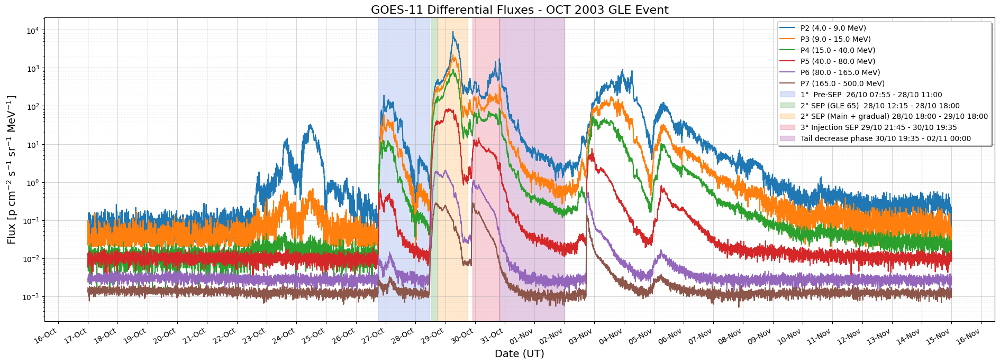

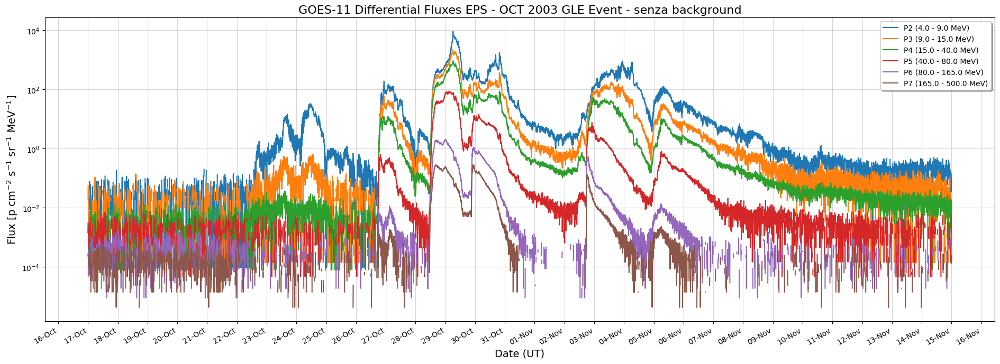

In [1]:
import pandas as pd
import matplotlib.pyplot as plt
import matplotlib.dates as mdates
import numpy as np

# ==========================================
# 1. CARICAMENTO DATI
# ==========================================

file_path = "SEPEM_RDS_v3/SEPEM_RDS_v3-0/RDS3.0_H_EPS_GOES11.txt"

# Leggiamo il file. 
# skipinitialspace=True è il TRUCCO FONDAMENTALE:
# Dice a Pandas di ignorare lo spazio dopo la virgola (", P2" diventa "P2")
df = pd.read_csv(file_path, 
                 sep=',',                # Il file usa le virgole
                 skipinitialspace=True,  # Rimuove spazi extra nell'header (FIX KEYERROR)
                 index_col='epoch',      # La colonna 'epoch' è l'indice
                 parse_dates=['epoch'])  # Converte 'epoch' in date

df.columns = df.columns.str.strip()  # Rimuove spazi bianchi dai nomi delle colonne

print("Colonne trovate:", df.columns.tolist()) # Verifica: Ora dovresti vedere ['P2', 'P3'...] puliti

# ==========================================
# 2. SELEZIONE EVENTO OCT
# ==========================================

t_start = '2003-10-17 00:00:00'
t_end   = '2003-11-15 00:00:00'

# Tagliamo il dataframe sull'evento
df_event = df.loc[t_start:t_end]

#background removal 
bg_start = '2003-10-20 00:00:00'
bg_end   = '2003-10-22 00:00:00'
bg_flux = df.loc[bg_start:bg_end].mean()
df_corrected = (df_event - bg_flux)
df_corrected[df_corrected < 0] = np.nan 





# ==========================================
# 3. PLOT FLUSSI DIFFERENZIALI
# ==========================================

# Mappa energie per la legenda (da documentazione SEPEM GOES-11)
energy_labels = {
    'P2': '4.0 - 9.0 MeV',
    'P3': '9.0 - 15.0 MeV',
    'P4': '15.0 - 40.0 MeV',
    'P5': '40.0 - 80.0 MeV',
    'P6': '80.0 - 165.0 MeV',
    'P7': '165.0 - 500.0 MeV'
}




events_dict_for_visualization = {
    "1°  Pre-SEP  26/10 07:55 - 28/10 11:00": {
        "start": "2003-10-26 18:00", "end": "2003-10-28 11:00", "color": "royalblue"
    },
    "2° SEP (GLE 65)  28/10 12:15 - 28/10 18:00": {
        "start": "2003-10-28 12:15", "end": "2003-10-28 18:00", "color": "forestgreen"
    },
    "2° SEP (Main + gradual) 28/10 18:00 - 29/10 18:00":{
        "start": "2003-10-28 18:00", "end": "2003-10-29 18:00", "color": "darkorange"
    },
    "3° Injection SEP 29/10 21:45 - 30/10 19:35":{
        "start": "2003-10-29 21:45", "end": "2003-10-30 19:35", "color": "crimson"
    },
    "Tail decrease phase 30/10 19:35 - 02/11 00:00":{
        "start": "2003-10-30 19:35", "end": "2003-11-02 00:00", "color": "purple"
    }
}



plt.figure(figsize=(19, 7))

# Plot di ogni canale presente
for col in ['P2', 'P3', 'P4', 'P5', 'P6', 'P7']:
    if col in df_event.columns:
        plt.plot(df_event.index, df_event[col], label=f"{col} ({energy_labels[col]})", linewidth=1.5)


#events shading from events_dict_for_visualization
# Shade events
for event_name, event_info in events_dict_for_visualization.items():
    plt.axvspan(pd.to_datetime(event_info["start"]), 
                pd.to_datetime(event_info["end"]), 
                color=event_info["color"], alpha=0.2, label=event_name)





# Styling
plt.yscale('log')
plt.title('GOES-11 Differential Fluxes - OCT 2003 GLE Event', fontsize=16)
plt.ylabel(r'Flux [p cm$^{-2}$ s$^{-1}$ sr$^{-1}$ MeV$^{-1}$]', fontsize=14)
plt.xlabel('Date (UT)', fontsize=14)
plt.grid(True, which="major", alpha=0.5)
plt.grid(True, which="minor", alpha=0.2, linestyle=':')
plt.legend(loc='upper right', shadow=True, fontsize=10)


# Formattazione date asse X
plt.gca().xaxis.set_major_formatter(mdates.DateFormatter('%d-%b'))
plt.gcf().autofmt_xdate()
ax = plt.gca()
ax.xaxis.set_major_locator(mdates.DayLocator(interval=1))

plt.tight_layout()
plt.show()



plt.figure(figsize=(19, 7))

# Plot di ogni canale presente
for col in ['P2', 'P3', 'P4', 'P5', 'P6', 'P7']:
    if col in df_corrected.columns:
        plt.plot(df_corrected.index, df_corrected[col], label=f"{col} ({energy_labels[col]})", linewidth=1.5)

# Styling
plt.yscale('log')
plt.title('GOES-11 Differential Fluxes EPS - OCT 2003 GLE Event - senza background', fontsize=16)
plt.ylabel(r'Flux [p cm$^{-2}$ s$^{-1}$ sr$^{-1}$ MeV$^{-1}$]', fontsize=14)
plt.xlabel('Date (UT)', fontsize=14)
plt.grid(True, which="major", alpha=0.5)
plt.grid(True, which="minor", alpha=0.2, linestyle=':')
plt.legend(loc='upper right', shadow=True, fontsize=10)


# Formattazione date asse X
plt.gca().xaxis.set_major_formatter(mdates.DateFormatter('%d-%b'))
#plotting every day label 
plt.gcf().autofmt_xdate()

# Ticks giornalieri ben leggibili + minor ogni 6 ore
ax = plt.gca()
ax.xaxis.set_major_locator(mdates.DayLocator(interval=1))
plt.tight_layout()
plt.show()



#random test SEP 

Canali caricati: ['P2', 'P3', 'P4', 'P5', 'P6', 'P7', 'P8', 'P9', 'P10']


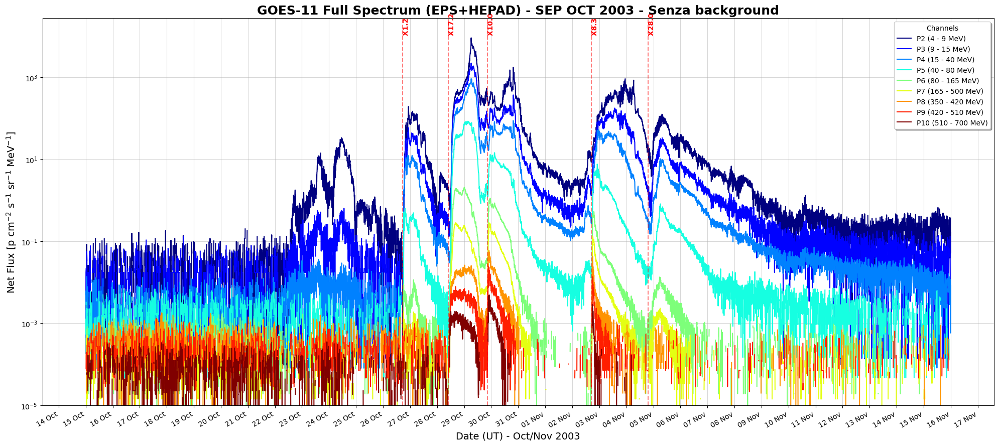

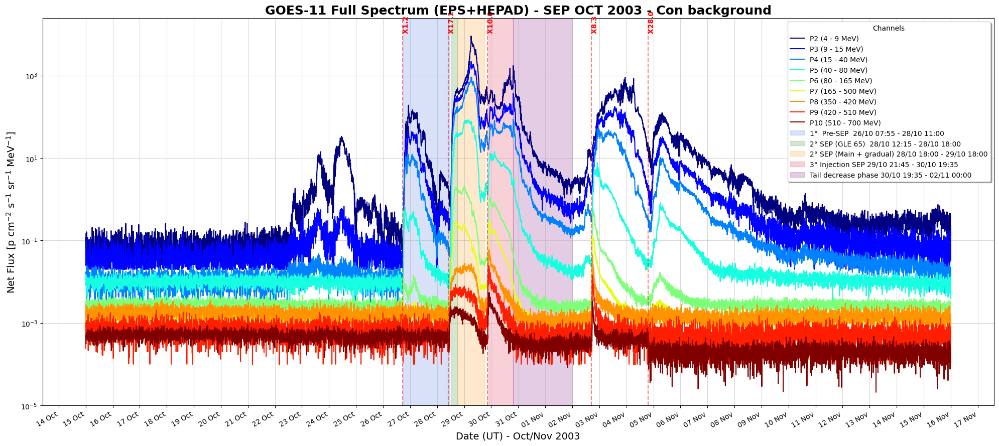

In [2]:
# caricamento file HEPAD GOES-11 OCT 2003 
# Percorsi file (GOES-11 copre il 2003)
file_eps   = "SEPEM_RDS_v3/SEPEM_RDS_v3-0/RDS3.0_H_EPS_GOES11.txt"
file_hepad = "SEPEM_RDS_v3/SEPEM_RDS_v3-0/RDS3.0_H_HEPAD_GOES11.txt"

# Funzione helper per caricare e pulire
def load_clean_sepem(path):
    df = pd.read_csv(path, sep=',', skipinitialspace=True, index_col='epoch', parse_dates=['epoch'])
    df.columns = df.columns.str.strip() # Rimuove spazi extra (FIX P7/P10)
    return df

df_eps_raw = load_clean_sepem(file_eps)
df_hepad_raw = load_clean_sepem(file_hepad)

# Unione dei due dataset
df_total = pd.concat([df_eps_raw, df_hepad_raw], axis=1).sort_index()

print("Canali caricati:", df_total.columns.tolist()) 
# Dovresti vedere: P2...P7, P8, P9, P10

# ==========================================
# 2. SELEZIONE EVENTO & BACKGROUND REMOVAL
# ==========================================

# Finestra temporale Evento (Halloween Storms)
t_start = '2003-10-15 00:00:00'
t_end   = '2003-11-16 00:00:00'

# Finestra temporale Background (Quiete prima della tempesta)
bg_start = '2003-10-20 00:00:00'
bg_end   = '2003-10-22 00:00:00'

# Taglio dati
df_event = df_total.loc[t_start:t_end].copy()

# Calcolo Background medio
bg_levels = df_total.loc[bg_start:bg_end].mean()

# Sottrazione
df_corrected_GOES = (df_event - bg_levels)


# Pulizia per il plot (NaN sui negativi)
df_plot_GOES = df_corrected_GOES.copy()
df_plot_GOES[df_plot_GOES < 0] = np.nan

# ==========================================
# 3. PLOT FULL SPECTRUM
# ==========================================

energy_labels = {
    'P2': '4 - 9 MeV',
    'P3': '9 - 15 MeV',
    'P4': '15 - 40 MeV',
    'P5': '40 - 80 MeV',
    'P6': '80 - 165 MeV',
    'P7': '165 - 500 MeV',
    'P8': '350 - 420 MeV',   # HEPAD
    'P9': '420 - 510 MeV',
    'P10': '510 - 700 MeV'
}

plt.figure(figsize=(20, 9))

# Usa colormap 'jet' o 'turbo' per distinguere bene 9 linee
colors = plt.cm.jet(np.linspace(0, 1, len(energy_labels)))

for i, col in enumerate(energy_labels.keys()):
    if col in df_plot_GOES.columns:
        plt.plot(df_plot_GOES.index, df_plot_GOES[col], 
                 label=f"{col} ({energy_labels[col]})", 
                 color=colors[i], linewidth=1.5)

# Styling "Worst Case"
plt.yscale('log')
plt.ylim(bottom=1e-5) # Per vedere anche i flussi bassi di HEPAD
plt.title('GOES-11 Full Spectrum (EPS+HEPAD) - SEP OCT 2003 - Senza background', fontsize=18, fontweight='bold')
plt.ylabel(r'Net Flux [p cm$^{-2}$ s$^{-1}$ sr$^{-1}$ MeV$^{-1}$]', fontsize=14)
plt.xlabel('Date (UT) - Oct/Nov 2003', fontsize=14)

plt.grid(True, which="major", alpha=0.5)
plt.grid(True, which="minor", alpha=0.2, linestyle=':')

# Linee verticali per i Flare principali
flare_dates = [
    ('2003-10-26 17:21', 'X1.2'),
    ('2003-10-28 09:51', 'X17.2'),
    ('2003-10-29 20:37', 'X10.0'),
    ('2003-11-02 17:03', 'X8.3'),
    ('2003-11-04 19:29', 'X28.0')
]
for date, label in flare_dates:
    plt.axvline(pd.to_datetime(date), color='red', linestyle='--', alpha=0.5)
    plt.text(pd.to_datetime(date), 1e4, f" {label}", color='red', fontweight='bold', rotation=90)

# Formattazione Asse X
plt.gca().xaxis.set_major_locator(mdates.DayLocator(interval=1))
plt.gca().xaxis.set_major_formatter(mdates.DateFormatter('%d %b'))
plt.gcf().autofmt_xdate()

plt.legend(loc='upper right', shadow=True, title="Channels")
plt.tight_layout()
plt.show()

#Plot con background


plt.figure(figsize=(20, 9))

# Usa colormap 'jet' o 'turbo' per distinguere bene 9 linee
colors = plt.cm.jet(np.linspace(0, 1, len(energy_labels)))

for i, col in enumerate(energy_labels.keys()):
    if col in df_event.columns:
        plt.plot(df_event.index, df_event[col], 
                 label=f"{col} ({energy_labels[col]})", 
                 color=colors[i], linewidth=1.5)

# Styling "Worst Case"
plt.yscale('log')
plt.ylim(bottom=1e-5) # Per vedere anche i flussi bassi di HEPAD
plt.title('GOES-11 Full Spectrum (EPS+HEPAD) - SEP OCT 2003 - Con background', fontsize=18, fontweight='bold')
plt.ylabel(r'Net Flux [p cm$^{-2}$ s$^{-1}$ sr$^{-1}$ MeV$^{-1}$]', fontsize=14)
plt.xlabel('Date (UT) - Oct/Nov 2003', fontsize=14)

plt.grid(True, which="major", alpha=0.5)
plt.grid(True, which="minor", alpha=0.2, linestyle=':')

# Linee verticali per i Flare principali
flare_dates = [
    ('2003-10-26 17:21', 'X1.2'),
    ('2003-10-28 09:51', 'X17.2'),
    ('2003-10-29 20:37', 'X10.0'),
    ('2003-11-02 17:03', 'X8.3'),
    ('2003-11-04 19:29', 'X28.0')
]
for date, label in flare_dates:
    plt.axvline(pd.to_datetime(date), color='red', linestyle='--', alpha=0.5)
    plt.text(pd.to_datetime(date), 1e4, f" {label}", color='red', fontweight='bold', rotation=90)




#events shading from events_dict_for_visualization
# Shade events
for event_name, event_info in events_dict_for_visualization.items():
    plt.axvspan(pd.to_datetime(event_info["start"]), 
                pd.to_datetime(event_info["end"]), 
                color=event_info["color"], alpha=0.2, label=event_name)


# Formattazione Asse X
plt.gca().xaxis.set_major_locator(mdates.DayLocator(interval=1))
plt.gca().xaxis.set_major_formatter(mdates.DateFormatter('%d %b'))
plt.gcf().autofmt_xdate()

plt.legend(loc='upper right', shadow=True, title="Channels")
plt.tight_layout()
plt.show()

In [3]:
# Calcolo Fluenza GOES (EPS+HEPAD) OCT 2003

from scipy.optimize import curve_fit

# ==========================================
# 1. SETUP: CANALI & EVENTI
# ==========================================

# Bordi dei canali (Min, Max) [MeV]
channel_bins = {
    'P2': (4.0, 9.0),   'P3': (9.0, 15.0),  'P4': (15.0, 40.0),
    'P5': (40.0, 80.0), 'P6': (80.0, 165.0), 'P7': (165.0, 500.0),
    'P8': (350.0, 420.0), 'P9': (420.0, 510.0), 'P10': (510.0, 700.0)
}

# Energie Efficaci (SEPEM Calib) [MeV]
e_eff_map = {
    'P2': 6.643, 'P3': 12.61, 'P4': 20.55, 
    'P5': 46.62, 'P6': 103.7, 'P7': 154.6,
    'P8': 406.0, 'P9': 457.0, 'P10': 583.0
}

e_eff_map.update({
    'P8': np.sqrt(350*420),
    'P9': np.sqrt(420*510),
    'P10': np.sqrt(510*700)
})

events_dict = {

    "1. Precursore (26–28 Oct)": {
        "start": "2003-10-26 18:00:00",
        "end":   "2003-10-28 10:30:00",
        "color": "orange"
    },

    "2. GLE65 Main (28–30 Oct)": {
        "start": "2003-10-28 10:30:00",
        "end":   "2003-10-30 12:00:00",
        "color": "red"
    },

    "3. Second Injection Tail (30 Oct – 02 Nov)": {
        "start": "2003-10-30 12:00:00",
        "end":   "2003-11-02 00:00:00",
        "color": "purple"
    }
}






# Calcolo Fluenza 

# ==========================================
# 2. CALCOLO DELLA FLUENZA (INTEGRAZIONE)
# ==========================================
results_GOES = {}

print("--- Calcolo Fluenze Integrate ---")

for name, params in events_dict.items():
    # A. Slice Temporale
    # Assumo che df_total sia il dataframe completo (EPS+HEPAD) già background-subtracted
    df_slice = df_corrected_GOES.loc[params['start']:params['end']]
    
    # B. Calcolo Passo Temporale (dt in secondi)
    # Fondamentale per l'integrale: Fluenza = Sum(Flux * dt)
    # Usiamo la media delle differenze temporali per robustezza
    dt_seconds = df_slice.index.to_series().diff().dt.total_seconds().fillna(300)
    
    fluences = []
    energies = []
    x_err_low = []
    x_err_high = []
    
    for col, (E_min, E_max) in channel_bins.items():
        if col in df_slice.columns:
            # 1. Pulizia: NaN -> 0, Negativi -> 0 (per l'integrazione)
            flux_clean = df_slice[col].fillna(0).clip(lower=0)
            
            
            # 2. Somma di Riemann (Integrale)
            fluence_val = (flux_clean * dt_seconds).sum()
            

           
            
            # Salviamo solo se il segnale è significativo (>0)
            if fluence_val > 0:
                fluences.append(fluence_val)
                energies.append(e_eff_map[col])
                
                # Calcolo barre orizzontali asimmetriche
                x_err_low.append(e_eff_map[col] - E_min)
                x_err_high.append(E_max - e_eff_map[col])
    
    # Salvataggio dati pronti per il fit
    results_GOES[name] = {
        'x': np.array(energies),
        'y': np.array(fluences),
        'x_err': [np.array(x_err_low), np.array(x_err_high)],
        'color': params['color']
    }
    print(f"{name}: {len(fluences)} punti validi estratti.")





--- Calcolo Fluenze Integrate ---
1. Precursore (26–28 Oct): 9 punti validi estratti.
2. GLE65 Main (28–30 Oct): 9 punti validi estratti.
3. Second Injection Tail (30 Oct – 02 Nov): 9 punti validi estratti.


Header trovato: ['year', 'day', 'hr', 'min', 'sec', 'W3', 'W4', 'W5', 'W6', 'W7', 'W8', 'unc_W3', 'unc_W4', 'unc_W5', 'unc_W6', 'unc_W7', 'unc_W8', 'P1p', 'P2p', 'P3p', 'P4p', 'P5p', 'P6p', 'P7p', 'P8p', 'unc_P1p', 'unc_P2p', 'unc_P3p', 'unc_P4p', 'unc_P5p', 'unc_P6p', 'unc_P7p', 'unc_P8p']
Dati iniziano alla riga: 68
Dati ACE caricati!


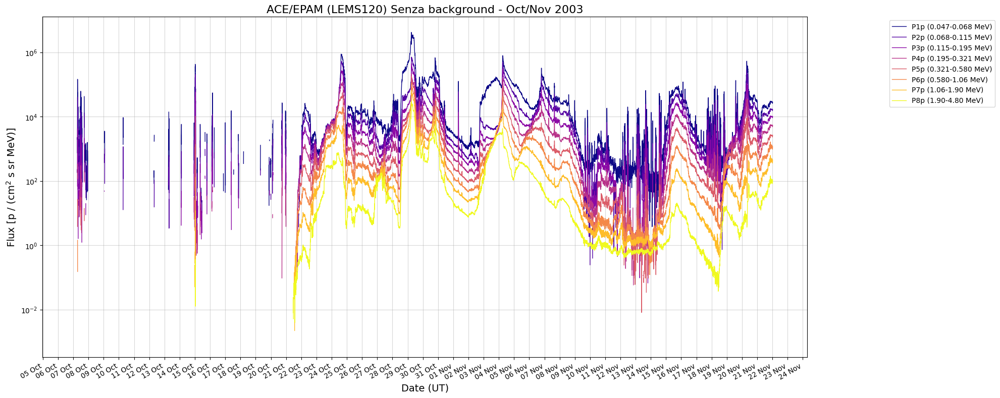

In [7]:

# ==========================================
# 1. FUNZIONE CARICAMENTO DATI ACE (Corretta)
# ==========================================

def load_ace_epam_fixed(file_path):
    # 1. Scansione preliminare per trovare header e inizio dati
    header_cols = []
    start_row = 0
    
    with open(file_path, 'r') as f:
        lines = f.readlines()
        
    for i, line in enumerate(lines):
        # Troviamo la riga che contiene i nomi delle colonne
        if line.strip().startswith("year") and "P1p" in line:
            header_cols = line.strip().split() # Divide per spazi
        
        # Troviamo dove iniziano i dati
        if "BEGIN DATA" in line:
            start_row = i + 1 # I dati iniziano alla riga successiva
            break
    
    if not header_cols:
        print("Errore: Non ho trovato la riga dell'header (year day hr...)")
        return None

    print(f"Header trovato: {header_cols}")
    print(f"Dati iniziano alla riga: {start_row}")

    # 2. Caricamento con Pandas usando i nomi trovati
    try:
        df = pd.read_csv(
            file_path, 
            sep=r'\s+',           # Separatore spazi multipli (Fix Warning)
            names=header_cols,   # Assegniamo i nomi manualmente
            skiprows=start_row,  # Saltiamo tutto fino ai dati veri
            index_col=False      # Non usare la prima colonna come indice subito
        )
    except Exception as e:
        print(f"Errore lettura CSV: {e}")
        return None

    # 3. Creazione della colonna Data (Epoch)
    # ACE usa Anno e Giorno dell'Anno (DOY). Convertiamo in datetime.
    # Creiamo una stringa: "2005 1 12 30 00" (Anno Giorno Ora Min Sec)
    try:
        # Convertiamo tutto in stringa e concateniamo con spazi
        time_str = df['year'].astype(str) + ' ' + \
                   df['day'].astype(str) + ' ' + \
                   df['hr'].astype(str) + ' ' + \
                   df['min'].astype(str) + ' ' + \
                   df['sec'].astype(int).astype(str)
        
        # Parsiamo la data. %j è il codice per "Day of Year"
        df['epoch'] = pd.to_datetime(time_str, format='%Y %j %H %M %S')
        
        # Impostiamo come indice
        df.set_index('epoch', inplace=True)
        
        # Pulizia valori negativi (errori strumento)
        cols_to_clean = [c for c in df.columns if 'P' in c or 'E' in c]
        df[cols_to_clean] = df[cols_to_clean].map(lambda x: np.nan if x < 0 else x)
        
        return df
        
    except Exception as e:
        print(f"Errore conversione date: {e}")
        return None

# ==========================================
# 2. ESECUZIONE
# ==========================================

file_path_ace = "OCT 2003 file/ACE_EPAM_Data_Oct_2003.txt"  # Assicurati che il nome file sia giusto
df_ace = load_ace_epam_fixed(file_path_ace)

if df_ace is not None:
    print("Dati ACE caricati!")
    
    # --- PLOT LEMS120 (Canali P') ---
    ace_labels = {
        'P1p': '0.047-0.068 MeV',
        'P2p': '0.068-0.115 MeV',
        'P3p': '0.115-0.195 MeV',
        'P4p': '0.195-0.321 MeV',
        'P5p': '0.321-0.580 MeV',
        'P6p': '0.580-1.06 MeV',
        'P7p': '1.06-1.90 MeV',
        'P8p': '1.90-4.80 MeV'
    }
    
    ace_lems120_mean_energies = {
        'P1p': 0.056,
        'P2p': 0.088,
        'P3p': 0.150,
        'P4p': 0.250,
        'P5p': 0.424,
        'P6p': 0.789,
        'P7p': 1.419,
        'P8p': 3.020
    }


    t_start = '2003-10-10 00:00'
    t_end   = '2003-11-26 00:00'
    
    df_plot = df_ace.loc[t_start:t_end]

    # rimozione background per ACE LEMS120 


    bg_start = '2003-10-20 00:00'
    bg_end   = '2003-10-22 00:00'

    ace_bg_mean = df_ace.loc[bg_start:bg_end].mean()
    df_ace_corr = df_ace - ace_bg_mean
    df_ace_corr[df_ace_corr <= 0] = np.nan


    
    plt.figure(figsize=(20, 8))
    colors = plt.cm.plasma(np.linspace(0, 1, len(ace_labels)))
    
    for i, (col, label) in enumerate(ace_labels.items()):
        if col in df_ace_corr.columns:
            plt.plot(df_ace_corr.index, df_ace_corr[col], label=f"{col} ({label})", 
                     color=colors[i], linewidth=1)
            
    plt.yscale('log')
    plt.ylabel(r'Flux [p / (cm$^2$ s sr MeV)]', fontsize=14)
    plt.title('ACE/EPAM (LEMS120) Senza background - Oct/Nov 2003', fontsize=16)
    plt.xlabel('Date (UT)', fontsize=14)
    plt.grid(True, which="major", alpha=0.5)
    plt.legend(loc='upper right', bbox_to_anchor=(1.25, 1))
    
    plt.gca().xaxis.set_major_formatter(mdates.DateFormatter('%d-%b'))
    # Formattazione Asse X
    plt.gca().xaxis.set_major_locator(mdates.DayLocator(interval=1))
    plt.gca().xaxis.set_major_formatter(mdates.DateFormatter('%d %b'))
    plt.gcf().autofmt_xdate()
    plt.tight_layout()
    plt.show()


    #Plot CA (Canali W) 

    ace_labels_ca = {
        "W3": "He (389-1278 keV/nucleon)",
        "W4": "He (1278-6984 keV/nucleon)",
        "W5": "O (546-1831 keV/nucleon)",
        "W6": "O (1831-19107 keV/nucleon)",
        "W7": "Fe (298-955 keV/nucleon)",
        "W8": "Fe (955-92663 keV/nucleon)"
    }

    ace_ca_label_uncertainty = {
        "unc_W3",
        "unc_W4",
        "unc_W5",
        "unc_W6",
        "unc_W7",
        "unc_W8"
    }
   

In [8]:
import numpy as np
import pandas as pd
from scipy.optimize import curve_fit

# ==========================================
# 1. SETUP: CANALI ACE (LEMS120) & EVENTI
# ==========================================

# 1.1 Definizione Canali (Abbiamo riattivato P1p per stabilità del fit)
# Il range totale coperto è ora 0.047 - 4.800 MeV
ace_bins = {
    'P1p': (0.047, 0.068), 
    'P2p': (0.068, 0.115), 
    'P3p': (0.115, 0.195),
    'P4p': (0.195, 0.321), 
    'P5p': (0.321, 0.580), 
    'P6p': (0.580, 1.060),
    'P7p': (1.060, 1.900), 
    'P8p': (1.900, 4.800)
}

# 1.2 Energie Efficaci [MeV]
# L'inserimento di P1p ancora lo spettro a ~47 keV
ace_eff_map = {
    'P1p': 0.057,
    'P2p': 0.088,
    'P3p': 0.150,
    'P4p': 0.250,
    'P5p': 0.432,
    'P6p': 0.784,
    'P7p': 1.419,
    'P8p': 3.020
}

# 1.3 Definizione Temporale Eventi (Halloween Storms)
events_dict = {
    "1. Precursore (26–28 Oct)": {
        "start": "2003-10-26 18:00:00",
        "end":   "2003-10-28 10:30:00",
        "color": "orange"
    },
    "2. GLE65 Main (28–30 Oct)": {
        "start": "2003-10-28 10:30:00",
        "end":   "2003-10-30 12:00:00",
        "color": "red"
    },
    "3. Second Injection Tail (30 Oct – 02 Nov)": {
        "start": "2003-10-30 12:00:00",
        "end":   "2003-11-02 00:00:00",
        "color": "purple"
    }
}

# ==========================================
# 2. CALCOLO DELLA FLUENZA INTEGRATA
# ==========================================
results_ACE = {}

print("--- Calcolo Fluenze Integrate ACE (EPAM) ---")

for name, params in events_dict.items():
    # A. Selezione temporale (Slice)
    # Assumiamo df_ace_corr già caricato e background-subtracted
    df_slice = df_ace_corr.loc[params['start']:params['end']]
    
    # B. Calcolo del passo temporale reale (dt in secondi)
    # Fondamentale per la precisione dell'integrale
    dt_series = df_slice.index.to_series().diff().dt.total_seconds()
    dt_seconds = dt_series.fillna(300) # Fallback a 5 min nominali
    
    fluences = []
    energies = []
    y_err = []
    x_err_low = []
    x_err_high = []
    
    for col, (E_min, E_max) in ace_bins.items():
        if col in df_slice.columns:
            # 1. Pulizia dati: i valori negativi sono rumore post-sottrazione
            flux_clean = df_slice[col].fillna(0).clip(lower=0)
            
            # 2. Somma di Riemann: Fluenza = Sum(Flusso * dt)
            # Unità: p * cm^-2 * sr^-1 * MeV^-1
            fluence_val = (flux_clean * dt_seconds).sum()
            
            if fluence_val > 0:
                fluences.append(fluence_val)
                energies.append(ace_eff_map[col])
                
                # 3. Incertezza sistematica conservativa 30%
                y_err.append(fluence_val * 0.30)
                
                # 4. Incertezza orizzontale (larghezza canale)
                x_err_low.append(ace_eff_map[col] - E_min)
                x_err_high.append(E_max - ace_eff_map[col])
    
    # Salvataggio dati per il Fit Combinato
    results_ACE[name] = {
        'x': np.array(energies),
        'y': np.array(fluences),
        'y_err': np.array(y_err),
        'x_err': [np.array(x_err_low), np.array(x_err_high)],
        'color': params['color']
    }
    print(f"{name}: {len(fluences)} canali ACE estratti.")

--- Calcolo Fluenze Integrate ACE (EPAM) ---
1. Precursore (26–28 Oct): 8 canali ACE estratti.
2. GLE65 Main (28–30 Oct): 8 canali ACE estratti.
3. Second Injection Tail (30 Oct – 02 Nov): 8 canali ACE estratti.


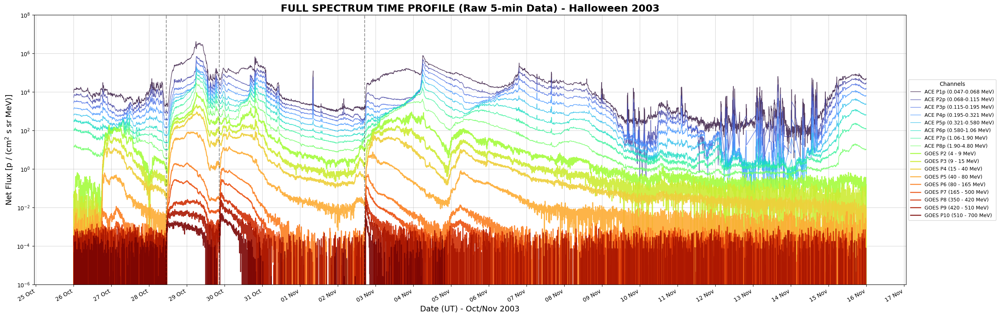

In [9]:
import matplotlib.pyplot as plt
import matplotlib.dates as mdates
import numpy as np

# ==========================================
# PLOT COMBINATO DIRETTO (NO RESAMPLING)
# ==========================================

channel_bins = {
    'P2': (4.2, 8.7),
    'P3': (8.7, 14.5),
    'P4': (15.0, 40.0),
    'P5': (38.0, 82.0),
    'P6': (84.0, 200.0),
    'P7': (110.0, 900.0)  # ultimo canale affidabile EPS
}


energy_labels_GOES = {

    'P2': '4 - 9 MeV',

    'P3': '9 - 15 MeV',

    'P4': '15 - 40 MeV',

    'P5': '40 - 80 MeV',

    'P6': '80 - 165 MeV',

    'P7': '165 - 500 MeV',

    'P8': '350 - 420 MeV',   # HEPAD

    'P9': '420 - 510 MeV',

    'P10': '510 - 700 MeV'

}



energy_labels_ACE = {

    'P1p': '0.047-0.068 MeV',

    'P2p': '0.068-0.115 MeV',

    'P3p': '0.115-0.195 MeV',

    'P4p': '0.195-0.321 MeV',

    'P5p': '0.321-0.580 MeV',

    'P6p': '0.580-1.06 MeV',

    'P7p': '1.06-1.90 MeV',

    'P8p': '1.90-4.80 MeV'

}

# 1. Finestra Temporale Zoom
t_plot_start = '2003-10-26 00:00'
t_plot_end   = '2003-11-16 00:00'

# Tagliamo i dataset separatamente (mantenendo i loro indici originali)
# .dropna() rimuove i buchi vuoti del background per unire le linee
ace_view = df_ace_corr.loc[t_plot_start:t_plot_end]
goes_view = df_corrected_GOES.loc[t_plot_start:t_plot_end]

# 2. Gestione Colori Unificata (17 Canali)
# Creiamo una scala di colori unica per tutto lo spettro (ACE -> GOES)
ace_cols = list(energy_labels_ACE.keys())
goes_cols = list(energy_labels_GOES.keys())
total_channels = len(ace_cols) + len(goes_cols)
colors = plt.cm.turbo(np.linspace(0, 1, total_channels))

plt.figure(figsize=(25, 8))

# --- LAYER 1: ACE (Basse Energie) ---
# Usiamo i primi colori della mappa (Viola/Blu)
for i, col in enumerate(ace_cols):
    if col in ace_view.columns:
        # Plot solo dei punti validi
        data = ace_view[col].dropna()
        plt.plot(data.index, data, 
                 label=f"ACE {col} ({energy_labels_ACE[col]})",
                 color=colors[i], 
                 linewidth=1.0, alpha=0.8)

# --- LAYER 2: GOES (Alte Energie) ---
# Usiamo i colori restanti (Verde/Giallo/Rosso)
offset = len(ace_cols)
for i, col in enumerate(goes_cols):
    if col in goes_view.columns:
        data = goes_view[col].dropna()
        plt.plot(data.index, data, 
                 label=f"GOES {col} ({energy_labels_GOES[col]})",
                 color=colors[offset + i], 
                 linewidth=1.8, alpha=0.9)

# --- Styling ---
plt.yscale('log')
plt.ylim(bottom=1e-6, top=1e8) 
plt.ylabel(r'Net Flux [p / (cm$^2$ s sr MeV)]', fontsize=14)
plt.xlabel('Date (UT) - Oct/Nov 2003', fontsize=14)
plt.title('FULL SPECTRUM TIME PROFILE (Raw 5-min Data) - Halloween 2003', fontsize=18, fontweight='bold')

plt.grid(True, which="major", alpha=0.5)
plt.grid(True, which="minor", alpha=0.15, linestyle=':')

# Flare Markers
flare_dates = ['2003-10-28 11:00', '2003-10-29 20:40', '2003-11-02 17:03']
for date in flare_dates:
    plt.axvline(pd.to_datetime(date), color='black', linestyle='--', alpha=0.4)

# Formattazione Asse X
plt.gca().xaxis.set_major_locator(mdates.DayLocator(interval=1))
plt.gca().xaxis.set_major_formatter(mdates.DateFormatter('%d %b'))
plt.gcf().autofmt_xdate()

# Legenda Compatta a destra
plt.legend(loc='center left', bbox_to_anchor=(1, 0.5), fontsize=9, title="Channels")

plt.tight_layout()
plt.show()

In [10]:
# ============================================================
# FLUENZA COMBINATA GOES + ACE (OCT 2003) - CON FILTRO OVERLAP
# ============================================================

results_combined = {}

print("--- Calcolo Fluenze Integrate COMBINATE (Filtro ACE < 4 MeV) ---")

for name in events_dict.keys():
    # 1. Recupero dati ACE
    if name in results_ACE:
        ace_data = results_ACE[name]
        x_ace_raw = ace_data['x']
        y_ace_raw = ace_data['y']
        xl_ace_raw = ace_data['x_err'][0]
        xh_ace_raw = ace_data['x_err'][1]
        
        # Maschera per evitare sovrapposizioni con GOES: teniamo ACE solo sotto i 4 MeV
        mask_ace = x_ace_raw < 4.0
        x_ace = x_ace_raw[mask_ace]
        y_ace = y_ace_raw[mask_ace]
        xl_ace = xl_ace_raw[mask_ace]
        xh_ace = xh_ace_raw[mask_ace]
    else:
        x_ace, y_ace, xl_ace, xh_ace = np.array([]), np.array([]), np.array([]), np.array([])

    # 2. Recupero dati GOES (P2 parte da ~4.2 MeV, quindi non serve maschera qui)
    if name in results_GOES:
        goes_data = results_GOES[name]
        x_goes = goes_data['x']
        y_goes = goes_data['y']
        xl_goes = goes_data['x_err'][0]
        xh_goes = goes_data['x_err'][1]
    else:
        x_goes, y_goes, xl_goes, xh_goes = np.array([]), np.array([]), np.array([]), np.array([])

    # 3. Concatenazione dei set filtrati
    all_x = np.concatenate([x_ace, x_goes])
    all_y = np.concatenate([y_ace, y_goes])
    all_xl = np.concatenate([xl_ace, xl_goes])
    all_xh = np.concatenate([xh_ace, xh_goes])

    # 4. Ordinamento per energia (Fondamentale per il Fit)
    sort_idx = np.argsort(all_x)
    
    # 5. Calcolo Incertezza Sistematica (30%) come per Jan 2005
    y_err_combined = all_y[sort_idx] * 0.30

    color = events_dict[name]['color']

    results_combined[name] = {
        'x': all_x[sort_idx],
        'y': all_y[sort_idx],
        'y_err': y_err_combined,
        'x_err': [np.abs(all_xl[sort_idx]), np.abs(all_xh[sort_idx])],
        'color': color
    }
    
    print(f"{name}: {len(x_ace)} pt ACE (<4MeV) + {len(x_goes)} pt GOES = {len(all_x)} Totali")

print("\nFatto! 'results_combined' è pulito e pronto per il FIT.")

--- Calcolo Fluenze Integrate COMBINATE (Filtro ACE < 4 MeV) ---
1. Precursore (26–28 Oct): 8 pt ACE (<4MeV) + 9 pt GOES = 17 Totali
2. GLE65 Main (28–30 Oct): 8 pt ACE (<4MeV) + 9 pt GOES = 17 Totali
3. Second Injection Tail (30 Oct – 02 Nov): 8 pt ACE (<4MeV) + 9 pt GOES = 17 Totali

Fatto! 'results_combined' è pulito e pronto per il FIT.


In [16]:
# ============================================================
# FLUENZA COMBINATA GOES + ACE (OCT 2003) 
# Con filtro overlap e incertezza (20% Sys + Statistica)
# ============================================================

results_combined = {}

print("--- Calcolo Fluenze Integrate COMBINATE ---")
print("Logica: ACE per E < 4 MeV, GOES per E >= 4 MeV")
print("Incertezza: sqrt((20% Sys)^2 + (Stat)^2)")

for name in events_dict.keys():
    # 1. Recupero e Filtro dati ACE
    if name in results_ACE:
        ace_data = results_ACE[name]
        x_ace_raw = ace_data['x']
        y_ace_raw = ace_data['y']
        xl_ace_raw = ace_data['x_err'][0]
        xh_ace_raw = ace_data['x_err'][1]
        
        # Se hai calcolato l'errore statistico nell'integrazione, recuperalo, 
        # altrimenti inizializzalo (qui usiamo sqrt(y) come proxy statistico se non presente)
        stat_ace = ace_data.get('y_err_stat', np.sqrt(y_ace_raw))
        
        # Filtro ACE: teniamo solo i canali sotto i 4 MeV per evitare l'overlap con GOES
        mask_ace = x_ace_raw < 4.0
        x_ace = x_ace_raw[mask_ace]
        y_ace = y_ace_raw[mask_ace]
        xl_ace = xl_ace_raw[mask_ace]
        xh_ace = xh_ace_raw[mask_ace]
        stat_ace = stat_ace[mask_ace]
    else:
        x_ace, y_ace, xl_ace, xh_ace, stat_ace = [np.array([]) for _ in range(5)]

    # 2. Recupero dati GOES
    if name in results_GOES:
        goes_data = results_GOES[name]
        x_goes = goes_data['x']
        y_goes = goes_data['y']
        xl_goes = goes_data['x_err'][0]
        xh_goes = goes_data['x_err'][1]
        stat_goes = goes_data.get('y_err_stat', np.sqrt(y_goes))
    else:
        x_goes, y_goes, xl_goes, xh_goes, stat_goes = [np.array([]) for _ in range(5)]

    # 3. Concatenazione dei set di dati
    all_x = np.concatenate([x_ace, x_goes])
    all_y = np.concatenate([y_ace, y_goes])
    all_xl = np.concatenate([xl_ace, xl_goes])
    all_xh = np.concatenate([xh_ace, xh_goes])
    all_stat = np.concatenate([stat_ace, stat_goes])

    # 4. Ordinamento per energia (Fondamentale per il Fit)
    sort_idx = np.argsort(all_x)
    x_sort = all_x[sort_idx]
    y_sort = all_y[sort_idx]
    xl_sort = all_xl[sort_idx]
    xh_sort = all_xh[sort_idx]
    stat_sort = all_stat[sort_idx]

    # 5. Calcolo Errore Totale (Sistematica 20% + Statistica in quadratura)
    # Formula: sigma_tot = sqrt((0.2 * y)^2 + sigma_stat^2)
    sigma_sys = 0.30 * y_sort
    y_err_final = np.sqrt(sigma_sys**2 + stat_sort**2)

    # 6. Salvataggio nel dizionario finale
    color = events_dict[name]['color']
    results_combined[name] = {
        'x': x_sort,
        'y': y_sort,
        'y_err': y_err_final,  # Incertezza totale per il Fit
        'x_err': [np.abs(xl_sort), np.abs(xh_sort)],
        'color': color
    }
    
    print(f"{name}: {len(x_ace)} pt ACE + {len(x_goes)} pt GOES = {len(all_x)} Punti Totali")

print("\nSuccesso! 'results_combined' pronto per il fitting dei 3 modelli.")

--- Calcolo Fluenze Integrate COMBINATE ---
Logica: ACE per E < 4 MeV, GOES per E >= 4 MeV
Incertezza: sqrt((20% Sys)^2 + (Stat)^2)
1. Precursore (26–28 Oct): 8 pt ACE + 9 pt GOES = 17 Punti Totali
2. GLE65 Main (28–30 Oct): 8 pt ACE + 9 pt GOES = 17 Punti Totali
3. Second Injection Tail (30 Oct – 02 Nov): 8 pt ACE + 9 pt GOES = 17 Punti Totali

Successo! 'results_combined' pronto per il fitting dei 3 modelli.


--- ESECUZIONE FIT COMPLETO (Incertezza: Stat + 20% Sys) ---


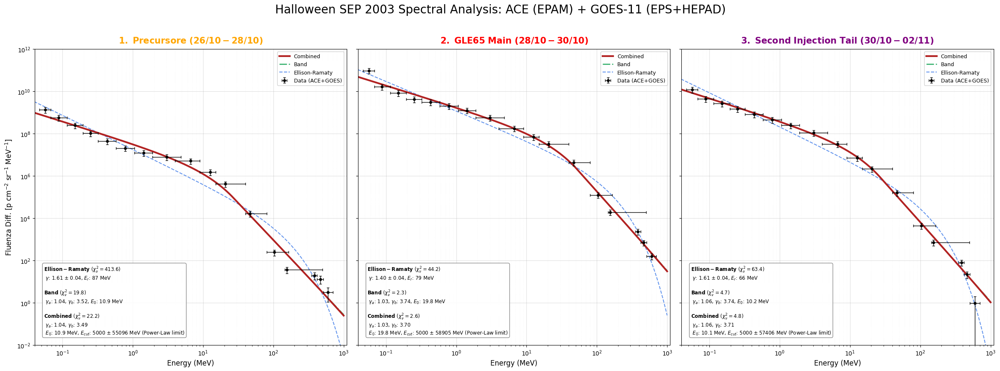

In [20]:
import matplotlib.pyplot as plt
import numpy as np
from scipy.optimize import curve_fit

# ==========================================
# 1. DEFINIZIONE MODELLI SPETTRALI
# ==========================================

def ellison_ramaty(E, A, gamma, Er):
    return A * (E**(-gamma)) * np.exp(-E/Er)

def band_function(E, A, ga, gb, E0):
    if gb <= ga: return np.ones_like(E) * 1e-30
    E_break = (gb - ga) * E0
    if E_break <= 0: return np.ones_like(E) * 1e-30

    res = np.zeros_like(E)
    mask_low = E < E_break
    res[mask_low] = A * (E[mask_low] ** -ga) * np.exp(-E[mask_low] / E0)
    norm_factor = (E_break ** (gb - ga)) * np.exp(ga - gb)
    res[~mask_low] = A * (E[~mask_low] ** -gb) * norm_factor
    return res

def combined_function(E, A, ga, gb, E0, Er):
    return band_function(E, A, ga, gb, E0) * np.exp(-E/Er)

# ==========================================
# 2. HELPER FUNCTIONS (FIT & STATS)
# ==========================================

def fit_log_space(func, x, y, y_err, p0, bounds=(-np.inf, np.inf)):
    def log_func(x_in, *params):
        return np.log10(np.maximum(func(x_in, *params), 1e-30))
    
    # Propagazione errore nel dominio logaritmico
    sigma_log = y_err / (y * np.log(10))
    sigma_log = np.nan_to_num(sigma_log, nan=1.0, posinf=1.0)
    
    try: 
        return curve_fit(log_func, x, np.log10(y), p0=p0, sigma=sigma_log, 
                         absolute_sigma=True, bounds=bounds, maxfev=15000)
    except: return None, None 

def get_stats_text(model_name, func, x, y, y_err, popt, pcov):
    if popt is None: return f"{model_name}: Fit Failed"
    residuals = (y - func(x, *popt)) / y_err
    chi_sq = np.sum(residuals**2)
    dof = len(y) - len(popt)
    chi_red = chi_sq / dof if dof > 0 else 0.0
    perr = np.sqrt(np.diag(pcov))
    
    txt = rf"$\bf{{{model_name}}}$ ($\chi^2_\nu={chi_red:.1f}$)" + "\n"
    if model_name == "Ellison-Ramaty":
        txt += rf" $\gamma$: {popt[1]:.2f} $\pm$ {perr[1]:.2f}, $E_r$: {popt[2]:.0f} MeV"
    elif model_name == "Band":
        txt += rf" $\gamma_a$: {popt[1]:.2f}, $\gamma_b$: {popt[2]:.2f}, $E_0$: {popt[3]:.1f} MeV"
    elif model_name == "Combined":
        txt += rf" $\gamma_a$: {popt[1]:.2f}, $\gamma_b$: {popt[2]:.2f}" + "\n"
        txt += rf" $E_0$: {popt[3]:.1f} MeV, $E_{{cut}}$: {popt[4]:.0f} $\pm$ {perr[4]:.0f} MeV"
        if popt[4] > 1800: txt += " (Power-Law limit)"
    return txt

# ==========================================
# 3. ESECUZIONE FIT E PLOT (3 PANNELLI)
# ==========================================

x_plot = np.logspace(np.log10(0.03), np.log10(1000), 1000)
fig, axes = plt.subplots(1, 3, figsize=(24, 9), sharey=True)
axes = axes.flatten()

color_map = {
    0: {"color": "orange", "title": r"$\bf{1.\ Precursore\ (26/10-28/10)}$"},
    1: {"color": "red",    "title": r"$\bf{2.\ GLE65\ Main\ (28/10-30/10)}$"},
    2: {"color": "purple", "title": r"$\bf{3.\ Second\ Injection\ Tail\ (30/10-02/11)}$"}
}

print("--- ESECUZIONE FIT COMPLETO (Incertezza: Stat + 20% Sys) ---")

for i, (evt_name, data) in enumerate(results_combined.items()):
    ax = axes[i]
    x, y = data['x'], data['y']
    x_errs = [np.abs(data['x_err'][0]), np.abs(data['x_err'][1])]
    
    # Utilizziamo l'errore totale (Statistica + Sistematica 20%) calcolato prima
    y_err = data['y_err'] 
    
    evt_color = color_map[i]["color"]
    evt_title = color_map[i]["title"]

    # --- PLOT DATI SPERIMENTALI ---
    ax.errorbar(x, y, yerr=y_err, xerr=x_errs, fmt='o', color='black', 
                ecolor='black', capsize=2, elinewidth=1, markersize=4, 
                label='Data (ACE+GOES)', zorder=10)
    
    stats_box = ""

    # --- A. FIT ELLISON-RAMATY ---
    p0_er = [1e8, 1.5, 100.0]
    popt_er, pcov_er = fit_log_space(ellison_ramaty, x, y, y_err, p0_er, bounds=([0,0,0], [np.inf,10,10000]))
    if popt_er is not None:
        ax.plot(x_plot, ellison_ramaty(x_plot, *popt_er), '--', color='cornflowerblue', label='Ellison-Ramaty')
        stats_box += get_stats_text("Ellison-Ramaty", ellison_ramaty, x, y, y_err, popt_er, pcov_er) + "\n\n"

    # --- B. FIT BAND FUNCTION ---
    p0_b = [1e7, 1.0, 3.0, 15.0]
    popt_b, pcov_b = fit_log_space(band_function, x, y, y_err, p0_b, bounds=([0,0.1,0.1,0.5], [np.inf,10,10,1000]))
    if popt_b is not None:
        ax.plot(x_plot, band_function(x_plot, *popt_b), '-.', color='mediumseagreen', linewidth=2, label='Band')
        stats_box += get_stats_text("Band", band_function, x, y, y_err, popt_b, pcov_b) + "\n\n"

    # --- C. FIT COMBINED (Inizializzato con i parametri di Band) ---
    if popt_b is not None:
        p0_c = [popt_b[0], popt_b[1], popt_b[2], popt_b[3], 500.0] # Seed da Band Fit
        popt_c, pcov_c = fit_log_space(combined_function, x, y, y_err, p0_c, 
                                        bounds=([0, 0.1, 0.1, 2, 50], [np.inf, 10, 10, 500, 5000]))
        if popt_c is not None:
            ax.plot(x_plot, combined_function(x_plot, *popt_c), '-', color='firebrick', linewidth=3, label='Combined')
            stats_box += get_stats_text("Combined", combined_function, x, y, y_err, popt_c, pcov_c)

    # --- STYLING ---
    ax.set_title(evt_title, fontsize=15, color=evt_color, fontweight='bold', pad=10)
    ax.set_xscale('log'); ax.set_yscale('log')
    ax.set_xlim(0.04, 1100); ax.set_ylim(1e-2, 1e12)
    ax.grid(True, which="major", alpha=0.4); ax.grid(True, which="minor", alpha=0.1, ls=':')
    ax.set_xlabel("Energy (MeV)", fontsize=12)
    if i == 0: ax.set_ylabel(r"Fluenza Diff. [p cm$^{-2}$ sr$^{-1}$ MeV$^{-1}$]", fontsize=12)
    
    # Legenda ordinata
    handles, labels = ax.get_legend_handles_labels()
    order = {'Combined': 0, 'Band': 1, 'Ellison-Ramaty': 2, 'Data (ACE+GOES)': 3}
    sorted_hl = sorted(zip(handles, labels), key=lambda hl: order.get(hl[1], 99))
    ax.legend(*zip(*sorted_hl), loc='upper right', fontsize=9, framealpha=0.9)
    
    ax.text(0.03, 0.03, stats_box, transform=ax.transAxes, fontsize=8.5, verticalalignment='bottom',
            bbox=dict(boxstyle="round", facecolor='white', alpha=0.9, edgecolor='gray'))

plt.suptitle("Halloween SEP 2003 Spectral Analysis: ACE (EPAM) + GOES-11 (EPS+HEPAD)", fontsize=20, y=0.98)
plt.tight_layout(rect=[0, 0.0, 1, 0.96]); 
plt.show()

# FIT FINALE univoco CELLA EXPORT (modello combined)


--- INIZIO ELABORAZIONE FINALE: OTTOBRE 2003 ---


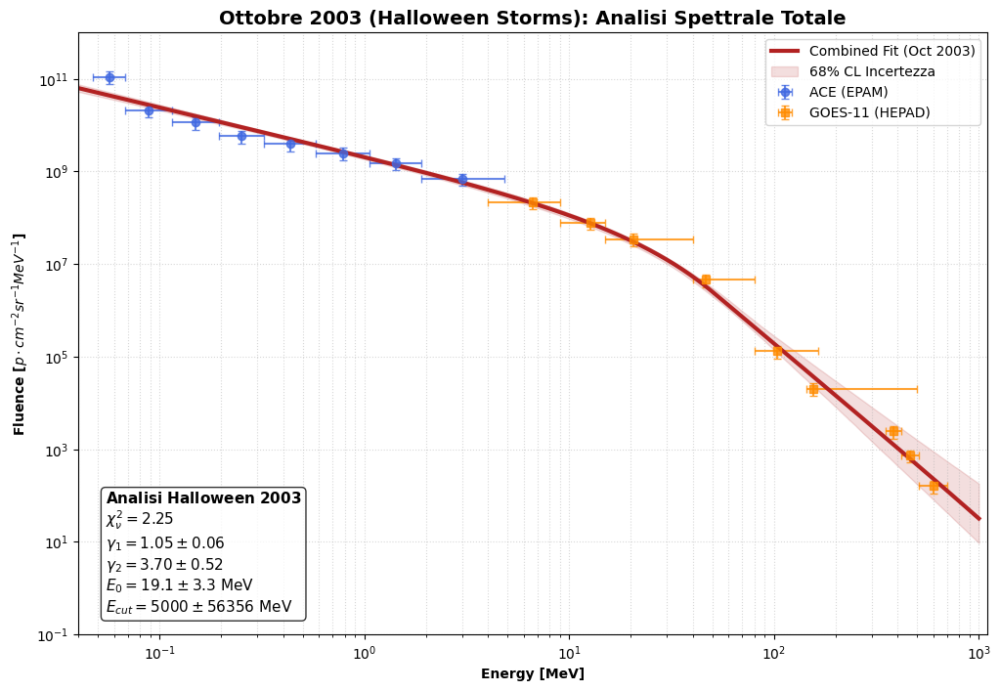

Export completato con successo in: FINAL_OCT2003_SRNIEL_EXPORTooo


In [27]:
import numpy as np
import matplotlib.pyplot as plt
import os

# ============================================================
# ANALISI DEFINITIVA OCT 2003: FIT, MONTE CARLO E EXPORT
# ============================================================

print("\n--- INIZIO ELABORAZIONE FINALE: OTTOBRE 2003 ---")

# 1) ACCUMULO E SOMMA DELLE FLUENZE
# Uniamo i contributi di tutti i segmenti temporali (Precursore, Main, Tail)
ROUND_E = 6
acc = {}
for source, instr_name in [(results_ACE, "ACE (EPAM)"), (results_GOES, "GOES-11 (EPS/HEPAD)")]:
    for evt_name, evt_data in source.items():
        x, y = np.asarray(evt_data["x"]), np.asarray(evt_data["y"])
        xl, xh = np.asarray(evt_data["x_err"][0]), np.asarray(evt_data["x_err"][1])
        for Ei, yi, xli, xhi in zip(x, y, xl, xh):
            key = np.round(Ei, ROUND_E)
            if key not in acc:
                acc[key] = {"E": Ei, "y": yi, "xl": abs(xli), "xh": abs(xhi), "instr": instr_name}
            else:
                acc[key]["y"] += yi

E_tot, Y_tot = np.zeros(len(acc)), np.zeros(len(acc))
XL_tot, XH_tot = np.zeros(len(acc)), np.zeros(len(acc))
instruments = []
for i, key in enumerate(sorted(acc.keys())):
    E_tot[i], Y_tot[i] = acc[key]["E"], acc[key]["y"]
    XL_tot[i], XH_tot[i] = acc[key]["xl"], acc[key]["xh"]
    instruments.append(acc[key]["instr"])

# --- RAFFINAMENTO INCERTEZZA: SISTEMATICA (30%) + STATISTICA (sqrt(N)) ---
# La somma in quadratura permette al fit di avere più "libertà" dove il segnale è basso
Yerr_tot = np.sqrt((0.30 * Y_tot)**2 + Y_tot) 

# 2) FIT COMBINED (Band x Cutoff)
# Inizializziamo con valori tipici per eventi "hard" come Halloween 2003
p0 = [1e9, 1.1, 3.5, 20.0, 500.0]
bounds = ([0, 0.1, 0.5, 1.0, 50.0], [np.inf, 6.0, 10.0, 500.0, 5000.0])
popt, pcov = fit_log_space(combined_function, E_tot, Y_tot, Yerr_tot, p0, bounds)

if popt is None: raise RuntimeError("ERRORE: Fit fallito.")
perr = np.sqrt(np.diag(pcov))

# Statistiche
res = (Y_tot - combined_function(E_tot, *popt)) / Yerr_tot
chi2red = np.sum(res**2) / (len(E_tot) - len(popt))

# 3) MONTE CARLO ROBUSTO (Range Esteso: 0.05 - 1000 MeV)
# Il range parte ora da 0.05 MeV per includere i canali bassi di ACE
E_grid = np.logspace(np.log10(0.05), 3, 500) 
N_MC = 1000
rng = np.random.default_rng(42)

# Protezione numerica per la matrice di covarianza
v, w = np.linalg.eigh(pcov)
pcov_robust = w @ np.diag(np.maximum(v, 1e-10)) @ w.T 

p_samples = rng.multivariate_normal(popt, pcov_robust, size=N_MC)
Phi_MC = np.array([np.where(combined_function(E_grid, *ps) > 0, combined_function(E_grid, *ps), 1e-40) 
                   for ps in p_samples])

Phi_med = np.median(Phi_MC, axis=0)
Phi_lo, Phi_hi = np.percentile(Phi_MC, [16, 84], axis=0)

# 4) PLOT PROFESSIONALE
plt.figure(figsize=(12, 8))
mask_ace = np.array(instruments) == "ACE (EPAM)"
plt.errorbar(E_tot[mask_ace], Y_tot[mask_ace], yerr=Yerr_tot[mask_ace], xerr=[XL_tot[mask_ace], XH_tot[mask_ace]], 
             fmt="o", color="royalblue", capsize=3, label="ACE (EPAM)", alpha=0.8)

mask_goes = np.array(instruments) == "GOES-11 (EPS/HEPAD)"
plt.errorbar(E_tot[mask_goes], Y_tot[mask_goes], yerr=Yerr_tot[mask_goes], xerr=[XL_tot[mask_goes], XH_tot[mask_goes]], 
             fmt="s", color="darkorange", capsize=3, label="GOES-11 (HEPAD)", alpha=0.8)

E_grid_plot = np.logspace(-1.5, 3, 1000)
plt.plot(E_grid_plot, combined_function(E_grid_plot, *popt), color="firebrick", lw=3, label="Combined Fit (Oct 2003)")
plt.fill_between(E_grid_plot, np.percentile(np.array([combined_function(E_grid_plot, *ps) for ps in p_samples]), 16, axis=0), 
                 np.percentile(np.array([combined_function(E_grid_plot, *ps) for ps in p_samples]), 84, axis=0), 
                 color="firebrick", alpha=0.15, label="68% CL Incertezza")

# Box Parametri (LaTeX)
stats_box = (
    r"$\bf{Analisi\ Halloween\ 2003}$" + "\n" +
    r"$\chi^2_\nu = %.2f$" % chi2red + "\n" +
    r"$\gamma_1 = %.2f \pm %.2f$" % (popt[1], perr[1]) + "\n" +
    r"$\gamma_2 = %.2f \pm %.2f$" % (popt[2], perr[2]) + "\n" +
    r"$E_0 = %.1f \pm %.1f$ MeV" % (popt[3], perr[3]) + "\n" +
    r"$E_{cut} = %.0f \pm %.0f$ MeV" % (popt[4], perr[4])
)
plt.gca().text(0.03, 0.03, stats_box, transform=plt.gca().transAxes, fontsize=11, 
                verticalalignment='bottom', bbox=dict(boxstyle='round', facecolor='white', alpha=0.8))

plt.xscale("log"); plt.yscale("log"); plt.xlim(0.04, 1100); plt.ylim(1e-1, 1e12)
plt.xlabel("Energy [MeV]", fontweight='bold'); plt.ylabel(r"Fluence [$p \cdot cm^{-2} sr^{-1} MeV^{-1}$]", fontweight='bold')
plt.title("Ottobre 2003 (Halloween Storms): Analisi Spettrale Totale", fontsize=14, fontweight='bold')
plt.grid(True, which="both", ls=':', alpha=0.5); plt.legend(loc="upper right"); plt.show()

# 5) EXPORT SR-NIEL (Directory: FINAL_OCT2003_SRNIEL_EXPORT)
out_dir = "FINAL_OCT2003_SRNIEL_EXPORTooo"
if not os.path.exists(out_dir): os.makedirs(out_dir)

FACTORS = {"Planare": np.pi, "Sferica": 4*np.pi}
for geo, factor in FACTORS.items():
    np.savetxt(f"{out_dir}/OCT03_{geo}_Median.txt", np.column_stack([E_grid, factor*Phi_med]), fmt="%.6e", 
               header=f"Energy(MeV) {geo}_Fluence(cm^-2*MeV^-1)", comments="")
    np.savetxt(f"{out_dir}/OCT03_{geo}_CL68.txt", np.column_stack([E_grid, factor*Phi_lo, factor*Phi_hi]), fmt="%.6e", 
               header=f"Energy(MeV) Phi_16 Phi_84", comments="")

print(f"Export completato con successo in: {out_dir}")

# CALCOLO DOSE PLANAR SHIELDING 37mm Al 
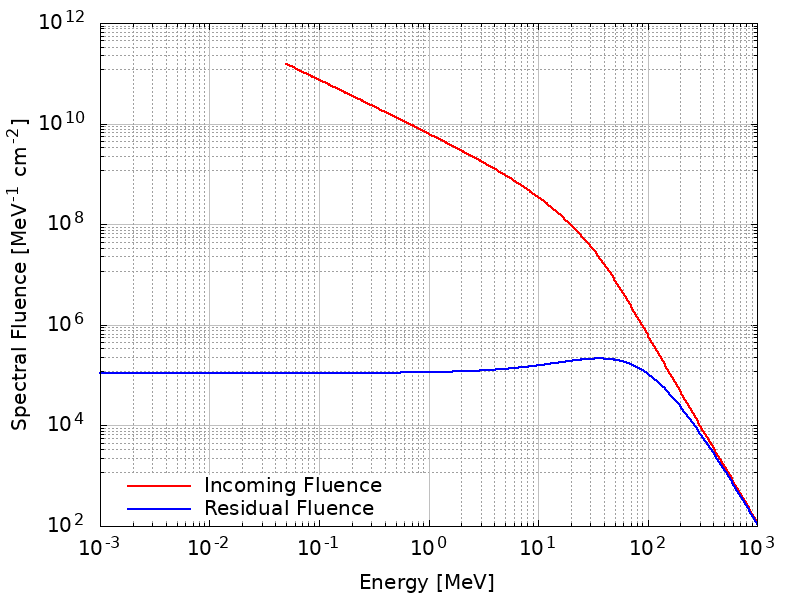

------------------------------------------------------------
ANALISI INCERTEZZA DOSE - OCT 2003
Configurazione: 37mm Al, Geometria Planare
Range integrato: 1.000e-03 MeV - 1000 MeV
Dose Mediana: 53.451 mGy
Intervallo 68% CL (Fit + 5% SRIM): [41.51 - 69.06] mGy
Incertezza: +15.61 / -11.94 mGy
------------------------------------------------------------


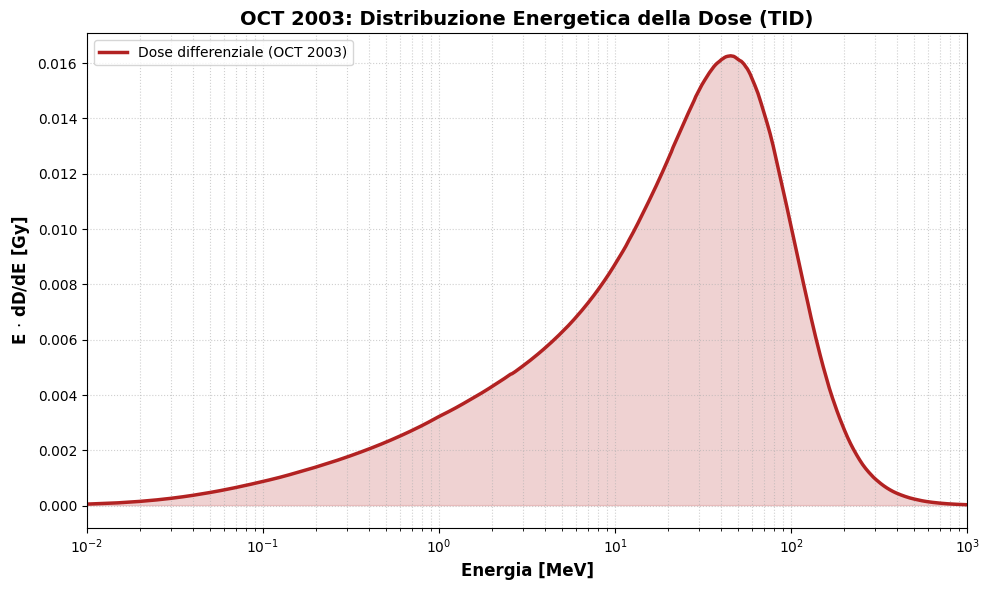

In [29]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt

# ============================================================
# 1. CARICAMENTO DATI (JAN 2005)
# ============================================================

# 1.1 Griglia Master e Risultati SR-NIEL (Range: 0.001 - 1000 MeV)
path_res = "FINAL_OCT2003_SRNIEL_EXPORTooo (0.05-1000MeV)/37mmAl_residual_planar.txt"
df_median_res = pd.read_csv(
    path_res, 
    sep=r"\s+", comment="#", skiprows=1,
    names=["E", "Phi_in_med", "Phi_res_med"]
).sort_values("E")

df_median_res = df_median_res[df_median_res["E"] >= 0.001]
E_master = df_median_res["E"].values
Phi_res_med = df_median_res["Phi_res_med"].values
Phi_in_med = df_median_res["Phi_in_med"].values

# 1.2 Caricamento Bande Incertezza Incidenti (68% CL dal Monte Carlo)
path_cl = "FINAL_OCT2003_SRNIEL_EXPORTooo (0.05-1000MeV)/OCT03_Planare_CL68.txt"
df_band_inc = pd.read_csv(
    path_cl, 
    sep=r"\s+", skiprows=1, 
    names=["E", "Phi_16_inc", "Phi_84_inc"]
).sort_values("E")

# 1.3 Caricamento Stopping Power (SRIM/SR-NIEL)
path_S = "Simulazioni_SRNIEL/JAN2005/FINAL_JAN2005_SRNIEL_EXPORT/stopping_power_Si.txt"
df_S = pd.read_csv(
    path_S,
    sep=r"\s+", comment="#", skiprows=1,
    names=["E", "S", "Dose_MeV_g", "Dose_Gy"]
).drop_duplicates(subset="E").sort_values("E")

# ============================================================
# 2. CALCOLO RATIO DI INCERTEZZA E PROPAGAZIONE
# ============================================================

# Interpoliamo le bande incidenti sulla griglia MASTER
phi_16_inc_grid = np.interp(E_master, df_band_inc["E"], df_band_inc["Phi_16_inc"])
phi_84_inc_grid = np.interp(E_master, df_band_inc["E"], df_band_inc["Phi_84_inc"])

# Calcolo Ratio K = Phi_band / Phi_mediana (Incertezza relativa spettrale)
with np.errstate(divide='ignore', invalid='ignore'):
    ratio_16 = phi_16_inc_grid / Phi_in_med
    ratio_84 = phi_84_inc_grid / Phi_in_med

# Pulizia numerica
ratio_16 = np.nan_to_num(ratio_16, nan=1.0, posinf=1.0)
ratio_84 = np.nan_to_num(ratio_84, nan=1.0, posinf=1.0)

# Applicazione allo spettro RESIDUO
phi_16_res = Phi_res_med * ratio_16
phi_84_res = Phi_res_med * ratio_84

# Interpolazione Stopping Power
S_grid = 10**np.interp(np.log10(E_master), np.log10(df_S["E"]), np.log10(df_S["S"]))

# ============================================================
# 3. INTEGRAZIONE FINALE (TID)
# ============================================================
CONV_GY = 1.602e-10

dose_med_mGy = np.trapezoid(Phi_res_med * S_grid, E_master) * CONV_GY * 1e3
# Includiamo l'incertezza del 5% del database SRIM/Stopping Power
dose_16_mGy = np.trapezoid(phi_16_res * (S_grid * 0.95), E_master) * CONV_GY * 1e3
dose_84_mGy = np.trapezoid(phi_84_res * (S_grid * 1.05), E_master) * CONV_GY * 1e3

print("-" * 60)
print(f"ANALISI INCERTEZZA DOSE - OCT 2003")
print(f"Configurazione: 37mm Al, Geometria Planare")
print(f"Range integrato: {E_master.min():.3e} MeV - {E_master.max():.0f} MeV")
print(f"Dose Mediana: {dose_med_mGy:.3f} mGy")
print(f"Intervallo 68% CL (Fit + 5% SRIM): [{dose_16_mGy:.2f} - {dose_84_mGy:.2f}] mGy")
print(f"Incertezza: +{dose_84_mGy - dose_med_mGy:.2f} / -{dose_med_mGy - dose_16_mGy:.2f} mGy")
print("-" * 60)

# ============================================================
# 4. VISUALIZZAZIONE AVANZATA
# ============================================================
dD_dE = Phi_res_med * S_grid * CONV_GY

plt.figure(figsize=(10, 6))
# Semilogx(E, E*dD/dE) rende l'area visiva proporzionale alla dose
plt.semilogx(E_master, E_master * dD_dE, color='firebrick', lw=2.5, label='Dose differenziale (OCT 2003)')
plt.fill_between(E_master, E_master * dD_dE, color='firebrick', alpha=0.2)

plt.title("OCT 2003: Distribuzione Energetica della Dose (TID)", fontsize=14, fontweight='bold')
plt.xlabel("Energia [MeV]", fontsize=12, fontweight='bold')
plt.ylabel(r"E $\cdot$ dD/dE [Gy]", fontsize=12, fontweight='bold')
plt.grid(True, which="both", ls=':', alpha=0.6)
plt.xlim(0.01, 1000)
plt.legend()
plt.tight_layout()
plt.show()



# CALCOLO DOSE SPHERICAL SHIELDING 37mm Al

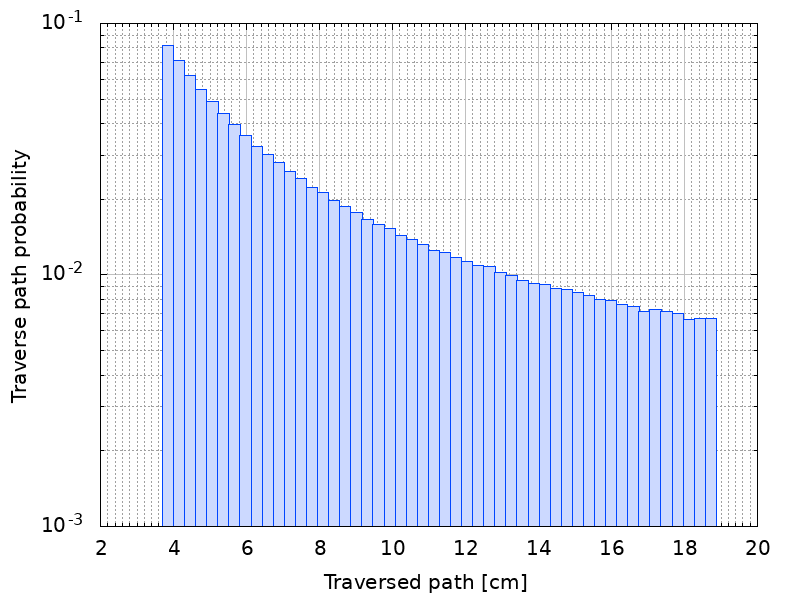
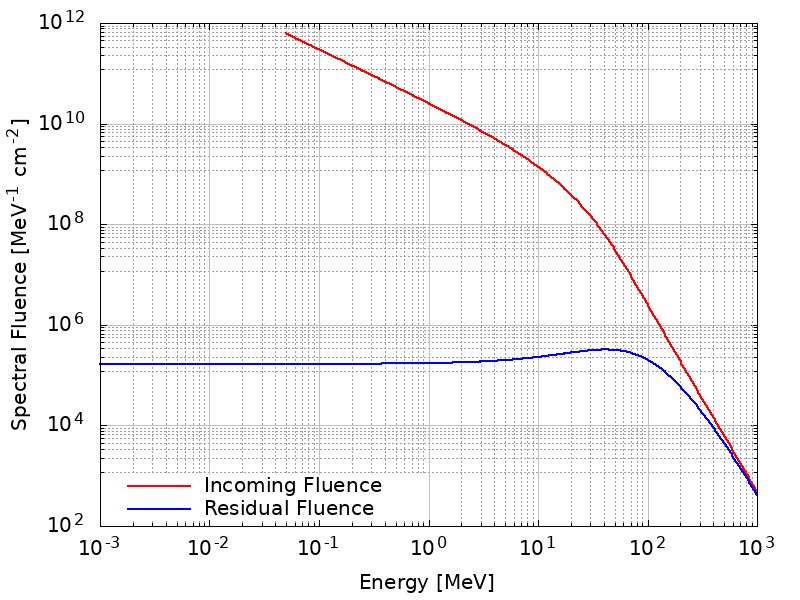

------------------------------------------------------------
ANALISI INCERTEZZA DOSE - OCT 2003
Configurazione: 37mm Al, Geometria Sferica
Range integrato: 1.000e-03 MeV - 1000 MeV
Dose Mediana: 85.576 mGy
Intervallo 68% CL (Fit + 5% SRIM): [65.40 - 113.86] mGy
Incertezza: +28.28 / -20.17 mGy
------------------------------------------------------------


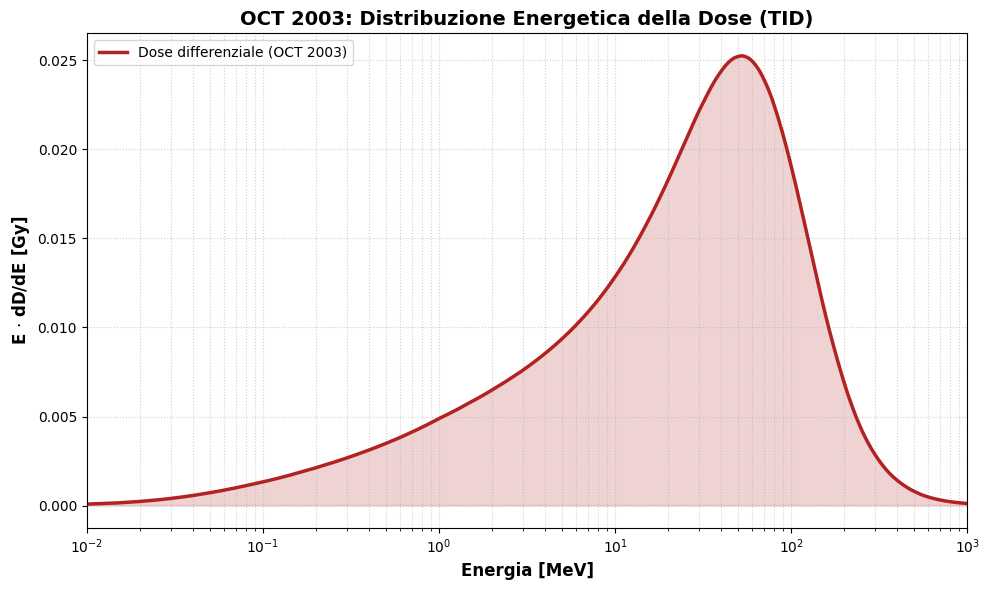

In [30]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt

# ============================================================
# 1. CARICAMENTO DATI (JAN 2005)
# ============================================================

# 1.1 Griglia Master e Risultati SR-NIEL (Range: 0.001 - 1000 MeV)
path_res = "FINAL_OCT2003_SRNIEL_EXPORTooo (0.05-1000MeV)/37mmAl_residual_spherical.txt"
df_median_res = pd.read_csv(
    path_res, 
    sep=r"\s+", comment="#", skiprows=1,
    names=["E", "Phi_in_med", "Phi_res_med"]
).sort_values("E")

df_median_res = df_median_res[df_median_res["E"] >= 0.001]
E_master = df_median_res["E"].values
Phi_res_med = df_median_res["Phi_res_med"].values
Phi_in_med = df_median_res["Phi_in_med"].values

# 1.2 Caricamento Bande Incertezza Incidenti (68% CL dal Monte Carlo)
path_cl = "FINAL_OCT2003_SRNIEL_EXPORTooo (0.05-1000MeV)/OCT03_Sferica_CL68.txt"
df_band_inc = pd.read_csv(
    path_cl, 
    sep=r"\s+", skiprows=1, 
    names=["E", "Phi_16_inc", "Phi_84_inc"]
).sort_values("E")

# 1.3 Caricamento Stopping Power (SRIM/SR-NIEL)
path_S = "Simulazioni_SRNIEL/JAN2005/FINAL_JAN2005_SRNIEL_EXPORT/stopping_power_Si.txt"
df_S = pd.read_csv(
    path_S,
    sep=r"\s+", comment="#", skiprows=1,
    names=["E", "S", "Dose_MeV_g", "Dose_Gy"]
).drop_duplicates(subset="E").sort_values("E")

# ============================================================
# 2. CALCOLO RATIO DI INCERTEZZA E PROPAGAZIONE
# ============================================================

# Interpoliamo le bande incidenti sulla griglia MASTER
phi_16_inc_grid = np.interp(E_master, df_band_inc["E"], df_band_inc["Phi_16_inc"])
phi_84_inc_grid = np.interp(E_master, df_band_inc["E"], df_band_inc["Phi_84_inc"])

# Calcolo Ratio K = Phi_band / Phi_mediana (Incertezza relativa spettrale)
with np.errstate(divide='ignore', invalid='ignore'):
    ratio_16 = phi_16_inc_grid / Phi_in_med
    ratio_84 = phi_84_inc_grid / Phi_in_med

# Pulizia numerica
ratio_16 = np.nan_to_num(ratio_16, nan=1.0, posinf=1.0)
ratio_84 = np.nan_to_num(ratio_84, nan=1.0, posinf=1.0)

# Applicazione allo spettro RESIDUO
phi_16_res = Phi_res_med * ratio_16
phi_84_res = Phi_res_med * ratio_84

# Interpolazione Stopping Power
S_grid = 10**np.interp(np.log10(E_master), np.log10(df_S["E"]), np.log10(df_S["S"]))

# ============================================================
# 3. INTEGRAZIONE FINALE (TID)
# ============================================================
CONV_GY = 1.602e-10

dose_med_mGy = np.trapezoid(Phi_res_med * S_grid, E_master) * CONV_GY * 1e3
# Includiamo l'incertezza del 5% del database SRIM/Stopping Power
dose_16_mGy = np.trapezoid(phi_16_res * (S_grid * 0.95), E_master) * CONV_GY * 1e3
dose_84_mGy = np.trapezoid(phi_84_res * (S_grid * 1.05), E_master) * CONV_GY * 1e3

print("-" * 60)
print(f"ANALISI INCERTEZZA DOSE - OCT 2003")
print(f"Configurazione: 37mm Al, Geometria Sferica")
print(f"Range integrato: {E_master.min():.3e} MeV - {E_master.max():.0f} MeV")
print(f"Dose Mediana: {dose_med_mGy:.3f} mGy")
print(f"Intervallo 68% CL (Fit + 5% SRIM): [{dose_16_mGy:.2f} - {dose_84_mGy:.2f}] mGy")
print(f"Incertezza: +{dose_84_mGy - dose_med_mGy:.2f} / -{dose_med_mGy - dose_16_mGy:.2f} mGy")
print("-" * 60)

# ============================================================
# 4. VISUALIZZAZIONE AVANZATA
# ============================================================
dD_dE = Phi_res_med * S_grid * CONV_GY

plt.figure(figsize=(10, 6))
# Semilogx(E, E*dD/dE) rende l'area visiva proporzionale alla dose
plt.semilogx(E_master, E_master * dD_dE, color='firebrick', lw=2.5, label='Dose differenziale (OCT 2003)')
plt.fill_between(E_master, E_master * dD_dE, color='firebrick', alpha=0.2)

plt.title("OCT 2003: Distribuzione Energetica della Dose (TID)", fontsize=14, fontweight='bold')
plt.xlabel("Energia [MeV]", fontsize=12, fontweight='bold')
plt.ylabel(r"E $\cdot$ dD/dE [Gy]", fontsize=12, fontweight='bold')
plt.grid(True, which="both", ls=':', alpha=0.6)
plt.xlim(0.01, 1000)
plt.legend()
plt.tight_layout()
plt.show()



# FIT univoco CELLA EXPORT (modello Band)


--- INIZIO ELABORAZIONE FINALE: OTTOBRE 2003 (MODELLO BAND) ---


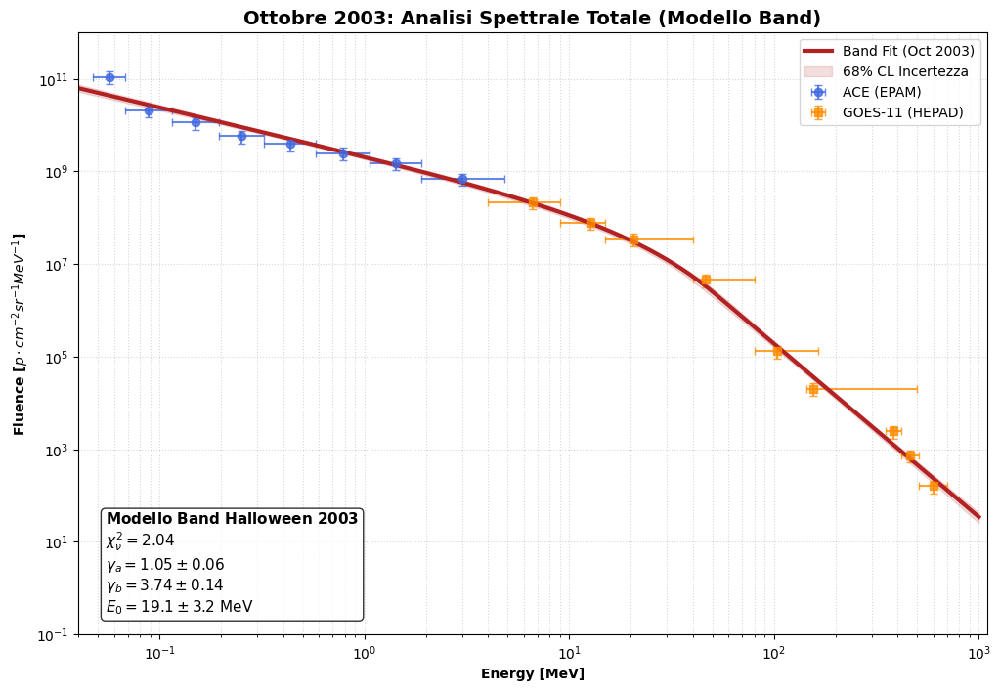

Export (Modello Band) completato con successo in: FINAL_OCT2003_BAND_EXPORT


In [25]:
import numpy as np
import matplotlib.pyplot as plt
import os

# ============================================================
# ANALISI DEFINITIVA OCT 2003: FIT (BAND), MONTE CARLO E EXPORT
# ============================================================

print("\n--- INIZIO ELABORAZIONE FINALE: OTTOBRE 2003 (MODELLO BAND) ---")

# 1) ACCUMULO E SOMMA DELLE FLUENZE
ROUND_E = 6
acc = {}
for source, instr_name in [(results_ACE, "ACE (EPAM)"), (results_GOES, "GOES-11 (EPS/HEPAD)")]:
    for evt_name, evt_data in source.items():
        x, y = np.asarray(evt_data["x"]), np.asarray(evt_data["y"])
        xl, xh = np.asarray(evt_data["x_err"][0]), np.asarray(evt_data["x_err"][1])
        for Ei, yi, xli, xhi in zip(x, y, xl, xh):
            key = np.round(Ei, ROUND_E)
            if key not in acc:
                acc[key] = {"E": Ei, "y": yi, "xl": abs(xli), "xh": abs(xhi), "instr": instr_name}
            else:
                acc[key]["y"] += yi # Somma integrale dei segmenti temporali

E_tot, Y_tot = np.zeros(len(acc)), np.zeros(len(acc))
XL_tot, XH_tot = np.zeros(len(acc)), np.zeros(len(acc))
instruments = []
for i, key in enumerate(sorted(acc.keys())):
    E_tot[i], Y_tot[i] = acc[key]["E"], acc[key]["y"]
    XL_tot[i], XH_tot[i] = acc[key]["xl"], acc[key]["xh"]
    instruments.append(acc[key]["instr"])

# --- INCERTEZZA: SISTEMATICA (30%) + STATISTICA (sqrt(N)) ---
# Metodo robusto per pesare correttamente i canali ad alta energia
Yerr_tot = np.sqrt((0.30 * Y_tot)**2 + Y_tot) 

# 2) FIT BAND FUNCTION
# p0: [A, ga, gb, E0]
p0 = [1e9, 1.1, 3.2, 15.0]
bounds = ([0, 0.1, 0.5, 1.0], [np.inf, 6.0, 10.0, 500.0])
popt, pcov = fit_log_space(band_function, E_tot, Y_tot, Yerr_tot, p0, bounds)

if popt is None: raise RuntimeError("ERRORE: Fit Band fallito.")
perr = np.sqrt(np.diag(pcov))

# Statistiche
res = (Y_tot - band_function(E_tot, *popt)) / Yerr_tot
chi2red = np.sum(res**2) / (len(E_tot) - len(popt))

# 3) MONTE CARLO (Propagazione incertezze sui parametri del Band)
E_grid = np.logspace(0, 3, 500) 
N_MC = 1000
rng = np.random.default_rng(42)

# Protezione numerica per la matrice di covarianza
v, w = np.linalg.eigh(pcov)
pcov_robust = w @ np.diag(np.maximum(v, 1e-10)) @ w.T 

p_samples = rng.multivariate_normal(popt, pcov_robust, size=N_MC)
Phi_MC = np.array([np.where(band_function(E_grid, *ps) > 0, band_function(E_grid, *ps), 1e-40) 
                   for ps in p_samples])

Phi_med = np.median(Phi_MC, axis=0)
Phi_lo, Phi_hi = np.percentile(Phi_MC, [16, 84], axis=0)

# 4) PLOT PROFESSIONALE
plt.figure(figsize=(12, 8))
mask_ace = np.array(instruments) == "ACE (EPAM)"
plt.errorbar(E_tot[mask_ace], Y_tot[mask_ace], yerr=Yerr_tot[mask_ace], xerr=[XL_tot[mask_ace], XH_tot[mask_ace]], 
             fmt="o", color="royalblue", capsize=3, label="ACE (EPAM)", alpha=0.8)

mask_goes = np.array(instruments) == "GOES-11 (EPS/HEPAD)"
plt.errorbar(E_tot[mask_goes], Y_tot[mask_goes], yerr=Yerr_tot[mask_goes], xerr=[XL_tot[mask_goes], XH_tot[mask_goes]], 
             fmt="s", color="darkorange", capsize=3, label="GOES-11 (HEPAD)", alpha=0.8)

E_grid_plot = np.logspace(-1.5, 3, 1000)
plt.plot(E_grid_plot, band_function(E_grid_plot, *popt), color="firebrick", lw=3, label="Band Fit (Oct 2003)")
plt.fill_between(E_grid_plot, np.percentile(np.array([band_function(E_grid_plot, *ps) for ps in p_samples]), 16, axis=0), 
                 np.percentile(np.array([band_function(E_grid_plot, *ps) for ps in p_samples]), 84, axis=0), 
                 color="firebrick", alpha=0.15, label="68% CL Incertezza")

# Box Parametri Band (LaTeX)
stats_box = (
    r"$\bf{Modello\ Band\ Halloween\ 2003}$" + "\n" +
    r"$\chi^2_\nu = %.2f$" % chi2red + "\n" +
    r"$\gamma_a = %.2f \pm %.2f$" % (popt[1], perr[1]) + "\n" +
    r"$\gamma_b = %.2f \pm %.2f$" % (popt[2], perr[2]) + "\n" +
    r"$E_0 = %.1f \pm %.1f$ MeV" % (popt[3], perr[3])
)
plt.gca().text(0.03, 0.03, stats_box, transform=plt.gca().transAxes, fontsize=11, 
                verticalalignment='bottom', bbox=dict(boxstyle='round', facecolor='white', alpha=0.8))

plt.xscale("log"); plt.yscale("log"); plt.xlim(0.04, 1100); plt.ylim(1e-1, 1e12)
plt.xlabel("Energy [MeV]", fontweight='bold'); plt.ylabel(r"Fluence [$p \cdot cm^{-2} sr^{-1} MeV^{-1}$]", fontweight='bold')
plt.title("Ottobre 2003: Analisi Spettrale Totale (Modello Band)", fontsize=14, fontweight='bold')
plt.grid(True, which="both", ls=':', alpha=0.5); plt.legend(loc="upper right"); plt.show()

# 5) EXPORT SR-NIEL (Directory: FINAL_OCT2003_BAND_EXPORT)
out_dir = "FINAL_OCT2003_BAND_EXPORT"
if not os.path.exists(out_dir): os.makedirs(out_dir)

FACTORS = {"Planare": np.pi, "Sferica": 4*np.pi}
for geo, factor in FACTORS.items():
    np.savetxt(f"{out_dir}/OCT03_{geo}_Median.txt", np.column_stack([E_grid, factor*Phi_med]), fmt="%.6e", 
               header=f"Energy(MeV) {geo}_Fluence(cm^-2*MeV^-1)", comments="")
    np.savetxt(f"{out_dir}/OCT03_{geo}_CL68.txt", np.column_stack([E_grid, factor*Phi_lo, factor*Phi_hi]), fmt="%.6e", 
               header=f"Energy(MeV) Phi_16 Phi_84", comments="")

print(f"Export (Modello Band) completato con successo in: {out_dir}")

# CELLA EXPORT PER SRNIEL +  INCERTEZZE MONTE CARLO + UNICO FIT 

--- FIT TOTALE SEP Halloween 2003 (Somma integrale 26/10 - 02/11) ---
Canali unici ACE+GOES identificati: 16

Parametri Fit (Halloween TOT):
ga = 0.93 ± 0.08
gb = 3.69 ± 0.45
E0 = 16.16 ± 2.79 MeV
Ecut = 5000.0 ± 51394.0 MeV
chi2_red = 1.46


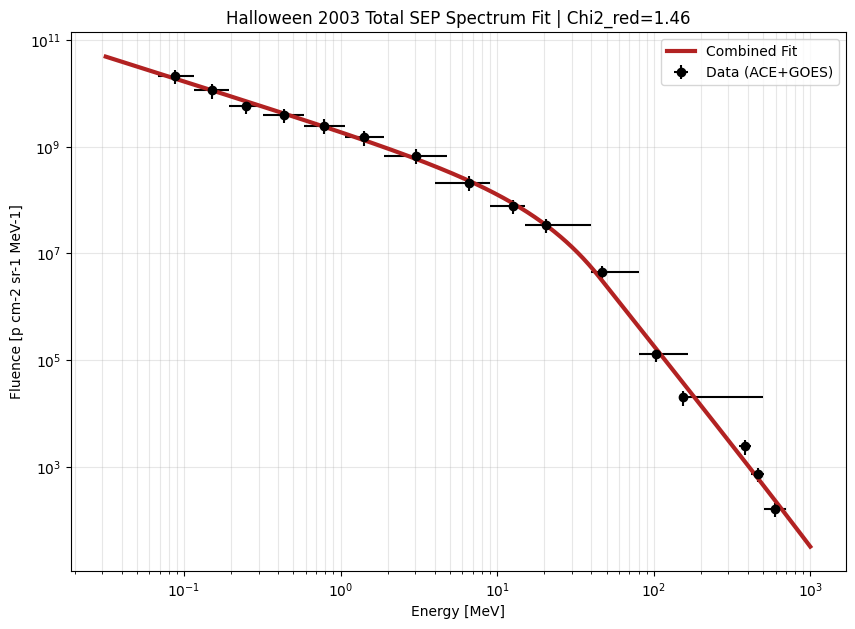


--- EXPORT COMPLETATO ---
File per SR-NIEL (Median): SRNIEL_input_Halloween2003_TOTAL_SPHERICAL_noPi_MCmedian.txt
File Bande (16/84): SRNIEL_input_Halloween2003_TOTAL_SPHERICAL_noPi_MC16_84.txt

Preview (Copia e incolla i primi 10 punti nel calcolatore SR-NIEL):
5.000000e-02 3.152568e+10
5.168383e-02 3.056368e+10
5.342437e-02 2.962230e+10
5.522353e-02 2.874474e+10
5.708327e-02 2.787243e+10
5.900565e-02 2.704003e+10
6.099276e-02 2.620959e+10
6.304680e-02 2.541283e+10
6.517000e-02 2.464613e+10
6.736471e-02 2.390009e+10


In [16]:
import numpy as np
import matplotlib.pyplot as plt

# ============================================================
# FIT TOTALE SEP HALLOWEEN (Oct 2003) + MONTE CARLO + EXPORT
# ============================================================

print("--- FIT TOTALE SEP Halloween 2003 (Somma integrale 26/10 - 02/11) ---")

# 1. SOMMA FLUENCE PER CANALE (Unione ACE + GOES)
# Usiamo i dizionari 'results_ACE' e 'results_GOES' già calcolati
ROUND_E = 6
acc = {}

# Uniamo i risultati di tutti i segmenti temporali (Precursore, Main, Tail)
# per ottenere la fluenza totale dell'evento
for source in [results_ACE, results_GOES]:
    for evt_name, evt_data in source.items():
        x = np.asarray(evt_data["x"])
        y = np.asarray(evt_data["y"])
        xl = np.asarray(evt_data["x_err"][0])
        xh = np.asarray(evt_data["x_err"][1])

        for Ei, yi, xli, xhi in zip(x, y, xl, xh):
            key = np.round(Ei, ROUND_E)
            if key not in acc:
                acc[key] = {"E": Ei, "y": yi, "xl": abs(xli), "xh": abs(xhi)}
            else:
                acc[key]["y"] += yi  # Somma delle fluenze nei diversi intervalli

# Creazione array finali ordinati per energia
E_tot  = np.zeros(len(acc))
Y_tot  = np.zeros(len(acc))
XL_tot = np.zeros(len(acc))
XH_tot = np.zeros(len(acc))

for i, key in enumerate(sorted(acc.keys())):
    E_tot[i]  = acc[key]["E"]
    Y_tot[i]  = acc[key]["y"]
    XL_tot[i] = acc[key]["xl"]
    XH_tot[i] = acc[key]["xh"]

# Errore verticale sistematico (30%)
Yerr_tot = 0.30 * Y_tot

print(f"Canali unici ACE+GOES identificati: {len(E_tot)}")

# 2. FIT COMBINED (Band x Cutoff)
# Parametri iniziali stimati per Halloween (evento molto hard)
p0 = [1e9, 1.1, 3.2, 15.0, 300.0]
bounds = (
    [0, 0.1, 0.5, 1.0, 50.0],
    [np.inf, 6.0, 10.0, 500.0, 5000.0]
)

popt, pcov = fit_log_space(combined_function, E_tot, Y_tot, Yerr_tot, p0, bounds)

if popt is None:
    raise RuntimeError("Il FIT è fallito. Controlla i dati di input.")

perr = np.sqrt(np.diag(pcov))

# Calcolo Chi2 ridotto
res = (Y_tot - combined_function(E_tot, *popt)) / Yerr_tot
chi2red = np.sum(res**2) / (len(Y_tot) - len(popt))

print(f"\nParametri Fit (Halloween TOT):")
print(f"ga = {popt[1]:.2f} ± {perr[1]:.2f}")
print(f"gb = {popt[2]:.2f} ± {perr[2]:.2f}")
print(f"E0 = {popt[3]:.2f} ± {perr[3]:.2f} MeV")
print(f"Ecut = {popt[4]:.1f} ± {perr[4]:.1f} MeV")
print(f"chi2_red = {chi2red:.2f}")

# 3. PLOT DI CONTROLLO
E_plot = np.logspace(-1.5, 3, 1000)
plt.figure(figsize=(10, 7))
plt.errorbar(E_tot, Y_tot, yerr=Yerr_tot, xerr=[XL_tot, XH_tot], fmt='o', color='black', label='Data (ACE+GOES)')
plt.plot(E_plot, combined_function(E_plot, *popt), color='firebrick', lw=3, label='Combined Fit')
plt.xscale('log'); plt.yscale('log')
plt.xlabel("Energy [MeV]"); plt.ylabel("Fluence [p cm-2 sr-1 MeV-1]")
plt.title(f"Halloween 2003 Total SEP Spectrum Fit | Chi2_red={chi2red:.2f}")
plt.grid(True, which='both', alpha=0.3); plt.legend()
plt.show()

# 4. MONTE CARLO (Propagazione incertezze sui parametri)
E_grid = np.logspace(np.log10(0.05), np.log10(1000.0), 300)
N_MC = 1000
rng = np.random.default_rng(42)
Phi_MC = np.empty((N_MC, E_grid.size))

for k in range(N_MC):
    p_mc = rng.multivariate_normal(popt, pcov)
    phi = combined_function(E_grid, *p_mc)
    Phi_MC[k] = np.where(phi > 0, phi, 1e-40)

Phi_med = np.median(Phi_MC, axis=0)
Phi_lo  = np.percentile(Phi_MC, 16, axis=0)
Phi_hi  = np.percentile(Phi_MC, 84, axis=0)

# 5. EXPORT SRNIEL (Sferico e Planare)
# Sferico: SOLID_ANGLE = 1.0 (input differenziale sr-1)
# Planare: SOLID_ANGLE = np.pi (proiezione piana)
SOLID_ANGLE_PLANAR = 1.0 

# Salvataggio Mediana (Planare per SR-NIEL Unidirezionale)
out_planar = "SRNIEL_input_Halloween2003_TOTAL_SPHERICAL_noPi_MCmedian.txt"
np.savetxt(out_planar, np.column_stack([E_grid, SOLID_ANGLE_PLANAR * Phi_med]),
           fmt="%.6e", header="Energy(MeV)  SpectralFluence(cm^-2 MeV^-1)", comments="")

# Salvataggio Bande (per analisi incertezza dose)
out_band = "SRNIEL_input_Halloween2003_TOTAL_SPHERICAL_noPi_MC16_84.txt"
np.savetxt(out_band, np.column_stack([E_grid, SOLID_ANGLE_PLANAR * Phi_lo, SOLID_ANGLE_PLANAR * Phi_hi]),
           fmt="%.6e", header="Energy(MeV)  Phi_16(cm^-2 MeV^-1)  Phi_84(cm^-2 MeV^-1)", comments="")

print(f"\n--- EXPORT COMPLETATO ---")
print(f"File per SR-NIEL (Median): {out_planar}")
print(f"File Bande (16/84): {out_band}")

# Preview per SR-NIEL
print("\nPreview (Copia e incolla i primi 10 punti nel calcolatore SR-NIEL):")
for i in range(10):
    print(f"{E_grid[i]:.6e} {SOLID_ANGLE_PLANAR * Phi_med[i]:.6e}")

# DOSE Planar Shielding 37mm Al

----------------------------------------
RISULTATI DOSIMETRICI (Geometria Planare)
Dose totale in Silicio: 5.129e-02 Gy
Dose totale in Silicio: 51.286 mGy
----------------------------------------


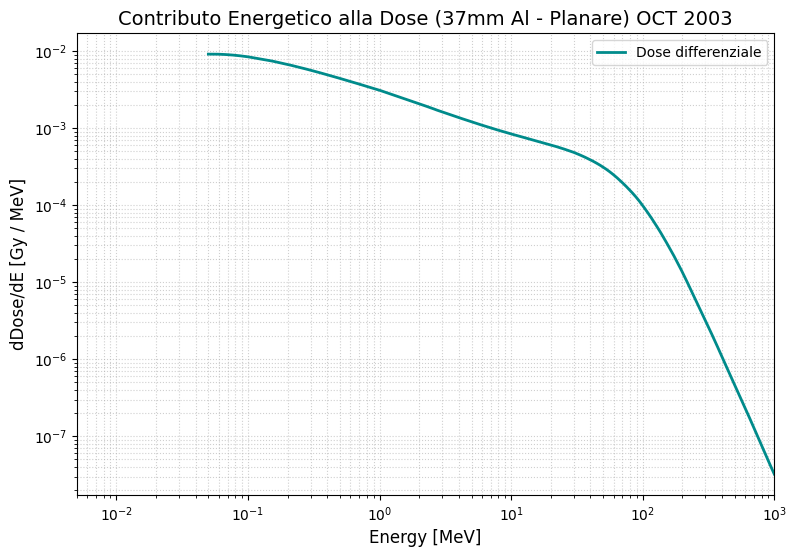

In [10]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt

# =========================================================
# 1) CARICA FLUENZA RESIDUA (Output SR-NIEL)
# =========================================================
# File generato dal calcolatore planare (es. 37mm Al)
path_flu = "Simulazioni_SRNIEL\\OCT2003\\Planar Shielding\\37mmAl_residual_planar.txt"

df_flu = pd.read_csv(
    path_flu,
    sep=r"\s+",
    comment="#",
    skiprows=1,
    names=["E", "Phi_in", "Phi_res"]
)

# Taglio energetico coerente con la tabella SRIM (> 50 keV)
df_flu = df_flu[df_flu["E"] >= 0.05]

E = df_flu["E"].to_numpy()               # MeV
Phi = df_flu["Phi_res"].to_numpy()       # cm^-2 MeV^-1

# =========================================================
# 2) CARICA STOPPING POWER IN SILICIO (SRIM)
# =========================================================
path_S = "Simulazioni_SRNIEL/JAN2005/Spherical Shielding/stopping_power_Si_spherical.txt"

df_S = pd.read_csv(
    path_S,
    sep=r"\s+",
    comment="#",
    skiprows=1,
    names=["E", "S", "Dose_MeV_g", "Dose_Gy"]
)

# Rimuove duplicati e ordina per energia (fondamentale per np.interp)
df_S = df_S.drop_duplicates(subset="E").sort_values("E")

E_S = df_S["E"].to_numpy()   # MeV
S   = df_S["S"].to_numpy()   # MeV cm^2 g^-1

# =========================================================
# 3) INTERPOLAZIONE S(E) LOG-LOG (Metodo Fisicamente Corretto)
# =========================================================
# Utilizziamo lo spazio logaritmico per minimizzare l'errore sistematico
S_interp = 10**np.interp(np.log10(E), np.log10(E_S), np.log10(S))

# =========================================================
# 4) INTEGRAZIONE PER LA DOSE
# =========================================================
# Costante di conversione: 1.602e-10 (da MeV/g a J/kg ovvero Gray)
CONV_GY = 1.602e-10

# np.trapezoid calcola internamente i dE tra i punti del vettore E
dose_Gy = np.trapezoid(Phi * S_interp, E) * CONV_GY

print("-" * 40)
print(f"RISULTATI DOSIMETRICI (Geometria Planare)")
print(f"Dose totale in Silicio: {dose_Gy:.3e} Gy")
print(f"Dose totale in Silicio: {dose_Gy*1e3:.3f} mGy")
print("-" * 40)

# =========================================================
# 5) VISUALIZZAZIONE dDose/dE (Contributo Energetico)
# =========================================================
dD_dE = Phi * S_interp * CONV_GY

plt.figure(figsize=(9, 6))
plt.loglog(E, dD_dE, color='darkcyan', lw=2, label='Dose differenziale')
plt.xlabel("Energy [MeV]", fontsize=12)
plt.ylabel("dDose/dE [Gy / MeV]", fontsize=12)
plt.xlim(0.005, 1000)
plt.title("Contributo Energetico alla Dose (37mm Al - Planare) OCT 2003", fontsize=14)
plt.grid(True, which="both", ls=':', alpha=0.6)
plt.legend()
plt.show()

# Incertezze per PLANARE SHIELDING 37mm Al

In [12]:
import numpy as np
import pandas as pd

# ============================================================
# 1. CARICAMENTO DATI - HALLOWEEN OCT 2003
# ============================================================

# Carica le bande di incertezza incidenti (MC 16/84 - Planare) generate dal fit Combined
df_band_inc = pd.read_csv(
    "Simulazioni_SRNIEL/OCT2003/Planar Shielding/SRNIEL_input_Halloween2003_TOTAL_PLANAR_Pi_MC16_84.txt", 
    sep=r"\s+", skiprows=1, 
    names=["E", "Phi_16_inc", "Phi_84_inc"]
)

# Carica i risultati SR-NIEL della simulazione MEDIANA (37mm Al Planare)
df_median_res = pd.read_csv(
    "Simulazioni_SRNIEL/OCT2003/Planar Shielding/37mmAl_residual_planar.txt", 
    sep=r"\s+", comment="#", skiprows=1,
    names=["E", "Phi_in_med", "Phi_res_med"]
)

# Carica lo Stopping Power nel Silicio (Resta costante per entrambi gli eventi)
df_S = pd.read_csv(
    "Simulazioni_SRNIEL/JAN2005/Spherical Shielding/stopping_power_Si_spherical.txt",
    sep=r"\s+", comment="#", skiprows=1,
    names=["E", "S", "Dose_MeV_g", "Dose_Gy"]
).drop_duplicates(subset="E").sort_values("E")

E_S = df_S["E"].to_numpy()
S_val = df_S["S"].to_numpy()

# ============================================================
# 2. CALCOLO ATTENUAZIONE (Gestione Warning Divisione)
# ============================================================

E_srniel = df_median_res["E"].values

# Utilizziamo errstate per ignorare il warning della divisione per zero sulle alte energie
with np.errstate(divide='ignore', invalid='ignore'):
    attenuazione_raw = df_median_res["Phi_res_med"].values / df_median_res["Phi_in_med"].values
# Sostituiamo eventuali NaN o Inf derivanti dallo stop dei protoni a bassa energia
attenuazione_raw = np.nan_to_num(attenuazione_raw, nan=0.0, posinf=0.0)

# Mappiamo l'attenuazione sulla griglia target Monte Carlo (300 punti)
E_target = df_band_inc["E"].values
attenuazione_interp = np.interp(E_target, E_srniel, attenuazione_raw)

# ============================================================
# 3. PROPAGAZIONE INCERTEZZA (Fit MC + SRIM 5%)
# ============================================================

# Ricalcolo Stopping Power sulla griglia E_target (Log-Log) per massima precisione
S_MC_grid = 10**np.interp(np.log10(E_target), np.log10(E_S), np.log10(S_val))

CONV_GY = 1.602e-10

# Limite Inferiore: Fluenza 16% * Stopping Power al 95% (-5% incertezza modello)
phi_16_res = df_band_inc["Phi_16_inc"].values * attenuazione_interp
dose_16_mGy = np.trapezoid(phi_16_res * (S_MC_grid * 0.95), E_target) * CONV_GY * 1e3

# Limite Superiore: Fluenza 84% * Stopping Power al 105% (+5% incertezza modello)
phi_84_res = df_band_inc["Phi_84_inc"].values * attenuazione_interp
dose_84_mGy = np.trapezoid(phi_84_res * (S_MC_grid * 1.05), E_target) * CONV_GY * 1e3

# Dose mediana ottenuta dalla cella precedente per OCT 2003
dose_mediana_mGy = 51.286 

print("-" * 60)
print(f"ANALISI INCERTEZZA DOSE - EVENTO SEP OCT 2003")
print(f"Configurazione: 37mm Al, Geometria Planare (10 g/cm²)")
print(f"Dose Mediana Integrale: {dose_mediana_mGy:.3f} mGy")
print(f"Intervallo 68% CL (Fit + 5% SRIM): [{dose_16_mGy:.2f} - {dose_84_mGy:.2f}] mGy")
print(f"Incertezza Totale: +{dose_84_mGy - dose_mediana_mGy:.2f} / -{dose_mediana_mGy - dose_16_mGy:.2f} mGy")
print("-" * 60)

------------------------------------------------------------
ANALISI INCERTEZZA DOSE - EVENTO SEP OCT 2003
Configurazione: 37mm Al, Geometria Planare (10 g/cm²)
Dose Mediana Integrale: 51.286 mGy
Intervallo 68% CL (Fit + 5% SRIM): [39.60 - 66.26] mGy
Incertezza Totale: +14.97 / -11.69 mGy
------------------------------------------------------------


# Random plot utili sempre per Planare

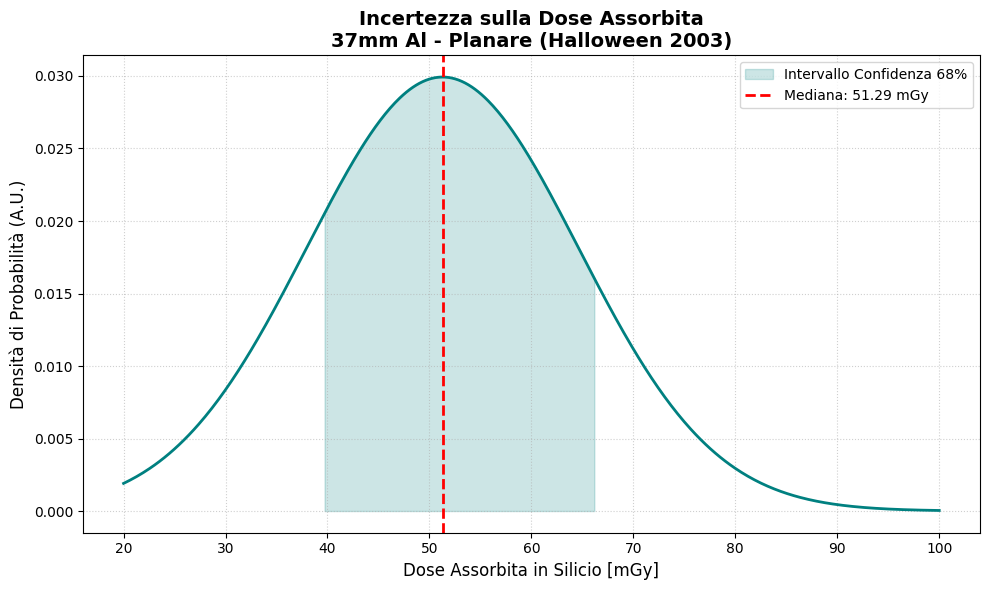

C:\Users\stefa\AppData\Local\Temp\ipykernel_10952\166100386.py:61: UserWarning: Attempt to set non-positive xlim on a log-scaled axis will be ignored.
  plt.xlim(0, 2000) # Partiamo da 50 MeV (taglio schermo)


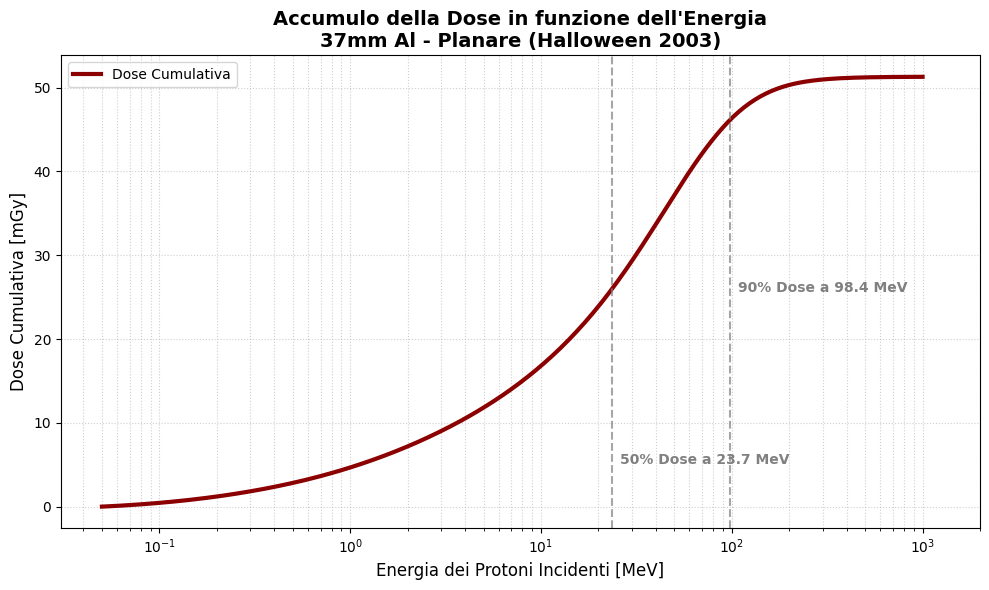

In [15]:
import numpy as np
import matplotlib.pyplot as plt
from scipy.stats import norm

# ============================================================
# DATI DI INPUT (Ottenuti dai tuoi calcoli precedenti)
# ============================================================
dose_mediana = 51.286
dose_16 = 39.60
dose_84 = 66.26
config = "37mm Al - Planare (Halloween 2003)"

# ============================================================
# 1. PLOT DELLA DISTRIBUZIONE DI PROBABILITÀ (Sintesi MC)
# ============================================================
plt.figure(figsize=(10, 6))

# Simuliamo una distribuzione log-normale per visualizzazione (coerente con i fit SEP)
x_axis = np.linspace(20, 100, 500)
# Calcolo sigma asimmetrico approssimativo per la curva
sigma_avg = (dose_84 - dose_16) / 2
plt.fill_between(x_axis, norm.pdf(x_axis, dose_mediana, sigma_avg), 
                 where=(x_axis >= dose_16) & (x_axis <= dose_84), 
                 color='teal', alpha=0.2, label='Intervallo Confidenza 68%')

plt.plot(x_axis, norm.pdf(x_axis, dose_mediana, sigma_avg), color='teal', lw=2)
plt.axvline(dose_mediana, color='red', linestyle='--', lw=2, label=f'Mediana: {dose_mediana:.2f} mGy')

plt.title(f"Incertezza sulla Dose Assorbita\n{config}", fontsize=14, fontweight='bold')
plt.xlabel("Dose Assorbita in Silicio [mGy]", fontsize=12)
plt.ylabel("Densità di Probabilità (A.U.)", fontsize=12)
plt.grid(True, ls=':', alpha=0.6)
plt.legend()
plt.tight_layout()
plt.show()

# ============================================================
# 2. PLOT DOSE CUMULATIVA vs ENERGIA
# ============================================================
# Calcoliamo l'integrale cumulativo dai tuoi dati dD_dE
# dD_dE e E devono essere quelli della tua cella precedente
dose_cumulativa = np.cumsum(dD_dE * np.gradient(E)) * 1e3 # in mGy

plt.figure(figsize=(10, 6))
plt.semilogx(E, dose_cumulativa, color='darkred', lw=3, label='Dose Cumulativa')

# Individuiamo il punto al 50% e 90% della dose
dose_total = dose_cumulativa[-1]
e_50 = E[np.searchsorted(dose_cumulativa, dose_total * 0.5)]
e_90 = E[np.searchsorted(dose_cumulativa, dose_total * 0.9)]

plt.axvline(e_50, color='gray', ls='--', alpha=0.7)
plt.text(e_50*1.1, dose_total*0.1, f'50% Dose a {e_50:.1f} MeV', color='gray', fontweight='bold')

plt.axvline(e_90, color='gray', ls='--', alpha=0.7)
plt.text(e_90*1.1, dose_total*0.5, f'90% Dose a {e_90:.1f} MeV', color='gray', fontweight='bold')

plt.title(f"Accumulo della Dose in funzione dell'Energia\n{config}", fontsize=14, fontweight='bold')
plt.xlabel("Energia dei Protoni Incidenti [MeV]", fontsize=12)
plt.ylabel("Dose Cumulativa [mGy]", fontsize=12)
plt.xlim(0, 2000) # Partiamo da 50 MeV (taglio schermo)
plt.grid(True, which="both", ls=':', alpha=0.6)
plt.legend(loc='upper left')
plt.tight_layout()
plt.show()

# DOSE SPHERICAL SHIELDING Al 10g/cm2 
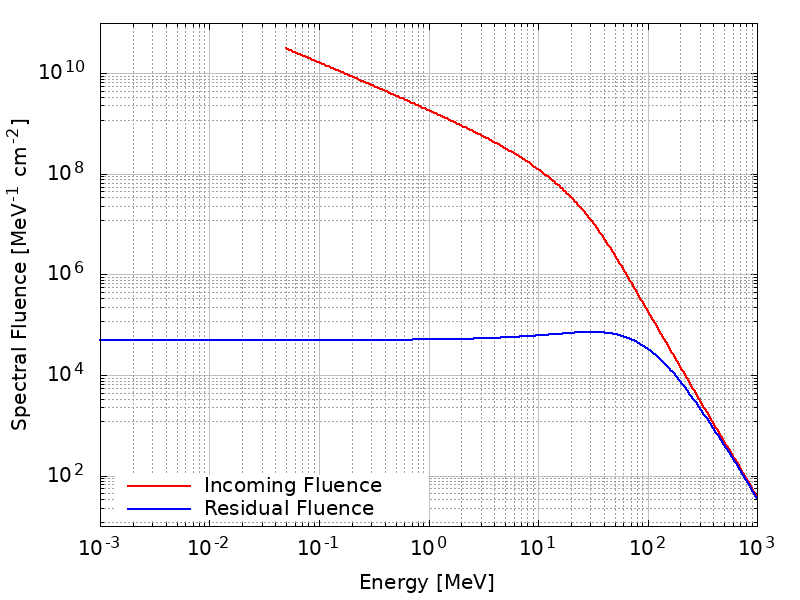

----------------------------------------
RISULTATI DOSIMETRICI (Geometria Sferica)
Dose totale in Silicio: 1.956e-02 Gy
Dose totale in Silicio: 19.556 mGy
----------------------------------------


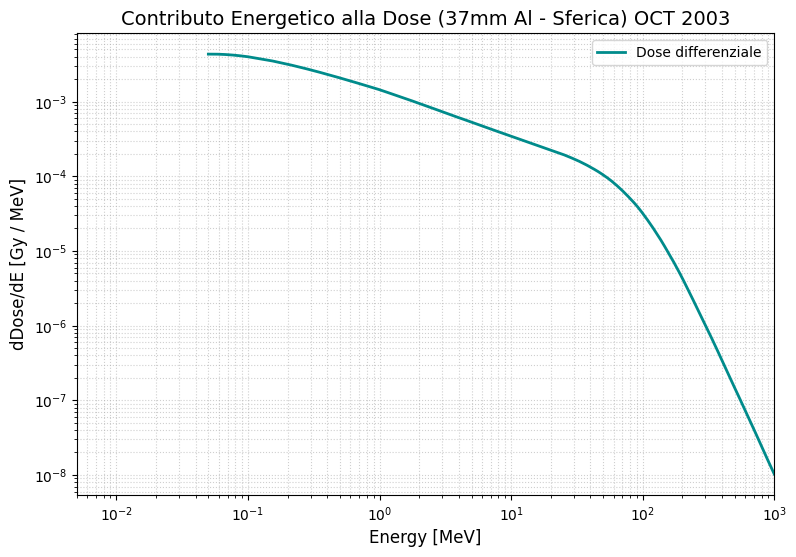

In [17]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt

# =========================================================
# 1) CARICA FLUENZA RESIDUA (Output SR-NIEL)
# =========================================================
# File generato dal calcolatore sferico (es. 37mm Al)
path_flu = "Simulazioni_SRNIEL/OCT2003/Spherical Shielding/37mmAl_residual_spherical_oct2003.txt"

df_flu = pd.read_csv(
    path_flu,
    sep=r"\s+",
    comment="#",
    skiprows=1,
    names=["E", "Phi_in", "Phi_res"]
)

# Taglio energetico coerente con la tabella SRIM (> 50 keV)
df_flu = df_flu[df_flu["E"] >= 0.05]

E = df_flu["E"].to_numpy()               # MeV
Phi = df_flu["Phi_res"].to_numpy()       # cm^-2 MeV^-1

# =========================================================
# 2) CARICA STOPPING POWER IN SILICIO (SRIM)
# =========================================================
path_S = "Simulazioni_SRNIEL/JAN2005/Spherical Shielding/stopping_power_Si_spherical.txt"

df_S = pd.read_csv(
    path_S,
    sep=r"\s+",
    comment="#",
    skiprows=1,
    names=["E", "S", "Dose_MeV_g", "Dose_Gy"]
)

# Rimuove duplicati e ordina per energia (fondamentale per np.interp)
df_S = df_S.drop_duplicates(subset="E").sort_values("E")

E_S = df_S["E"].to_numpy()   # MeV
S   = df_S["S"].to_numpy()   # MeV cm^2 g^-1

# =========================================================
# 3) INTERPOLAZIONE S(E) LOG-LOG (Metodo Fisicamente Corretto)
# =========================================================
# Utilizziamo lo spazio logaritmico per minimizzare l'errore sistematico
S_interp = 10**np.interp(np.log10(E), np.log10(E_S), np.log10(S))

# =========================================================
# 4) INTEGRAZIONE PER LA DOSE
# =========================================================
# Costante di conversione: 1.602e-10 (da MeV/g a J/kg ovvero Gray)
CONV_GY = 1.602e-10

# np.trapezoid calcola internamente i dE tra i punti del vettore E
dose_Gy = np.trapezoid(Phi * S_interp, E) * CONV_GY

print("-" * 40)
print(f"RISULTATI DOSIMETRICI (Geometria Sferica)")
print(f"Dose totale in Silicio: {dose_Gy:.3e} Gy")
print(f"Dose totale in Silicio: {dose_Gy*1e3:.3f} mGy")
print("-" * 40)

# =========================================================
# 5) VISUALIZZAZIONE dDose/dE (Contributo Energetico)
# =========================================================
dD_dE = Phi * S_interp * CONV_GY

plt.figure(figsize=(9, 6))
plt.loglog(E, dD_dE, color='darkcyan', lw=2, label='Dose differenziale')
plt.xlabel("Energy [MeV]", fontsize=12)
plt.ylabel("dDose/dE [Gy / MeV]", fontsize=12)
plt.xlim(0.005, 1000)
plt.title("Contributo Energetico alla Dose (37mm Al - Sferica) OCT 2003", fontsize=14)
plt.grid(True, which="both", ls=':', alpha=0.6)
plt.legend()
plt.show()

# INCERTEZZE PER SPHERICAL SHIELDING 37mm Al OCT 2003

In [19]:
import numpy as np
import pandas as pd

# ============================================================
# 1. CARICAMENTO DATI - HALLOWEEN OCT 2003
# ============================================================

# Carica le bande di incertezza incidenti (MC 16/84 - Sferica) generate dal fit Combined
df_band_inc = pd.read_csv(
    "Simulazioni_SRNIEL/OCT2003/Spherical Shielding/SRNIEL_input_Halloween2003_TOTAL_SPHERICAL_noPi_MC16_84.txt", 
    sep=r"\s+", skiprows=1, 
    names=["E", "Phi_16_inc", "Phi_84_inc"]
)

# Carica i risultati SR-NIEL della simulazione MEDIANA (37mm Al Sferica)
df_median_res = pd.read_csv(
    "Simulazioni_SRNIEL/OCT2003/Spherical Shielding/37mmAl_residual_spherical_oct2003.txt", 
    sep=r"\s+", comment="#", skiprows=1,
    names=["E", "Phi_in_med", "Phi_res_med"]
)

# Carica lo Stopping Power nel Silicio (Resta costante per entrambi gli eventi)
df_S = pd.read_csv(
    "Simulazioni_SRNIEL/JAN2005/Spherical Shielding/stopping_power_Si_spherical.txt",
    sep=r"\s+", comment="#", skiprows=1,
    names=["E", "S", "Dose_MeV_g", "Dose_Gy"]
).drop_duplicates(subset="E").sort_values("E")

E_S = df_S["E"].to_numpy()
S_val = df_S["S"].to_numpy()

# ============================================================
# 2. CALCOLO ATTENUAZIONE (Gestione Warning Divisione)
# ============================================================

E_srniel = df_median_res["E"].values

# Utilizziamo errstate per ignorare il warning della divisione per zero sulle alte energie
with np.errstate(divide='ignore', invalid='ignore'):
    attenuazione_raw = df_median_res["Phi_res_med"].values / df_median_res["Phi_in_med"].values
# Sostituiamo eventuali NaN o Inf derivanti dallo stop dei protoni a bassa energia
attenuazione_raw = np.nan_to_num(attenuazione_raw, nan=0.0, posinf=0.0)

# Mappiamo l'attenuazione sulla griglia target Monte Carlo (300 punti)
E_target = df_band_inc["E"].values
attenuazione_interp = np.interp(E_target, E_srniel, attenuazione_raw)

# ============================================================
# 3. PROPAGAZIONE INCERTEZZA (Fit MC + SRIM 5%)
# ============================================================

# Ricalcolo Stopping Power sulla griglia E_target (Log-Log) per massima precisione
S_MC_grid = 10**np.interp(np.log10(E_target), np.log10(E_S), np.log10(S_val))

CONV_GY = 1.602e-10

# Limite Inferiore: Fluenza 16% * Stopping Power al 95% (-5% incertezza modello)
phi_16_res = df_band_inc["Phi_16_inc"].values * attenuazione_interp
dose_16_mGy = np.trapezoid(phi_16_res * (S_MC_grid * 0.95), E_target) * CONV_GY * 1e3

# Limite Superiore: Fluenza 84% * Stopping Power al 105% (+5% incertezza modello)
phi_84_res = df_band_inc["Phi_84_inc"].values * attenuazione_interp
dose_84_mGy = np.trapezoid(phi_84_res * (S_MC_grid * 1.05), E_target) * CONV_GY * 1e3

# Dose mediana ottenuta dalla cella precedente per OCT 2003
dose_mediana_mGy = 19.556 

print("-" * 60)
print(f"ANALISI INCERTEZZA DOSE - EVENTO SEP OCT 2003")
print(f"Configurazione: 37mm Al, Geometria Sferica (10 g/cm²)")
print(f"Dose Mediana Integrale: {dose_mediana_mGy:.3f} mGy")
print(f"Intervallo 68% CL (Fit + 5% SRIM): [{dose_16_mGy:.2f} - {dose_84_mGy:.2f}] mGy")
print(f"Incertezza Totale: +{dose_84_mGy - dose_mediana_mGy:.2f} / -{dose_mediana_mGy - dose_16_mGy:.2f} mGy")
print("-" * 60)

------------------------------------------------------------
ANALISI INCERTEZZA DOSE - EVENTO SEP OCT 2003
Configurazione: 37mm Al, Geometria Sferica (10 g/cm²)
Dose Mediana Integrale: 19.556 mGy
Intervallo 68% CL (Fit + 5% SRIM): [15.24 - 24.97] mGy
Incertezza Totale: +5.42 / -4.32 mGy
------------------------------------------------------------


# QUALCHE PLOT PER SPHERICAL SHIELDING 37mm Al OCT 2003

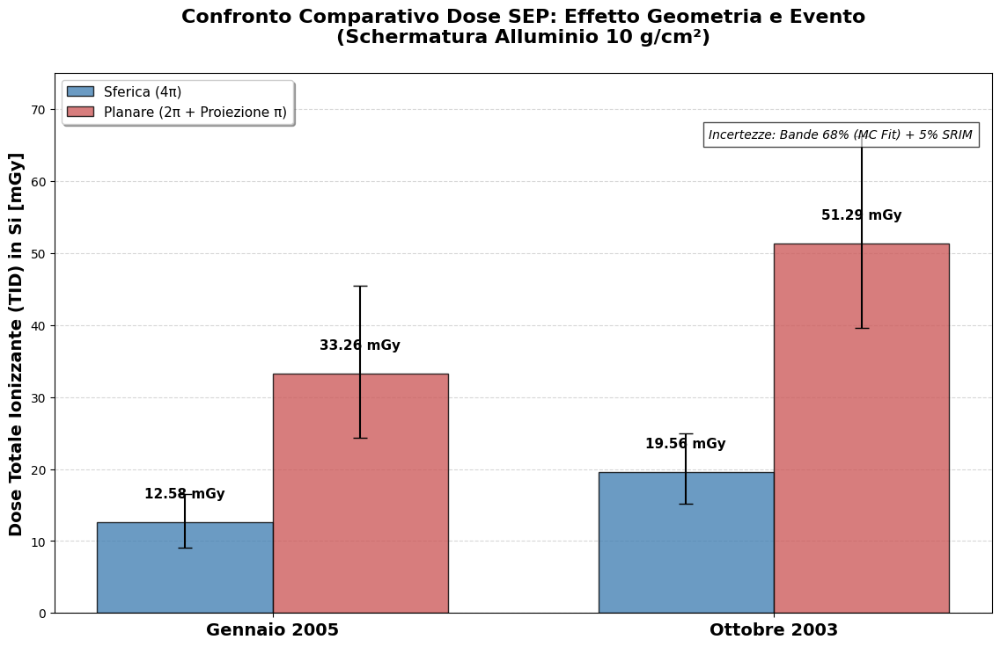

In [21]:
import matplotlib.pyplot as plt
import numpy as np

# ============================================================
# DATI RIASSUNTIVI FINALI (TID @ 10 g/cm2 Al)
# ============================================================

labels = ['Gennaio 2005', 'Ottobre 2003']

# Dati Sferici (Mediana, Errore Inferiore, Errore Superiore)
dose_sph = [12.579, 19.556]
err_sph_lo = [3.536, 4.32]  
err_sph_hi = [3.910, 5.42]

# Dati Planari (Mediana, Errore Inferiore, Errore Superiore)
dose_pla = [33.256, 51.286]
err_pla_lo = [8.92, 11.69]
err_pla_hi = [12.24, 14.97]

x = np.arange(len(labels))  # Posizione dei gruppi
width = 0.35                # Larghezza barre

fig, ax = plt.subplots(figsize=(12, 8))

# 1. Barre Geometria Sferica
rects1 = ax.bar(x - width/2, dose_sph, width, label='Sferica (4π)', 
                color='steelblue', edgecolor='black', alpha=0.8,
                yerr=[err_sph_lo, err_sph_hi], capsize=6, error_kw={'elinewidth':1.5})

# 2. Barre Geometria Planare
rects2 = ax.bar(x + width/2, dose_pla, width, label='Planare (2π + Proiezione π)', 
                color='indianred', edgecolor='black', alpha=0.8,
                yerr=[err_pla_lo, err_pla_hi], capsize=6, error_kw={'elinewidth':1.5})

# Personalizzazione Assi e Titoli
ax.set_ylabel('Dose Totale Ionizzante (TID) in Si [mGy]', fontsize=14, fontweight='bold')
ax.set_title('Confronto Comparativo Dose SEP: Effetto Geometria e Evento\n(Schermatura Alluminio 10 g/cm²)', 
             fontsize=16, pad=25, fontweight='bold')
ax.set_xticks(x)
ax.set_xticklabels(labels, fontsize=14, fontweight='bold')
ax.set_ylim(0, 75) # Aumentato per far spazio alle etichette sopra le barre

# Legenda e Nota Tecnica
ax.legend(fontsize=11, loc='upper left', frameon=True, shadow=True)
plt.text(0.98, 0.88, "Incertezze: Bande 68% (MC Fit) + 5% SRIM", 
         transform=ax.transAxes, fontsize=10, style='italic', 
         bbox={'facecolor':'white', 'alpha':0.7, 'pad':5}, ha='right')

ax.grid(axis='y', linestyle='--', alpha=0.5)
ax.set_axisbelow(True)

# Aggiunta etichette valori sopra le barre
def autolabel(rects):
    for rect in rects:
        height = rect.get_height()
        ax.annotate(f'{height:.2f} mGy',
                    xy=(rect.get_x() + rect.get_width() / 2, height),
                    xytext=(0, 18), # Spostato più in alto rispetto all'errore
                    textcoords="offset points",
                    ha='center', va='bottom', fontsize=11, fontweight='bold')

autolabel(rects1)
autolabel(rects2)

plt.tight_layout(pad=3.0) # Aumenta il padding globale
plt.show()

C:\Users\stefa\AppData\Local\Temp\ipykernel_10952\2023889630.py:43: UserWarning: Attempt to set non-positive xlim on a log-scaled axis will be ignored.
  plt.xlim(0, 1500) # Lo schermo taglia tutto sotto i ~50 MeV


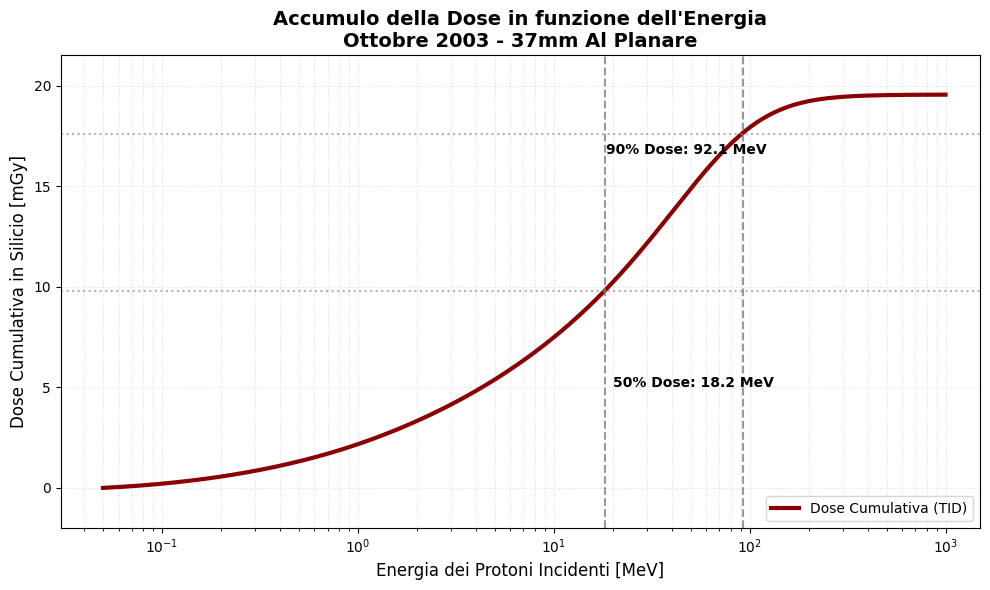

In [28]:
import numpy as np
import matplotlib.pyplot as plt

# ============================================================
# DATI DA CELLA PRECEDENTE (OCT 2003 - PLANARE 37mm)
# ============================================================
# E: Energia [MeV], dD_dE: Dose differenziale [Gy/MeV]
# Assicurati di aver runnato la cella che calcola dD_dE prima di questa

# Calcolo dell'integrale cumulativo (Dose in funzione dell'energia)
# Usiamo la regola del trapezio cumulativa per precisione
dose_integrale_cum = np.zeros_like(E)
for i in range(1, len(E)):
    dose_integrale_cum[i] = np.trapezoid(dD_dE[:i+1], E[:i+1])

# Conversione in mGy
dose_cum_mGy = dose_integrale_cum * 1e3
dose_finale = dose_cum_mGy[-1]

# Identificazione soglie energetiche (50% e 90% della dose)
e_50 = E[np.searchsorted(dose_cum_mGy, dose_finale * 0.50)]
e_90 = E[np.searchsorted(dose_cum_mGy, dose_finale * 0.90)]

# ============================================================
# PLOT ENERGIA vs DOSE CUMULATIVA
# ============================================================
plt.figure(figsize=(10, 6))
plt.semilogx(E, dose_cum_mGy, color='darkred', lw=3, label='Dose Cumulativa (TID)')

# Linee di soglia
plt.axhline(dose_finale * 0.50, color='gray', ls=':', alpha=0.6)
plt.axvline(e_50, color='gray', ls='--', alpha=0.8)
plt.text(e_50 * 1.1, 5, f'50% Dose: {e_50:.1f} MeV', color='black', fontsize=10, fontweight='bold')

plt.axhline(dose_finale * 0.90, color='gray', ls=':', alpha=0.6)
plt.axvline(e_90, color='gray', ls='--', alpha=0.8)
plt.text(e_90 * 0.2, dose_finale * 0.85, f'90% Dose: {e_90:.1f} MeV', color='black', fontsize=10, fontweight='bold')

# Styling
plt.title("Accumulo della Dose in funzione dell'Energia\nOttobre 2003 - 37mm Al Planare", fontsize=14, fontweight='bold')
plt.xlabel("Energia dei Protoni Incidenti [MeV]", fontsize=12)
plt.ylabel("Dose Cumulativa in Silicio [mGy]", fontsize=12)
plt.xlim(0, 1500) # Lo schermo taglia tutto sotto i ~50 MeV
plt.ylim(-2, dose_finale * 1.1)
plt.grid(True, which="both", ls=':', alpha=0.4)
plt.legend(loc='lower right')

plt.tight_layout()
plt.show()

# CELLA EXPORT PER SRNIEL OCT 2003 SFERICO (no pi) +  PLANARE (pi)  + MC incertezze


--- EVENTO UNICO 26 OCT – 02 NOV 2003 ---
Punti totali ACE+GOES: 48

Parametri fit Combined (evento unico):
A        = 2.825e+08
gamma_a = 0.92 ± 0.06
gamma_b = 3.40 ± 0.19
E0       = 9.9 ± 1.3 MeV
Ecut     = 5000 ± 25983 MeV


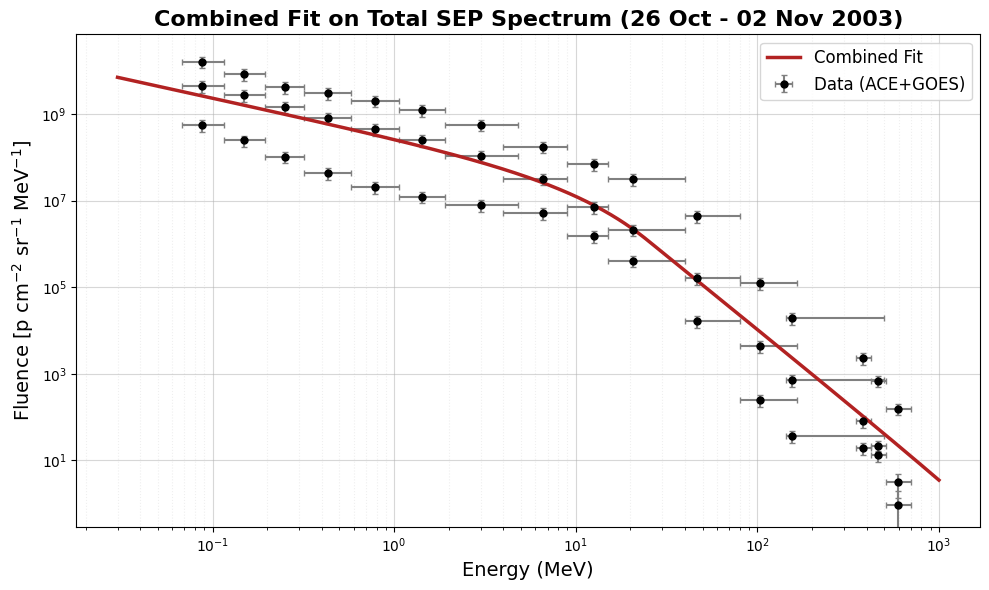


EXPORT SR-NIEL COMPLETATO
Sferica  → SRNIEL_Oct2003_TOTAL_SPHERICAL_MCmedian.txt  (NO π)
Planare  → SRNIEL_Oct2003_TOTAL_PLANAR_MCmedian_pi.txt (× π)
Metodo: FIT unico + Monte Carlo


In [28]:
# ============================================================
# EVENTO UNICO SEP OCT 2003
# FIT GLOBALE + MONTE CARLO + EXPORT SR-NIEL
# (METODO UNICO → cambia solo la geometria)
# ============================================================

import numpy as np

print("\n--- EVENTO UNICO 26 OCT – 02 NOV 2003 ---")

# ============================================================
# 1) COSTRUZIONE SPETTRO TOTALE (ACE + GOES, TUTTI I PUNTI)
# ============================================================

x_all, y_all, xl_all, xh_all = [], [], [], []

for evt in results_combined.values():
    x_all.append(evt['x'])
    y_all.append(evt['y'])
    xl_all.append(evt['x_err'][0])
    xh_all.append(evt['x_err'][1])

x_all = np.concatenate(x_all)
y_all = np.concatenate(y_all)
xl_all = np.concatenate(xl_all)
xh_all = np.concatenate(xh_all)

# ordinamento energetico
idx = np.argsort(x_all)
x_all = x_all[idx]
y_all = y_all[idx]
xl_all = xl_all[idx]
xh_all = xh_all[idx]

print(f"Punti totali ACE+GOES: {len(x_all)}")

# errore sistematico (come nel resto del lavoro)
y_err = np.maximum(0.30 * y_all, np.sqrt(y_all))

# ============================================================
# 2) FIT COMBINED (BAND × CUTOFF)
# ============================================================

p0 = [1e8, 1.2, 3.5, 20.0, 500.0]
bounds = ([0, 0.1, 0.5, 1.0, 50.0],
          [np.inf, 10.0, 10.0, 500.0, 5000.0])

popt, pcov = fit_log_space(
    combined_function,
    x_all,
    y_all,
    y_err,
    p0,
    bounds
)

if popt is None:
    raise RuntimeError("FIT FALLITO")

perr = np.sqrt(np.diag(pcov))

print("\nParametri fit Combined (evento unico):")
print(f"A        = {popt[0]:.3e}")
print(f"gamma_a = {popt[1]:.2f} ± {perr[1]:.2f}")
print(f"gamma_b = {popt[2]:.2f} ± {perr[2]:.2f}")
print(f"E0       = {popt[3]:.1f} ± {perr[3]:.1f} MeV")
print(f"Ecut     = {popt[4]:.0f} ± {perr[4]:.0f} MeV")


# Plot di FIT finale verifica
import matplotlib.pyplot as plt
x_fit = np.logspace(np.log10(0.03), np.log10(1000), 1000)
plt.figure(figsize=(10, 6))
plt.errorbar(x_all, y_all, yerr=y_err, xerr=[xl_all, xh_all],
             fmt='o', color='black', ecolor='gray', capsize=2, markersize=5, label='Data (ACE+GOES)')
plt.plot(x_fit, combined_function(x_fit, *popt), '-', color='firebrick', linewidth=2.5, label='Combined Fit')
plt.xscale('log'); plt.yscale('log')
plt.xlabel('Energy (MeV)', fontsize=14)
plt.ylabel(r'Fluence [p cm$^{-2}$ sr$^{-1}$ MeV$^{-1}$]', fontsize=14)
plt.title('Combined Fit on Total SEP Spectrum (26 Oct - 02 Nov 2003)', fontsize=16, fontweight='bold')
plt.grid(True, which="major", alpha=0.5)
plt.grid(True, which="minor", alpha=0.2, linestyle=':')
plt.legend(fontsize=12)
plt.tight_layout()
plt.show()


# ============================================================
# 3) MONTE CARLO SUI PARAMETRI DEL FIT
# ============================================================

E_grid = np.logspace(np.log10(0.04), np.log10(1000.0), 500)

N_MC = 800
rng = np.random.default_rng(42)

Phi_MC = []

for _ in range(N_MC):
    p_mc = rng.multivariate_normal(popt, pcov)
    phi = combined_function(E_grid, *p_mc)
    Phi_MC.append(np.where(phi > 0, phi, 1e-40))

Phi_MC = np.array(Phi_MC)

Phi_med = np.median(Phi_MC, axis=0)
Phi_lo  = np.percentile(Phi_MC, 16, axis=0)
Phi_hi  = np.percentile(Phi_MC, 84, axis=0)

# ============================================================
# 4) EXPORT SR-NIEL — GEOMETRIA SFERICA (ISOTROPA)
# ============================================================

out_sph = "SRNIEL_Oct2003_TOTAL_SPHERICAL_MCmedian.txt"

np.savetxt(
    out_sph,
    np.column_stack([E_grid, Phi_med]),
    fmt="%.6e",
    header="Energy(MeV)   SpectralFluence(cm^-2 MeV^-1)",
    comments=""
)

# ============================================================
# 5) EXPORT SR-NIEL — GEOMETRIA PLANARE (× π)
# ============================================================

out_plan = "SRNIEL_Oct2003_TOTAL_PLANAR_MCmedian_pi.txt"

np.savetxt(
    out_plan,
    np.column_stack([E_grid, np.pi * Phi_med]),
    fmt="%.6e",
    header="Energy(MeV)   SpectralFluence(cm^-2 MeV^-1)",
    comments=""
)

print("\n==============================================")
print("EXPORT SR-NIEL COMPLETATO")
print(f"Sferica  → {out_sph}  (NO π)")
print(f"Planare  → {out_plan} (× π)")
print("Metodo: FIT unico + Monte Carlo")
print("==============================================")


# 1° CELLA EXPORT PER SRNIEL OCT2003- SCHERMATURA PLANARE $\pi$

In [22]:
# ============================================================
# 7. SPETTRO TOTALE (26 OCT – 02 NOV 2003) + FIT + EXPORT SR-NIEL
#    (REPLICA IDENTICA DEL CASO JAN 2005)
# ============================================================

print("\n--- COSTRUZIONE SPETTRO TOTALE OCT 2003 ---")

# Intervallo TOTALE per la dose (come usato nello studio Halloween)
t0_tot = "2003-10-26 18:00:00"
t1_tot = "2003-11-02 00:00:00"

# Slice temporale
df_g_tot = df_corrected_GOES.loc[t0_tot:t1_tot]
df_a_tot = df_ace_corr.loc[t0_tot:t1_tot]

# dt reali (5 min nominali)
dt_g_tot = df_g_tot.index.to_series().diff().dt.total_seconds().fillna(300.0)
dt_a_tot = df_a_tot.index.to_series().diff().dt.total_seconds().fillna(300.0)

flu_tot = []
ene_tot = []
xerr_l_tot = []
xerr_h_tot = []

# ------------------------------------------------------------
# ACE (basse energie)
# ------------------------------------------------------------
for ch, (Emin, Emax) in ace_bins.items():
    if ch not in df_a_tot.columns:
        continue

    flux = df_a_tot[ch].fillna(0).clip(lower=0)
    flu = (flux * dt_a_tot).sum()

    if flu <= 0:
        continue

    Eeff = ace_eff[ch]

    flu_tot.append(flu)
    ene_tot.append(Eeff)
    xerr_l_tot.append(Eeff - Emin)
    xerr_h_tot.append(Emax - Eeff)

# ------------------------------------------------------------
# GOES (medie + alte energie)
# ------------------------------------------------------------
for ch, (Emin, Emax) in goes_bins.items():
    if ch not in df_g_tot.columns:
        continue

    flux = df_g_tot[ch].fillna(0).clip(lower=0)
    flu = (flux * dt_g_tot).sum()

    if flu <= 0:
        continue

    Eeff = goes_eff[ch]

    flu_tot.append(flu)
    ene_tot.append(Eeff)
    xerr_l_tot.append(Eeff - Emin)
    xerr_h_tot.append(Emax - Eeff)

# ------------------------------------------------------------
# Array + ordinamento energetico
# ------------------------------------------------------------
ene_tot = np.array(ene_tot)
flu_tot = np.array(flu_tot)
xerr_l_tot = np.array(xerr_l_tot)
xerr_h_tot = np.array(xerr_h_tot)

idx = np.argsort(ene_tot)
ene_tot = ene_tot[idx]
flu_tot = flu_tot[idx]
xerr_l_tot = xerr_l_tot[idx]
xerr_h_tot = xerr_h_tot[idx]

print(f"Spettro totale: {len(ene_tot)} punti (ACE + GOES)")

# ============================================================
# FIT COMBINED SULLO SPETTRO TOTALE
# ============================================================

print("\n--- FIT COMBINED SU SPETTRO TOTALE (OCT 2003) ---")

y_err_tot = flu_tot * 0.30  # errore sistematico 30%

p0_tot = [1e8, 1.5, 3.5, 20.0, 500.0]
bounds_tot = ([0, 0.1, 0.5, 1.0, 50.0],
              [np.inf, 6.0, 10.0, 500.0, 5000.0])

popt_tot, pcov_tot = fit_log_space(
    combined_function,
    ene_tot,
    flu_tot,
    y_err_tot,
    p0_tot,
    bounds_tot
)

if popt_tot is None:
    raise RuntimeError("FIT COMBINED FALLITO sullo spettro totale OCT 2003.")

print("Parametri fit Combined (spettro totale OCT 2003):")
print(f"A        = {popt_tot[0]:.3e}")
print(f"gamma_a = {popt_tot[1]:.2f}")
print(f"gamma_b = {popt_tot[2]:.2f}")
print(f"E0       = {popt_tot[3]:.2f} MeV")
print(f"Ecut     = {popt_tot[4]:.1f} MeV")

# ============================================================
# EXPORT FILE PER SR-NIEL (IDENTICO A JAN 2005)
# ============================================================

print("\n--- EXPORT FILE PER SR-NIEL ---")

E_export = np.logspace(np.log10(0.05), np.log10(1000.0), 300)  # MeV

# IDENTICO A JAN 2005: moltiplico per π
Phi_export = np.pi * combined_function(E_export, *popt_tot)

Phi_export = np.where(Phi_export > 0, Phi_export, 1e-40)

out_file = "SRNIEL_input_SEP_Oct2003_TOTAL_26Oct_02Nov_pi.txt"

np.savetxt(
    out_file,
    np.column_stack([E_export, Phi_export]),
    fmt="%.6e",
    header="Energy(MeV)   SpectralFluence(cm^-2 MeV^-1)",
    comments=""
)

print(f"File SR-NIEL pronto: {out_file}")



--- COSTRUZIONE SPETTRO TOTALE OCT 2003 ---
Spettro totale: 16 punti (ACE + GOES)

--- FIT COMBINED SU SPETTRO TOTALE (OCT 2003) ---
Parametri fit Combined (spettro totale OCT 2003):
A        = 1.987e+09
gamma_a = 0.93
gamma_b = 3.68
E0       = 16.13 MeV
Ecut     = 5000.0 MeV

--- EXPORT FILE PER SR-NIEL ---
File SR-NIEL pronto: SRNIEL_input_SEP_Oct2003_TOTAL_26Oct_02Nov_pi.txt


<>:67: SyntaxWarning: invalid escape sequence '\c'
<>:67: SyntaxWarning: invalid escape sequence '\c'
C:\Users\stefa\AppData\Local\Temp\ipykernel_19788\2025312425.py:67: SyntaxWarning: invalid escape sequence '\c'
  + f"\nCombined fit, $\chi^2_\\nu = {chi2_red:.2f}$",



--- CONTROLLO FIT SPETTRO TOTALE OCT 2003 ---
Chi^2 = 19.48
Ndof  = 11
Chi^2 ridotto = 1.77


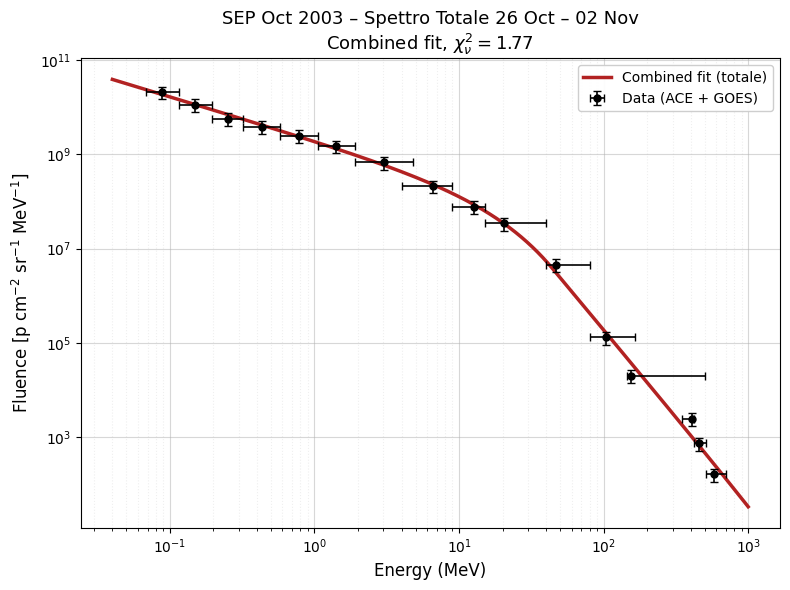

In [26]:
# PLOT CONTROLLO 
# ============================================================
# 8. PLOT DI CONTROLLO FIT TOTALE + CHI^2 RIDOTTO (OCT 2003)
# ============================================================

print("\n--- CONTROLLO FIT SPETTRO TOTALE OCT 2003 ---")

# Asse energetico per il modello
E_model = np.logspace(np.log10(0.04), np.log10(1000.0), 1000)

# Modello best-fit
Phi_model = combined_function(E_model, *popt_tot)

# Errore sui dati (come nel fit)
y_err_tot = flu_tot * 0.30

# =========================
# Calcolo CHI^2 ridotto
# =========================
Phi_fit_at_data = combined_function(ene_tot, *popt_tot)
Phi_fit_at_data = np.where(Phi_fit_at_data > 0, Phi_fit_at_data, 1e-40)

residuals = (flu_tot - Phi_fit_at_data) / y_err_tot
chi2 = np.sum(residuals**2)
ndof = len(flu_tot) - len(popt_tot)
chi2_red = chi2 / ndof

print(f"Chi^2 = {chi2:.2f}")
print(f"Ndof  = {ndof}")
print(f"Chi^2 ridotto = {chi2_red:.2f}")

# =========================
# PLOT
# =========================
plt.figure(figsize=(8, 6))

plt.errorbar(
    ene_tot,
    flu_tot,
    yerr=y_err_tot,
    xerr=[np.abs(xerr_l_tot), np.abs(xerr_h_tot)],
    fmt="o",
    color="black",
    ecolor="black",
    capsize=3,
    elinewidth=1.2,
    markersize=5,
    label="Data (ACE + GOES)",
    zorder=10
)

plt.plot(
    E_model,
    Phi_model,
    "-",
    color="firebrick",
    linewidth=2.5,
    label="Combined fit (totale)"
)

plt.xscale("log")
plt.yscale("log")
plt.xlabel("Energy (MeV)", fontsize=12)
plt.ylabel(r"Fluence [p cm$^{-2}$ sr$^{-1}$ MeV$^{-1}$]", fontsize=12)
plt.title(
    r"SEP Oct 2003 – Spettro Totale 26 Oct – 02 Nov"
    + f"\nCombined fit, $\chi^2_\\nu = {chi2_red:.2f}$",
    fontsize=13
)

plt.grid(True, which="major", alpha=0.5)
plt.grid(True, which="minor", alpha=0.2, linestyle=":")

plt.legend(framealpha=0.95)
plt.tight_layout()
plt.show()


# CELLA EXPORT PER SRNIEL OCT2003 - SPHERICAL non moltiplico per nessun angolo solido

In [ ]:
# ============================================================
# 7. SPETTRO TOTALE (26 OCT – 02 NOV 2003) + FIT + EXPORT SR-NIEL
#    (REPLICA IDENTICA DEL CASO JAN 2005)
# ============================================================




print("\n--- COSTRUZIONE SPETTRO TOTALE OCT 2003 ---")

# Intervallo TOTALE per la dose (come usato nello studio Halloween)
t0_tot = "2003-10-26 18:00:00"
t1_tot = "2003-11-02 00:00:00"

# Slice temporale
df_g_tot = df_corrected_GOES.loc[t0_tot:t1_tot]
df_a_tot = df_ace_corr.loc[t0_tot:t1_tot]

# dt reali (5 min nominali)
dt_g_tot = df_g_tot.index.to_series().diff().dt.total_seconds().fillna(300.0)
dt_a_tot = df_a_tot.index.to_series().diff().dt.total_seconds().fillna(300.0)

flu_tot = []
ene_tot = []
xerr_l_tot = []
xerr_h_tot = []

# ------------------------------------------------------------
# ACE (basse energie)
# ------------------------------------------------------------
for ch, (Emin, Emax) in ace_bins.items():
    if ch not in df_a_tot.columns:
        continue

    flux = df_a_tot[ch].fillna(0).clip(lower=0)
    flu = (flux * dt_a_tot).sum()

    if flu <= 0:
        continue

    Eeff = ace_eff_map[ch]

    flu_tot.append(flu)
    ene_tot.append(Eeff)
    xerr_l_tot.append(Eeff - Emin)
    xerr_h_tot.append(Emax - Eeff)

# ------------------------------------------------------------
# GOES (medie + alte energie)
# ------------------------------------------------------------
for ch, (Emin, Emax) in channel_bins.items():
    if ch not in df_g_tot.columns:
        continue

    flux = df_g_tot[ch].fillna(0).clip(lower=0)
    flu = (flux * dt_g_tot).sum()

    if flu <= 0:
        continue

    Eeff = e_eff_map[ch]

    flu_tot.append(flu)
    ene_tot.append(Eeff)
    xerr_l_tot.append(Eeff - Emin)
    xerr_h_tot.append(Emax - Eeff)

# ------------------------------------------------------------
# Array + ordinamento energetico
# ------------------------------------------------------------
ene_tot = np.array(ene_tot)
flu_tot = np.array(flu_tot)
xerr_l_tot = np.array(xerr_l_tot)
xerr_h_tot = np.array(xerr_h_tot)

idx = np.argsort(ene_tot)
ene_tot = ene_tot[idx]
flu_tot = flu_tot[idx]
xerr_l_tot = xerr_l_tot[idx]
xerr_h_tot = xerr_h_tot[idx]

print(f"Spettro totale: {len(ene_tot)} punti (ACE + GOES)")

# ============================================================
# FIT COMBINED SULLO SPETTRO TOTALE
# ============================================================

print("\n--- FIT COMBINED SU SPETTRO TOTALE (OCT 2003) ---")

y_err_tot = flu_tot * 0.30  # errore sistematico 30%

p0_tot = [1e8, 1.5, 3.5, 20.0, 500.0]
bounds_tot = ([0, 0.1, 0.5, 1.0, 50.0],
              [np.inf, 6.0, 10.0, 500.0, 5000.0])

popt_tot, pcov_tot = fit_log_space(
    combined_function,
    ene_tot,
    flu_tot,
    y_err_tot,
    p0_tot,
    bounds_tot
)

if popt_tot is None:
    raise RuntimeError("FIT COMBINED FALLITO sullo spettro totale OCT 2003.")

print("Parametri fit Combined (spettro totale OCT 2003):")
print(f"A        = {popt_tot[0]:.3e}")
print(f"gamma_a = {popt_tot[1]:.2f}")
print(f"gamma_b = {popt_tot[2]:.2f}")
print(f"E0       = {popt_tot[3]:.2f} MeV")
print(f"Ecut     = {popt_tot[4]:.1f} MeV")




# ============================================================
# EXPORT FILE PER SR-NIEL (IDENTICO A JAN 2005)
# ============================================================

print("\n--- EXPORT FILE PER SR-NIEL ---")

E_export = np.logspace(np.log10(0.05), np.log10(1000.0), 300)  # MeV

# Non moltiplico per nessun angolo 
Phi_export = combined_function(E_export, *popt_tot)

Phi_export = np.where(Phi_export > 0, Phi_export, 1e-40)

out_file = "SRNIEL_input_SEP_Oct2003_TOTAL_26Oct_02Nov_Spherical_nopi.txt"

np.savetxt(
    out_file,
    np.column_stack([E_export, Phi_export]),
    fmt="%.6e",
    header="Energy(MeV)   SpectralFluence(cm^-2 MeV^-1)",
    comments=""
)

print(f"File SR-NIEL pronto: {out_file}")






--- COSTRUZIONE SPETTRO TOTALE OCT 2003 ---
Spettro totale: 13 punti (ACE + GOES)

--- FIT COMBINED SU SPETTRO TOTALE (OCT 2003) ---
Parametri fit Combined (spettro totale OCT 2003):
A        = 1.072e+09
gamma_a = 0.97
gamma_b = 8.09
E0       = 32.38 MeV
Ecut     = 109.5 MeV

--- EXPORT FILE PER SR-NIEL ---
File SR-NIEL pronto: SRNIEL_input_SEP_Oct2003_TOTAL_26Oct_02Nov_Spherical_nopi.txt


# CELLA EXPORT SRNIEL sferico + MC incertezze


--- COSTRUZIONE SPETTRO TOTALE OCT 2003 ---
Spettro totale: 13 punti (ACE + GOES)

--- FIT COMBINED SU SPETTRO TOTALE (OCT 2003) ---
A=1.07e+09, γa=0.97, γb=8.09, E0=32.4 MeV, Ecut=110 MeV


C:\Users\stefa\AppData\Local\Temp\ipykernel_7036\1355246668.py:103: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  np.where(combined_function(E_export, *rng.multivariate_normal(popt_tot, pcov_tot)) > 0,
C:\Users\stefa\AppData\Local\Temp\ipykernel_7036\1355246668.py:104: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  combined_function(E_export, *rng.multivariate_normal(popt_tot, pcov_tot)),


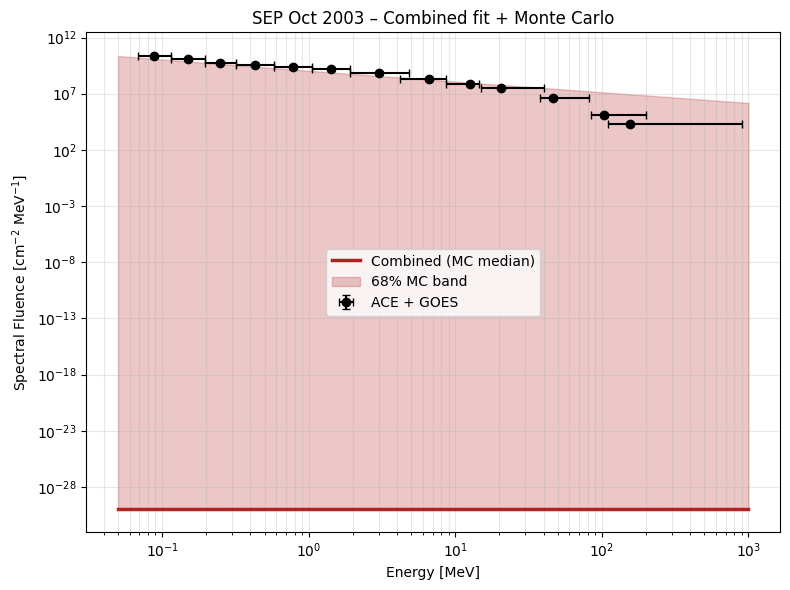

File SR-NIEL pronto (MC median): SRNIEL_input_SEP_Oct2003_TOTAL_Spherical_MCmedian.txt


In [27]:
# ============================================================
# 7. SPETTRO TOTALE (26 OCT – 02 NOV 2003)
#    FIT COMBINED + MONTE CARLO + EXPORT SR-NIEL (SPHERICAL)
# ============================================================

print("\n--- COSTRUZIONE SPETTRO TOTALE OCT 2003 ---")

# ------------------------------------------------------------
# Intervallo temporale totale
# ------------------------------------------------------------
t0_tot = "2003-10-26 18:00:00"
t1_tot = "2003-11-02 00:00:00"

df_g_tot = df_corrected_GOES.loc[t0_tot:t1_tot]
df_a_tot = df_ace_corr.loc[t0_tot:t1_tot]

dt_g_tot = df_g_tot.index.to_series().diff().dt.total_seconds().fillna(300.0)
dt_a_tot = df_a_tot.index.to_series().diff().dt.total_seconds().fillna(300.0)

flu_tot, ene_tot, xerr_l_tot, xerr_h_tot = [], [], [], []

# ------------------------------------------------------------
# ACE (basse energie)
# ------------------------------------------------------------
for ch, (Emin, Emax) in ace_bins.items():
    if ch not in df_a_tot.columns:
        continue
    flu = (df_a_tot[ch].fillna(0).clip(lower=0) * dt_a_tot).sum()
    if flu <= 0:
        continue
    Eeff = ace_eff_map[ch]
    flu_tot.append(flu)
    ene_tot.append(Eeff)
    xerr_l_tot.append(Eeff - Emin)
    xerr_h_tot.append(Emax - Eeff)

# ------------------------------------------------------------
# GOES (medie + alte energie)
# ------------------------------------------------------------
for ch, (Emin, Emax) in channel_bins.items():
    if ch not in df_g_tot.columns:
        continue
    flu = (df_g_tot[ch].fillna(0).clip(lower=0) * dt_g_tot).sum()
    if flu <= 0:
        continue
    Eeff = e_eff_map[ch]
    flu_tot.append(flu)
    ene_tot.append(Eeff)
    xerr_l_tot.append(Eeff - Emin)
    xerr_h_tot.append(Emax - Eeff)

# ------------------------------------------------------------
# Array ordinati
# ------------------------------------------------------------
ene_tot = np.array(ene_tot)
flu_tot = np.array(flu_tot)
xerr_l_tot = np.array(xerr_l_tot)
xerr_h_tot = np.array(xerr_h_tot)

idx = np.argsort(ene_tot)
ene_tot, flu_tot = ene_tot[idx], flu_tot[idx]
xerr_l_tot, xerr_h_tot = xerr_l_tot[idx], xerr_h_tot[idx]

print(f"Spettro totale: {len(ene_tot)} punti (ACE + GOES)")

# ============================================================
# FIT COMBINED
# ============================================================

print("\n--- FIT COMBINED SU SPETTRO TOTALE (OCT 2003) ---")

y_err_tot = flu_tot * 0.30

p0_tot = [1e8, 1.5, 3.5, 20.0, 500.0]
bounds_tot = ([0, 0.1, 0.5, 1.0, 50.0],
              [np.inf, 6.0, 10.0, 500.0, 5000.0])

popt_tot, pcov_tot = fit_log_space(
    combined_function,
    ene_tot,
    flu_tot,
    y_err_tot,
    p0_tot,
    bounds_tot
)

if popt_tot is None:
    raise RuntimeError("FIT COMBINED FALLITO")

print(f"A={popt_tot[0]:.2e}, γa={popt_tot[1]:.2f}, γb={popt_tot[2]:.2f}, "
      f"E0={popt_tot[3]:.1f} MeV, Ecut={popt_tot[4]:.0f} MeV")

# ============================================================
# MONTE CARLO SUI PARAMETRI DEL FIT
# ============================================================

N_MC = 300
rng = np.random.default_rng(42)

E_export = np.logspace(np.log10(0.05), np.log10(1000.0), 300)

Phi_MC = np.array([
    np.where(combined_function(E_export, *rng.multivariate_normal(popt_tot, pcov_tot)) > 0,
             combined_function(E_export, *rng.multivariate_normal(popt_tot, pcov_tot)),
             1e-40)
    for _ in range(N_MC)
])

Phi_med  = np.median(Phi_MC, axis=0)
Phi_low  = np.percentile(Phi_MC, 16, axis=0)
Phi_high = np.percentile(Phi_MC, 84, axis=0)

# ============================================================
# PLOT DI VERIFICA FIT + MONTE CARLO
# ============================================================

plt.figure(figsize=(8,6))

plt.errorbar(
    ene_tot, flu_tot,
    yerr=y_err_tot,
    xerr=[xerr_l_tot, xerr_h_tot],
    fmt='o', color='black', capsize=3, label='ACE + GOES'
)

plt.plot(E_export, Phi_med, color='firebrick', lw=2.5, label='Combined (MC median)')
plt.fill_between(E_export, Phi_low, Phi_high,
                 color='firebrick', alpha=0.25, label='68% MC band')

plt.xscale('log'); plt.yscale('log')
plt.xlabel("Energy [MeV]")
plt.ylabel(r"Spectral Fluence [cm$^{-2}$ MeV$^{-1}$]")
plt.title("SEP Oct 2003 – Combined fit + Monte Carlo")
plt.grid(True, which='both', alpha=0.3)
plt.legend()
plt.tight_layout()
plt.show()

# ============================================================
# EXPORT PER SR-NIEL (SPHERICAL, NO PI)
# ============================================================

out_file = "SRNIEL_input_SEP_Oct2003_TOTAL_Spherical_MCmedian.txt"

np.savetxt(
    out_file,
    np.column_stack([E_export, Phi_med]),
    fmt="%.6e",
    header="Energy(MeV)   SpectralFluence(cm^-2 MeV^-1)",
    comments=""
)

print(f"File SR-NIEL pronto (MC median): {out_file}")


# Cella per tabella per SRNIEL

In [12]:
# ============================================================
# SR-NIEL INPUT FILE
# Residual Spectral Fluence - Halloween 2003 SEP
# Band model (ACE + GOES)
# Geometry: planar slab, hemispherical incidence (2π)
# ============================================================

import numpy as np

# ------------------------
# PARAMETRI
# ------------------------
E_MIN = 0.04      # MeV (lower fit limit)
E_MAX = 1000.0    # MeV
N_E   = 500       # punti energetici (log-spaced)
SOLID_ANGLE = 2 * np.pi   # slab planare → 2π

# ------------------------
# GRIGLIA ENERGETICA
# ------------------------
E_grid = np.logspace(np.log10(E_MIN), np.log10(E_MAX), N_E)

# ------------------------
# SOMMA CONTRIBUTI EVENTI
# (Precursore + Main + Tail)
# ------------------------
Phi_total_sr = np.zeros_like(E_grid)

for evt_name, popt_band, pcov_band in params_band_list:
    A, ga, gb, E0 = popt_band
    
    Phi_evt = band_function(E_grid, A, ga, gb, E0)
    Phi_evt = np.maximum(Phi_evt, 1e-40)  # sicurezza numerica
    
    Phi_total_sr += Phi_evt

# ------------------------
# CONVERSIONE SR → SLAB
# ------------------------
Phi_total = SOLID_ANGLE * Phi_total_sr   # [cm^-2 MeV^-1]

# ------------------------
# SCRITTURA FILE SR-NIEL
# ------------------------
output_file = "SRNIEL_Halloween2003_Band_2pi.txt"

with open(output_file, "w") as f:
    for E, Phi in zip(E_grid, Phi_total):
        f.write(f"{E:.6e}\t{Phi:.6e}\n")

print(f"File SR-NIEL pronto: {output_file}")
print("Formato: Energy [MeV]  Spectral Fluence [cm^-2 MeV^-1]")
print("Geometria: slab planare (2π)")
print(f"Range energetico: {E_MIN:.2f} – {E_MAX:.0f} MeV")


File SR-NIEL pronto: SRNIEL_Halloween2003_Band_2pi.txt
Formato: Energy [MeV]  Spectral Fluence [cm^-2 MeV^-1]
Geometria: slab planare (2π)
Range energetico: 0.04 – 1000 MeV


# RISULTATI PER SR-NIEL finali 

In [12]:
import numpy as np
import pandas as pd
import os

print("\n====== COSTRUZIONE FILE SR-NIEL — OCT 2003 (MODELLO BAND) ======\n")

# ============================================================
# 1) RECUPERO PARAMETRI BAND DEI TRHE SOTTO-EVENTI
# ============================================================

# Ogni elemento è una tupla: (event_name, popt_b, pcov_b)
params_precursor = params_band_list[0][1]  
params_main      = params_band_list[1][1]
params_tail      = params_band_list[2][1]

print("Parametri Band (solo numeri):")
print("  precursore:", params_precursor)
print("  main:      ", params_main)
print("  tail:      ", params_tail)

# ============================================================
# 2) MODELLO BAND
# ============================================================

def phi_band(E, A, ga, gb, E0):
    E = np.array(E)
    E_break = (gb - ga) * E0
    res = np.zeros_like(E)
    
    mask = E < E_break
    # ramo basso
    res[mask] = A * (E[mask]**(-ga)) * np.exp(-E[mask]/E0)

    # ramo alto
    norm = (E_break**(gb-ga)) * np.exp(ga-gb)
    res[~mask] = A * (E[~mask]**(-gb)) * norm

    return np.maximum(res, 1e-40)

# ============================================================
# 3) RANGE ENERGIA
# ============================================================
E_grid = np.logspace(-1, np.log10(2000), 500)


# ============================================================
# 4) CALCOLO SPETTRI
# ============================================================

phi_prec = phi_band(E_grid, *params_precursor)
phi_main = phi_band(E_grid, *params_main)
phi_tail = phi_band(E_grid, *params_tail)

phi_tot = phi_prec + phi_main + phi_tail

# ============================================================
# 5) ANGOLO (emisfera)
# ============================================================

Omega = np.pi
Phi_prec = phi_prec * Omega
Phi_main = phi_main * Omega
Phi_tail = phi_tail * Omega
Phi_tot  = phi_tot  * Omega

# ============================================================
# 6) OUTPUT
# ============================================================

outdir = "SRNIEL_OCT2003_BAND_2GeV_input"

os.makedirs(outdir, exist_ok=True)

def save_srniel(filename, E, Phi):
    path = os.path.join(outdir, filename)
    df = pd.DataFrame({"Energy_MeV": E, "Fluence_p_cm2_MeV": Phi})
    df.to_csv(path, sep=" ", header=False, index=False, float_format="%.6e")
    print("✔ Salvato:", path)

save_srniel("OCT2003_precursor_0p1_2000MeV.txt", E_grid, Phi_prec)
save_srniel("OCT2003_main_0p1_2000MeV.txt",      E_grid, Phi_main)
save_srniel("OCT2003_tail_0p1_2000MeV.txt",      E_grid, Phi_tail)
save_srniel("OCT2003_TOTAL_0p1_2000MeV.txt",     E_grid, Phi_tot)


print("\n>>> COMPLETATO! File nella cartella:", outdir)



====== COSTRUZIONE FILE SR-NIEL — OCT 2003 (MODELLO BAND) ======

Parametri Band (solo numeri):
  precursore: [3.25451885e+07 9.32591962e-01 3.41814301e+00 9.26518675e+00]
  main:       [1.58467993e+09 8.94869952e-01 3.72945492e+00 1.65863946e+01]
  tail:       [4.01570819e+08 9.84358905e-01 3.70185599e+00 9.03981315e+00]
✔ Salvato: SRNIEL_OCT2003_BAND_2GeV_input\OCT2003_precursor_0p1_2000MeV.txt
✔ Salvato: SRNIEL_OCT2003_BAND_2GeV_input\OCT2003_main_0p1_2000MeV.txt
✔ Salvato: SRNIEL_OCT2003_BAND_2GeV_input\OCT2003_tail_0p1_2000MeV.txt
✔ Salvato: SRNIEL_OCT2003_BAND_2GeV_input\OCT2003_TOTAL_0p1_2000MeV.txt

>>> COMPLETATO! File nella cartella: SRNIEL_OCT2003_BAND_2GeV_input


# Test estensione range energia fino a 2000 MeV protoni 



In [15]:
import numpy as np
import pandas as pd
import os

print("\n====== COSTRUZIONE FILE SR-NIEL — OCT 2003 (EXTENDED 0.1–2000 MeV) ======\n")

# ===============================
# 1) MODELLO BAND (già definito prima)
# ===============================
def phi_band(E, A, ga, gb, E0):
    E = np.array(E)
    E_break = (gb - ga) * E0
    res = np.zeros_like(E)

    mask = E < E_break
    res[mask] = A * (E[mask]**(-ga)) * np.exp(-E[mask]/E0)

    norm = (E_break**(gb-ga)) * np.exp(ga-gb)
    res[~mask] = A * (E[~mask]**(-gb)) * norm

    return np.maximum(res, 1e-40)

# ===============================
# 2) Recupero parametri Band
# ===============================
A_prec, ga_prec, gb_prec, E0_prec = params_band_list[0][1]
A_main, ga_main, gb_main, E0_main = params_band_list[1][1]
A_tail, ga_tail, gb_tail, E0_tail = params_band_list[2][1]

print("Parametri Band caricati correttamente.\n")

# ===============================
# 3) RANGE ENERGETICO ESTESO
# ===============================
E_ext = np.logspace(-1, np.log10(2000), 400)  # 0.1 MeV → 2000 MeV

# ===============================
# 4) Calcolo spettro totale
# ===============================
phi_prec = phi_band(E_ext, A_prec, ga_prec, gb_prec, E0_prec)
phi_main = phi_band(E_ext, A_main, ga_main, gb_main, E0_main)
phi_tail = phi_band(E_ext, A_tail, ga_tail, gb_tail, E0_tail)

phi_tot = phi_prec + phi_main + phi_tail

Phi_tot = phi_tot * 2*np.pi   # emisfera

# ===============================
# 5) Salvataggio
# ===============================
outdir = "SRNIEL_OCT2003_EXTENDED"
os.makedirs(outdir, exist_ok=True)

outfile = os.path.join(outdir, "OCT2003_TOTAL_0p1_2000MeV.txt")

df = pd.DataFrame({
    "Energy_MeV": E_ext,
    "Fluence_p_cm2_MeV": Phi_tot
})

df.to_csv(outfile, sep=" ", header=False, index=False, float_format="%.6e")

print("✔ Salvato file esteso:", outfile)

# ===============================
# 6) Stampa tabella preview
# ===============================
print("\nPrime 10 righe del file generato:")
print(df.head(10))



====== COSTRUZIONE FILE SR-NIEL — OCT 2003 (EXTENDED 0.1–2000 MeV) ======

Parametri Band caricati correttamente.

✔ Salvato file esteso: SRNIEL_OCT2003_EXTENDED\OCT2003_TOTAL_0p1_2000MeV.txt

Prime 10 righe del file generato:
   Energy_MeV  Fluence_p_cm2_MeV
0    0.100000       1.034946e+11
1    0.102513       1.011489e+11
2    0.105089       9.885598e+10
3    0.107730       9.661467e+10
4    0.110438       9.442382e+10
5    0.113213       9.228228e+10
6    0.116059       9.018894e+10
7    0.118975       8.814272e+10
8    0.121965       8.614255e+10
9    0.125030       8.418739e+10


# FINALE RIASSUNTI DATI PER SPENVIS ECC


In [66]:
import numpy as np
import pandas as pd
import scipy.integrate as integrate
from scipy.optimize import curve_fit
import os
import re

# ============================================================
# 0. CARTELLA DI OUTPUT
# ============================================================
OUTPUT_DIR = "SPENVIS_Halloween2003"
os.makedirs(OUTPUT_DIR, exist_ok=True)

# ============================================================
# 1. FUNZIONI SPETTRALI + FIT IN LOG-SPACE
# ============================================================

def ellison_ramaty(E, A, gamma, Er):
    E = np.maximum(np.asarray(E), 1e-10)
    return A * (E**(-gamma)) * np.exp(-E/Er)

def band_function(E, A, ga, gb, E0):
    E = np.asarray(E)
    scalar_input = False
    if E.ndim == 0:
        E = E[None]
        scalar_input = True

    E_break = (gb - ga) * E0
    if (gb <= ga) or (E_break <= 0):
        res = np.ones_like(E) * 1e-30
        return res[0] if scalar_input else res

    E = np.maximum(E, 1e-10)

    mask_low = E < E_break
    mask_high = ~mask_low
    res = np.zeros_like(E)

    if np.any(mask_low):
        res[mask_low] = A * (E[mask_low] ** -ga) * np.exp(-E[mask_low] / E0)

    if np.any(mask_high):
        norm = (E_break ** (gb - ga)) * np.exp(ga - gb)
        res[mask_high] = A * (E[mask_high] ** -gb) * norm

    return res[0] if scalar_input else res

def combined_function(E, A, ga, gb, E0, Er):
    return band_function(E, A, ga, gb, E0) * np.exp(-E/Er)

def fit_log_space(func, x, y, y_err, p0, bounds):
    """
    Fit in log10-space (come per JAN 2005) per non far dominare i punti low-E.
    """
    def log_model(x_in, *pars):
        val = func(x_in, *pars)
        return np.log10(np.maximum(val, 1e-30))

    sigma_log = y_err / (y * np.log(10))
    sigma_log = np.nan_to_num(sigma_log, nan=1.0, posinf=1.0, neginf=1.0)

    try:
        popt, pcov = curve_fit(
            log_model, x, np.log10(y),
            p0=p0, sigma=sigma_log,
            absolute_sigma=True, bounds=bounds,
            maxfev=20000
        )
        return popt, pcov
    except Exception:
        return None, None

def chi2_red(func, x, y, y_err, popt):
    """χ² ridotto in spazio lineare."""
    if popt is None:
        return np.inf
    model = func(x, *popt)
    mask = (y > 0) & (y_err > 0) & np.isfinite(model)
    if mask.sum() <= len(popt):
        return np.inf
    res = (y[mask] - model[mask]) / y_err[mask]
    chi2 = np.sum(res**2)
    dof = mask.sum() - len(popt)
    return chi2 / dof if dof > 0 else np.inf

def integrate_fluence(func, popt, Emin, Emax=2000.0):
    """Fluenza integrata sopra Emin [MeV]."""
    if popt is None:
        return 0.0
    val, _ = integrate.quad(lambda E: func(E, *popt), Emin, Emax, limit=500)
    return val

# ============================================================
# 2. META-DATI EVENTI HALLOWEEN 2003
#    (adattati ai tuoi tre intervalli spettrali)
# ============================================================

metadata_oct = {
    "precursore": dict(
        start="2003-10-26 18:00",
        end="2003-10-28 10:30",
        duration="40.5",
        loc="S16E08",       # AR 10486
        flare="X17.2"
    ),
    "gle65_main": dict(
        start="2003-10-28 10:30",
        end="2003-10-30 12:00",
        duration="49.5",
        loc="S16E08",       # stesso AR, GLE65
        flare="X17.2 / GLE65"
    ),
    "second_tail": dict(
        start="2003-10-30 12:00",
        end="2003-11-02 00:00",
        duration="60.0",
        loc="S15W02",       # X10 del 29/10
        flare="X10.0"
    )
}

def get_metadata_oct(evt_name):
    name = evt_name.lower()
    if "precursore" in name:
        return metadata_oct["precursore"]
    if "gle65" in name or "main" in name:
        return metadata_oct["gle65_main"]
    if "second" in name or "tail" in name:
        return metadata_oct["second_tail"]
    # fallback
    return dict(start="MANUAL", end="MANUAL", duration="-", loc="-", flare="-")

def clean_filename(name):
    """Nome file solo con lettere/numeri/underscore."""
    safe = re.sub(r'[^\w\-\.]', '_', name)
    safe = re.sub(r'_+', '_', safe).strip('_')
    return safe

# ============================================================
# 3. LOOP SUGLI EVENTI: FIT, FLUENZE, FILE SPENVIS, TABELLA
#    Usa direttamente `results_combined` che hai già calcolato
# ============================================================

rows = []

print("=== FIT E EXPORT SPENVIS – Halloween 2003 ===\n")

for evt_name, data in results_combined.items():
    print(f">>> Evento: {evt_name}")

    x = np.array(data["x"], dtype=float)
    y = np.array(data["y"], dtype=float)

    # errore verticale: 30% sistematico + shot noise di base
    y_err = np.maximum(0.30*y, np.sqrt(np.maximum(y, 1.0)))

    # --------- Fit Ellison–Ramaty ----------
    p0_er = [1e8, 1.5, 100.0]
    bounds_er = ([0, 0.0, 0.0], [np.inf, 10.0, 5000.0])
    popt_er, _ = fit_log_space(ellison_ramaty, x, y, y_err, p0_er, bounds_er)
    chi2_er = chi2_red(ellison_ramaty, x, y, y_err, popt_er)

    # --------- Fit Band ----------
    p0_b = [1e7, 1.0, 3.0, 10.0]
    bounds_b = ([0, 0.1, 0.1, 0.5], [np.inf, 10.0, 10.0, 500.0])
    popt_b, _ = fit_log_space(band_function, x, y, y_err, p0_b, bounds_b)
    chi2_b = chi2_red(band_function, x, y, y_err, popt_b)

    # --------- Fit Combined ----------
    popt_c, chi2_c = None, np.inf
    if popt_b is not None:
        p0_c = [popt_b[0], popt_b[1], popt_b[2], popt_b[3], 500.0]
        bounds_c = ([0, 0.1, 0.1, 0.5, 10.0],
                    [np.inf, 10.0, 10.0, 500.0, 5000.0])
        popt_c, _ = fit_log_space(combined_function, x, y, y_err, p0_c, bounds_c)
        chi2_c = chi2_red(combined_function, x, y, y_err, popt_c)

    # --------- Scelta modello migliore ----------
    candidates = []
    if popt_er is not None: candidates.append(("Ellison-Ramaty", chi2_er, popt_er, ellison_ramaty))
    if popt_b  is not None: candidates.append(("Band",             chi2_b,  popt_b,  band_function))
    if popt_c  is not None: candidates.append(("Combined",         chi2_c,  popt_c,  combined_function))

    if not candidates:
        print("   !! Nessun fit riuscito, salto evento.\n")
        continue
    
    
        # Selezione del migliore modello
    model_name, chi2_best, popt_best, func_best = sorted(candidates, key=lambda t: t[1])[0]

    # Recupero la matrice di covarianza corretta
    if model_name == "Ellison-Ramaty":
        pcov_best = pcov_er
    elif model_name == "Band":
        pcov_best = pcov_b
    elif model_name == "Combined":
        pcov_best = pcov_c
    else:
        pcov_best = None  # sicurezza

    print(f"   -> Modello scelto: {model_name} (χ²_red = {chi2_best:.2f})")

    # Salvataggio nel dizionario per futuro utilizzo
    results_combined[evt_name]["model"]    = model_name
    results_combined[evt_name]["params"]   = popt_best
    results_combined[evt_name]["cov"]      = pcov_best
    results_combined[evt_name]["function"] = func_best


    # ====================================================
    # 3a. FLUENZE INTEGRATE (per colonna tabella)
    # ====================================================
    F10  = integrate_fluence(func_best, popt_best, 10.0)
    F30  = integrate_fluence(func_best, popt_best, 30.0)
    F60  = integrate_fluence(func_best, popt_best, 60.0)
    F100 = integrate_fluence(func_best, popt_best, 100.0)
    F300 = integrate_fluence(func_best, popt_best, 300.0)

    # ====================================================
    # 3b. SPETTRI PER SPENVIS (FULL + REDOTTO)
    # ====================================================
    E_full = np.logspace(np.log10(0.1), np.log10(2000.0), 200)
    J_full = func_best(E_full, *popt_best)

    safe_evt = clean_filename(evt_name)

    full_fname = os.path.join(OUTPUT_DIR, f"SPENVIS_OCT2003_{safe_evt}_full.txt")
    pd.DataFrame({"Energy_MeV": E_full, "Diff_Fluence": J_full}) \
      .to_csv(full_fname, sep="\t", index=False, float_format="%.6e")

    # ridotto (80 punti, log-spaced)
    N_spenv = 80
    E_red = np.logspace(np.log10(0.1), np.log10(2000.0), N_spenv)
    # interpolazione log-log dal full (per smoothing)
    logE_full = np.log10(E_full)
    logJ_full = np.log10(np.maximum(J_full, 1e-30))
    J_red = 10.0 ** np.interp(np.log10(E_red), logE_full, logJ_full)

    red_fname = os.path.join(OUTPUT_DIR, f"SPENVIS_OCT2003_{safe_evt}_reduced.txt")
    pd.DataFrame({"Energy_MeV": E_red, "Diff_Fluence": J_red}) \
      .to_csv(red_fname, sep="\t", index=False, float_format="%.6e")

    print(f"   -> Spettri salvati: {os.path.basename(full_fname)}, {os.path.basename(red_fname)}")

    # ====================================================
    # 3c. RIGA PER TABELLA CSV
    # ====================================================
    meta = get_metadata_oct(evt_name)

    # estrazione parametri principali per tabella
    A_val = popt_best[0]
    E0_val = ""
    Er_val = ""
    Ga_val = ""
    Gb_val = ""

    if model_name == "Ellison-Ramaty":
        Ga_val = popt_best[1]
        Er_val = popt_best[2]
        E0_val = Er_val  # per compatibilità con colonna E0
    elif model_name == "Band":
        Ga_val = popt_best[1]
        Gb_val = popt_best[2]
        E0_val = popt_best[3]
    elif model_name == "Combined":
        Ga_val = popt_best[1]
        Gb_val = popt_best[2]
        E0_val = popt_best[3]
        Er_val = popt_best[4]

    row = [
        evt_name,                           # Event_ID
        meta["start"],                      # Start_time
        meta["end"],                        # End_time
        meta["duration"],                   # Duration [h]
        meta["loc"],                        # Source_loc
        "1.0",                              # Dist_AU
        meta["flare"],                      # Class
        f"{F10:.3e}",                       # F>10
        f"{F30:.3e}",                       # F>30
        f"{F60:.3e}",                       # F>60
        f"{F100:.3e}",                      # F>100
        f"{F300:.3e}",                      # F>300
        model_name,                         # Model
        f"{A_val:.3e}",                     # A
        f"{float(E0_val):.2f}" if E0_val != "" else "",
        f"{float(Er_val):.2f}" if Er_val != "" else "",
        f"{float(Ga_val):.2f}" if Ga_val != "" else "",
        f"{float(Gb_val):.2f}" if Gb_val != "" else "",
        f"{chi2_best:.2f}",                 # Chi2
        os.path.basename(red_fname),        # Filename ridotto per SPENVIS
        "Halloween 2003 – fit ACE+GOES"     # Notes
    ]
    rows.append(row)

# ============================================================
# 4. TABELLA FINALE CSV
# ============================================================

header = [
    "Event_ID", "Start_time", "End_time", "Duration_h", "Source_loc", "Dist_AU",
    "Class", "F>10", "F>30", "F>60", "F>100", "F>300",
    "Model", "A", "E0", "Er", "Ga", "Gb", "Chi2", "Filename", "Notes"
]

df_csv = pd.DataFrame(rows, columns=header)
csv_path = os.path.join(OUTPUT_DIR, "Halloween2003_SEP_spectral_summary.csv")
df_csv.to_csv(csv_path, index=False)

print("\n=== Fatto ===")
print("Cartella output:", OUTPUT_DIR)
print("File tabella:", csv_path)


=== FIT E EXPORT SPENVIS – Halloween 2003 ===

>>> Evento: 1. Precursore (26–28 Oct)
   -> Modello scelto: Band (χ²_red = 30.69)
   -> Spettri salvati: SPENVIS_OCT2003_1._Precursore_26_28_Oct_full.txt, SPENVIS_OCT2003_1._Precursore_26_28_Oct_reduced.txt
>>> Evento: 2. GLE65 Main (28–30 Oct)
   -> Modello scelto: Band (χ²_red = 1.34)
   -> Spettri salvati: SPENVIS_OCT2003_2._GLE65_Main_28_30_Oct_full.txt, SPENVIS_OCT2003_2._GLE65_Main_28_30_Oct_reduced.txt
>>> Evento: 3. Second Injection Tail (30 Oct – 02 Nov)
   -> Modello scelto: Band (χ²_red = 5.64)
   -> Spettri salvati: SPENVIS_OCT2003_3._Second_Injection_Tail_30_Oct_02_Nov_full.txt, SPENVIS_OCT2003_3._Second_Injection_Tail_30_Oct_02_Nov_reduced.txt

=== Fatto ===
Cartella output: SPENVIS_Halloween2003
File tabella: SPENVIS_Halloween2003\Halloween2003_SEP_spectral_summary.csv


# Propagazione incertezze OCT 2003

Dal fit ottengo 

parametri popt

matrice covarianza pcov

Per propagare le incertezze si usa Monte-Carlo:

1. Genero N parametri casuali  multivariate normal (mean=popt, cov=pcov)
2. Per ogni set di parametri calcolo la fluenza integrata
3. Distribuzione delle fluenze integrate -> media e deviazione standard

Ottengo come risultato la fluenza con incertezza propagata.

F>10 +- sigma_F>10
F>30 +- sigma_F>30


Poi creo un risultato tabella con incertezze 

In [67]:
import numpy as np
import pandas as pd
import scipy.integrate as integrate

def fluence_uncertainty(func, popt, pcov, Emin, Emax=2000.0, n_samples=2000):
    samples = np.random.multivariate_normal(popt, pcov, n_samples)
    results = []
    for s in samples:
        try:
            val, _ = integrate.quad(lambda E: func(E, *s), Emin, Emax)
            if np.isfinite(val):
                results.append(val)
        except:
            pass
    arr = np.array(results)
    return arr.mean(), arr.std()

rows_err = []

print("=== Propagazione incertezze – Halloween 2003 ===\n")

for evt_name, evt in results_combined.items():

    func = evt["function"]
    popt = evt["params"]
    pcov = evt["cov"]

    F10, dF10   = fluence_uncertainty(func, popt, pcov, 10)
    F30, dF30   = fluence_uncertainty(func, popt, pcov, 30)
    F60, dF60   = fluence_uncertainty(func, popt, pcov, 60)
    F100, dF100 = fluence_uncertainty(func, popt, pcov, 100)
    F300, dF300 = fluence_uncertainty(func, popt, pcov, 300)

    rows_err.append([
        evt_name,
        evt["model"],
        f"{F10:.3e}",  f"{dF10:.3e}",
        f"{F30:.3e}",  f"{dF30:.3e}",
        f"{F60:.3e}",  f"{dF60:.3e}",
        f"{F100:.3e}", f"{dF100:.3e}",
        f"{F300:.3e}", f"{dF300:.3e}"
    ])

df_err = pd.DataFrame(rows_err, columns=[
    "Event_ID", "Model",
    "F>10", "dF>10",
    "F>30", "dF>30",
    "F>60", "dF>60",
    "F>100", "dF>100",
    "F>300", "dF>300"
])

display(df_err)
csv_unc = os.path.join(OUTPUT_DIR, "Halloween2003_fluence_uncertainties.csv")
df_err.to_csv(csv_unc, index=False)
print("\nSALVATO:", csv_unc)


=== Propagazione incertezze – Halloween 2003 ===



,Event_ID,Model,F>10,dF>10,F>30,dF>30,F>60,dF>60,F>100,dF>100,F>300,dF>300
0,1. Precursore (26–28 Oct),Band,5.893e+06,1.152e+07,5.277e+05,1.125e+06,1.061e+05,2.033e+05,3.285e+04,5.909e+04,2.195e+03,4.434e+03
1,2. GLE65 Main (28–30 Oct),Band,9.814e+08,1.804e+08,1.599e+08,2.913e+07,2.642e+07,4.461e+06,6.569e+06,1.134e+06,3.299e+05,8.254e+04
2,3. Second Injection Tail (30 Oct – 02 Nov),Band,7.545e+07,1.249e+07,5.794e+06,1.203e+06,8.860e+05,1.430e+05,2.211e+05,3.402e+04,1.144e+04,2.365e+03



SALVATO: SPENVIS_Halloween2003\Halloween2003_fluence_uncertainties.csv
